Import packages

In [1]:
import pathlib
from pathlib import Path
import os 

import matplotlib.dates as mdates
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xarray as xr
import gsw
import cmocean as cmo
import scipy
from scipy import stats
import netCDF4
from netCDF4 import Dataset as nc
import cartopy.crs as ccrs
import matplotlib
import seaborn as sns

from sklearn.metrics import mean_squared_error
import math

font = {'weight' : 'normal',
        'size'  : 20}
matplotlib.rc('font', **font)

All functions

In [2]:
import math
def wind_sp_kt_to_ms(wind_kts):
    
    return wind_kts*0.514444  #kt to m/s

def wind_sp_to_10m(wind_sp, z0=1.52e-4, zm=3.4, z10=10):
    
    """Correct wind speed data from a given height to 10m above sea level.

       wind_sp = wind speed measurement (m/s)
       z0      = roughness length
       zm      = height of wind measurement
       z10     = height to correct to
    """
    
    return wind_sp*(math.log(z10/z0)/math.log(zm/z0))

def wind_direction(v, u):
    DIR=90-np.rad2deg(np.arctan(v / u) )
    return DIR

from tqdm import tqdm  # Assuming you're using the tqdm library for progress tracking

def colocate_era5_sd(sd, era5, var):
    """
    Colocates ERA5 data with Shipboard Data (SD) based on time, latitude, and longitude.

    Args:
    - sd (xarray.Dataset): Shipboard Data with time, longitude, and latitude dimensions.
    - era5 (xarray.Dataset): ERA5 data with time, longitude, and latitude dimensions.
    - var (str): The variable to be colocated.

    Returns:
    - era5_var (numpy.ndarray): An array of ERA5 variable values colocated with SD.
    """

    # Initialize an empty array to store ERA5 variable values
    era5_var = np.ndarray(sd.time.size)

    # Iterate through each time step in Shipboard Data (SD)
    for t in tqdm(range(sd.time.size)):

        # Find the matching time index in ERA5 data
        idx = sd.time[t] == era5.time

        # Find the latitude and longitude indices in ERA5 data that are closest to SD coordinates
        lon_idx = np.argmin(np.abs(sd.longitude.data[t] - era5.longitude.data))
        lat_idx = np.argmin(np.abs(sd.latitude.data[t] - era5.latitude.data))

        # Extract and store the ERA5 variable value for the matching time and location
        era5_var[t] = era5.isel(time=idx, latitude=lat_idx, longitude=lon_idx)[var].data

    return era5_var

def era5dewtorh(era5_ds):
    # Extract dew point temperature (Dp) values from the input dataset
    Dp = era5_ds.d2m.values-273.15 # dew point temperature in celsius

    # Extract air temperature (T) values from the input dataset, and convert to celsius
    T = era5_ds.t2m.values # temperature in celsius
    
    # Calculate relative humidity (RH) using the formula and add it to the input dataset
    era5_ds['rh'] = (('time', 'latitude', 'longitude'),
                     100 * (np.exp((17.625 * Dp) / (243.04 + Dp)) / np.exp((17.625 * T) / (243.04 + T))))
    
    # Return the input dataset with the 'rh' variable added
    return era5_ds

def dist_era5_sd(sd, era5):
    """
    Colocates ERA5 data with Shipboard Data (SD) based on time, latitude, and longitude.

    Args:
    - sd (xarray.Dataset): Shipboard Data with time, longitude, and latitude dimensions.
    - era5 (xarray.Dataset): ERA5 data with time, longitude, and latitude dimensions.

    Returns:
    - dist (numpy.ndarray): An array of distance in meters between nearest ERA5 gridpoint and SD.
    """

    # Initialize an empty array to store ERA5 variable values
    dist = np.ndarray(sd.time.size)
    #time = np.ndarray(sd.time.size)
    # Iterate through each time step in Shipboard Data (SD)
    for t in tqdm(range(sd.time.size)):

        # Find the matching time index in ERA5 data
        idx = sd.time[t] == era5.time

        # Find the latitude and longitude indices in ERA5 data that are closest to SD coordinates
        lon_idx = np.argmin(np.abs(sd.longitude.data[t] - era5.longitude.data))
        lat_idx = np.argmin(np.abs(sd.latitude.data[t] - era5.latitude.data))

        # Extract and store the ERA5 variable value for the matching time and location
        dist[t] = gsw.distance([era5.isel(time=idx, latitude=lat_idx, longitude=lon_idx)['longitude'].data, sd.longitude[t]],[era5.isel(time=idx, latitude=lat_idx, longitude=lon_idx)['latitude'].data, sd.latitude[t]]) 
        
        #dist[t]= (((era5.latitude[lat_idx]-sd.latitude[lat_idx])**2)+((era5.longitude[lon_idx]-sd.longitude[lon_idx])**2))**0.5
        #time[t] = era5.isel(time=idx, latitude=lat_idx, longitude=lon_idx)['time']
        
        
    return dist

Estimate the relative humidity from dew point temperature and temperature at 2m

RH = 100 $\times$ ( $e^{\frac{17.625 \times D_p}{243.04 + D_p }}$ / $e^{\frac{17.625 \times T}{243.04 + T }}$ )

Paths to data

In [2]:
dat = ['WIND_FROM_MEAN',
           'WIND_FROM_STDDEV', 
           'WIND_SPEED_MEAN',
           'WIND_SPEED_STDDEV',
           'UWND_MEAN',
           'UWND_STDDEV',
           'VWND_MEAN',
           'VWND_STDDEV',
           'WWND_MEAN',
           'WWND_STDDEV',
           'GUST_WND_MEAN',
           'GUST_WND_STDDEV',
           'WIND_MEASUREMENT_HEIGHT_MEAN',
           'WIND_MEASUREMENT_HEIGHT_STDDEV',
           'TEMP_AIR_MEAN',
           'TEMP_AIR_STDDEV',
           'RH_MEAN',
           'RH_STDDEV',
           'BARO_PRES_MEAN',
           'BARO_PRES_STDDEV',
           'PAR_AIR_MEAN',
           'PAR_AIR_STDDEV',
           'LW_IRRAD_MEAN',
           'LW_IRRAD_STDDEV',
           'SW_IRRAD_TOTAL_MEAN',
           'SW_IRRAD_TOTAL_STDDEV',
           'SW_IRRAD_DIFFUSE_MEAN',
           'SW_IRRAD_DIFFUSE_STDDEV',
           'TEMP_IR_SEA_WING_UNCOMP_MEAN',
           'TEMP_IR_SEA_WING_UNCOMP_STDDEV',
           'WAVE_DOMINANT_PERIOD',
           'WAVE_SIGNIFICANT_HEIGHT',
           'TEMP_DEPTH_HALFMETER_MEAN',
           'TEMP_DEPTH_HALFMETER_STDDEV',
           'TEMP_SBE37_MEAN',
           'TEMP_SBE37_STDDEV',
           'SAL_SBE37_MEAN',
           'SAL_SBE37_STDDEV',
           'COND_SBE37_MEAN',
           'COND_SBE37_STDDEV',
           'O2_CONC_SBE37_MEAN',
           'O2_CONC_SBE37_STDDEV',
           'O2_SAT_SBE37_MEAN',
           'O2_SAT_SBE37_STDDEV',
           'CHLOR_WETLABS_MEAN',
           'CHLOR_WETLABS_STDDEV',
           'XCO2_DRY_SW_MEAN_ASVCO2',
           'XCO2_DRY_AIR_MEAN_ASVCO2'
          ]

In [33]:
p = pathlib.Path('.').absolute() #absolute path to working directory
pdir = p.parent / 'share/MISSIONS/sochic/saildrone/sd-1067/daily_files/1min/' #add p.parent and the path
#list(pdir.glob('*.nc'))  # lista filel som slutar på .nc i filkatalogen

filename=[]
for file_path in list(pdir.glob('*.nc')): # lista filer som slutar på .nc i filkatalogen
    filename.append(file_path.name)
    #print(file_path.name)
#    print(file_path.stem)
#.   print(file_path)
filename.sort()

files=[]
#path = pdir / filename[0]
for i in range(len(filename)):
    path= pdir / filename[i]
    files.append(xr.open_dataset(path, engine='netcdf4').sel(trajectory=1067).swap_dims({'obs':'time'})[dat])
   # files.append(xr.open_dataset(pdir / filename[i],engine='netcdf4').sel(trajectory=1067).swap_dims({'obs':'time'})[dat]) 
   # ds = xr.concat(tmp,dim='time')

In [34]:
p2 = pathlib.Path('.').absolute() #absolute path to working directory
pdir2 = p2.parent / 'share/MISSIONS/sochic/saildrone/sd-1067/daily_files/adcp/' #add p.parent and the path
#list(pdir.glob('*.nc'))  # lista filel som slutar på .nc i filkatalogen

filename2=[]
for file_path2 in list(pdir2.glob('*.nc')): # lista filer som slutar på .nc i filkatalogen
    filename2.append(file_path2.name)
    #print(file_path.name)
#    print(file_path.stem)
#.   print(file_path)
filename2.sort()

files2=[]
#path = pdir / filename[0]
for i in range(len(filename2)):
    path2= pdir2 / filename2[i]
    files2.append(xr.open_dataset(path2, engine='netcdf4').sel(trajectory=1067).swap_dims({'obs':'time'}))
   # files.append(xr.open_dataset(pdir / filename[i],engine='netcdf4').sel(trajectory=1067).swap_dims({'obs':'time'})[dat]) 
   # ds = xr.concat(tmp,dim='time')

Load OSTIA dataset

In [7]:
p3 = pathlib.Path('.').absolute() #absolute path to working directory
pdir3 = p3.parent/'MTmichaela/MasterH23/OSTIA/' #add p.parent and the path
#list(pdir.glob('*.nc'))  # lista filel som slutar på .nc i filkatalogen

filename=[]
for file_path in list(pdir3.glob('*.nc')): # lista filer som slutar på .nc i filkatalogen
    filename.append(file_path.name)

filename.sort()

files3=[]
#path = pdir / filename[0]
for i in range(len(filename)):
    path= pdir3 / filename[i]
    files3.append(xr.open_dataset(path, engine='netcdf4'))#.sel(trajectory=1067).swap_dims({'obs':'time'})[dat])
    

In [1]:
ostia= xr.concat(files3,dim='time')


KeyboardInterrupt



Run this part if dataset is modified, first cell for midified data, second to resample.aving datasets to .nc files also in cells

In [ ]:
ds = xr.concat(files,dim='time') #Gör om till ett xarray dataset'
wind10=[]
windu10=[]
windv10=[]
for i in np.arange(len(ds.WIND_MEASUREMENT_HEIGHT_MEAN)):
    wind10.append(wind_sp_to_10m(ds.WIND_SPEED_MEAN[i], z0=1.52e-4, zm=ds.WIND_MEASUREMENT_HEIGHT_MEAN[i], z10=10))#Refer windmeasurement from SD measured height to 10 m
    windu10.append(wind_sp_to_10m(ds.UWND_MEAN[i], z0=1.52e-4, zm=ds.WIND_MEASUREMENT_HEIGHT_MEAN[i], z10=10))
    windv10.append(wind_sp_to_10m(ds.VWND_MEAN[i], z0=1.52e-4, zm=ds.WIND_MEASUREMENT_HEIGHT_MEAN[i], z10=10))
    
    #    wind2.append(wind_sp_to_10m(ds.WIND_SPEED_MEAN[i], z0=1.52e-4, zm=ds.WIND_MEASUREMENT_HEIGHT_MEAN[i], z10=2))
ds['WIND_CORR10']=xr.concat(wind10, dim='time')
ds['u10']=xr.concat(windu10, dim='time')
ds['v10']=xr.concat(windv10, dim='time')
ds['SAL_ABS']=(gsw.SA_from_SP(ds.SAL_SBE37_MEAN,0, ds.longitude, ds.latitude) )
ds['TEMP_CONS']=gsw.CT_from_t(ds.SAL_ABS, ds.TEMP_SBE37_MEAN,0)
ds['DENS']=gsw.rho(ds.SAL_ABS, ds.TEMP_CONS, 0)
#ds['WIND_CORR2']=xr.concat(wind2, dim='time')


ds=ds.rename({'BARO_PRES_MEAN':'P_SEA'})
ds=ds.rename({'LW_IRRAD_MEAN':'dwlw'})
ds=ds.rename({'SW_IRRAD_TOTAL_MEAN':'dwsw'})
ds=ds.rename({'TEMP_SBE37_MEAN':'sst'})
ds=ds.rename({'TEMP_AIR_MEAN':'t2m'}) #rename to same names as ERA5 for coloc function
ds=ds.rename({'RH_MEAN':'rh'})

ERA5=xr.open_dataset('MasterH23/ERA5.nc')

ERA5['P_SEA']=xr.open_dataset('MasterH23/ERA5p.nc').msl
ERA5['v10']=xr.open_dataset('MasterH23/ERA5v10.nc').v10
ERA5['sst']=xr.open_dataset('MasterH23/ERA5sst.nc').sst-273.15

ERA5['d2m']=xr.open_dataset('MasterH23/ERA5d2m.nc').d2m
ERA5['t2m']=xr.open_dataset('MasterH23/ERA5t2m.nc').t2m-273.15
ERA5['dwlw']=xr.open_dataset('MasterH23/ERA5lwsw.nc').msdwlwrf
ERA5['dwsw']=xr.open_dataset('MasterH23/ERA5lwsw.nc').msdwswrf
ERA5['dwlwc']=xr.open_dataset('MasterH23/ERA5lwsw.nc').msdwlwrfcs
ERA5['dwswc']=xr.open_dataset('MasterH23/ERA5lwsw.nc').msdwswrfcs
ERA5['WIND_CORR10']=(ERA5.u10**2+ERA5.v10**2)**0.5
ERA5['P_SEA']=ERA5['P_SEA']/100
ERA5=era5dewtorh(ERA5)

In [ ]:
#Save datasets as files
ds.to_netcdf('MasterH23/ds.nc')
ERA5.to_netcdf('MasterH23/ERA5file.nc') 

In [9]:
ds=xr.open_dataset('MasterH23/ds.nc')
ERA5=xr.open_dataset('MasterH23/ERA5file.nc')

dsH=ds.reset_coords().resample(time='1H').mean().set_coords(['latitude','longitude']) #resampla datasetet till 1H res.
dsD=ds.reset_coords().resample(time='1D').mean().set_coords(['latitude','longitude']) #resample to daily res. for mapping

adcp=xr.concat(files2,dim='time')
gebco=xr.open_dataset('gebcoCT.nc') #ladda bathymetry
adcpsur=adcp.sel(cell_depth=4.2) #Surface current-data


adcpsur=adcpsur.rename({'vel_east':'u10'})
adcpsur=adcpsur.rename({'vel_north':'v10'})

adcpsurH=adcpsur.sortby('time').reset_coords().resample(time='1H').mean().set_coords(['latitude','longitude'])
dsadcpH=dsH.sel(time=adcpsurH.time, method='nearest')

dsadcpH['cur_u']=(adcpsurH.u10.values)
dsadcpH['cur_v']=(adcpsurH.v10.values)

dsadcpH['cur_u']=dsadcpH['cur_u'].swap_dims({"cur_u": "time"})
dsadcpH['cur_v']=dsadcpH['cur_v'].swap_dims({"cur_v": "time"})

In [13]:
#Save datasets as files
dsadcpH.to_netcdf('MasterH23/dsadcpH.nc') 
ostia.to_netcdf('MasterH23/ostia.nc') 

## Open datasets saved

In [4]:
ds=xr.open_dataset('MasterH23/ds.nc')
ERA5=xr.open_dataset('MasterH23/ERA5file.nc')
coloc3=pd.read_csv('MasterH23/coloc3.csv') #open coloc3
dsadcpH=xr.open_dataset('MasterH23/dsadcpH.nc')


In [11]:
xr.open_dataset('/home/michaela/share/MISSIONS/sochic/saildrone/sd-1067/daily_files/adcp/saildrone-gen_6-so-chic_2022-sd1067-20221107T000000-20221107T235959-5_minutes-v1.1667867410985.nc')

<xarray.Dataset>
Dimensions:              (trajectory: 1, obs: 144, cell_depth: 50, beam: 4)
Coordinates:
  * trajectory           (trajectory) float32 1.067e+03
    time                 (trajectory, obs) datetime64[ns] ...
    latitude             (trajectory, obs) float64 ...
    longitude            (trajectory, obs) float64 ...
  * cell_depth           (cell_depth) float64 4.2 6.2 8.2 ... 98.2 100.2 102.2
Dimensions without coordinates: obs, beam
Data variables: (12/28)
    roll                 (trajectory, obs) float64 ...
    pitch                (trajectory, obs) float64 ...
    heading              (trajectory, obs) float64 ...
    vel_east             (trajectory, obs, cell_depth) float64 ...
    vel_north            (trajectory, obs, cell_depth) float64 ...
    vel_up               (trajectory, obs, cell_depth) float64 ...
    ...                   ...
    bt_vel_up            (trajectory, obs) float64 ...
    bt_amp               (trajectory, obs, beam) float64 ...
    bt_percent_good      (trajectory, obs, beam) float64 ...
    percent_good_4_beam  (trajectory, obs, cell_depth) float64 ...
    percent_good_3_beam  (trajectory, obs, cell_depth) float64 ...
    percent_good         (trajectory, obs, cell_depth) float64 ...
Attributes: (12/37)
    description:                     Saildrone NetCDF Format
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    keywords:                        ADCP,Saildrone
    geospatial_vertical_units:       meters
    geospatial_lon_units:            degrees_east
    geospatial_lat_units:            degrees_north
    ...                              ...
    geospatial_lat_min:              -37.08563037682325
    geospatial_lat_max:              -37.07864376716316
    geospatial_lon_min:              15.53102012258023
    geospatial_lon_max:              15.562104661948979
    geospatial_vertical_positive:    down
    license:                         2022 © SAILDRONE Inc.  All Rights Reserv...

Load ostia + rh ERA5 and dsadcpH dist

In [13]:
ERA5=era5dewtorh(ERA5)
dsadcpH['dist']=dist_era5_sd(dsadcpH ,ERA5)

ostia=xr.open_dataset('MasterH23/ostia.nc')

ostia=ostia.rename({'lon':'longitude'})
ostia=ostia.rename({'lat':'latitude'})

start_date= dsadcpH.time.min()
end_date=dsadcpH.time.max()
lon_max= dsadcpH.longitude.max()
lon_min= dsadcpH.longitude.min()

lat_max=dsadcpH.latitude.max()
lat_min=dsadcpH.latitude.min()


cond1= (ostia.latitude>=lat_min) & (ostia.latitude<=lat_max) & (ostia.longitude>=lon_min) & (ostia.longitude<=lon_max) 
ostia=ostia.where(cond1 ,drop=True) 
ostia=ostia.reset_coords().resample(time='1H').pad()
mask = (ostia['time'] >= start_date) & (ostia['time'] <= end_date)# & (ostia['longitude'] >= lon_min) & (ostia['longitude']<= lon_max) & (ostia['latitude'] >= lat_min) & (ostia['latitude']<= lat_max)
ostia=ostia.sel(time=mask)
ostia=ostia.rename({'analysed_sst':'sst'})
#reset_coords().resample(time='1H').mean().set_coords(['latitude','longitude'])

colocOSTIA=colocate_era5_sd(dsadcpH, ostia, 'sst')-273.15
#colocOSTIAmsk=colocate_era5_sd(dsadcpH.sel(time=np.isfinite(dsadcpH.sst)), ostia, 'sst')-273.15
distOSTIA=dist_era5_sd(dsadcpH, ostia)

100%|█████████████████████████████████████████████████████████████████████| 1638/1638 [00:04<00:00, 385.12it/s]


CREATE & SAVE COLOC3 IF MODIFIED
MAIN COLOC DATASET: Create coloc3, colocated adcpds dataset to ERA5 non masked

In [14]:
variables=['P_SEA', 'WIND_CORR10', 'u10', 'v10','dwlw', 'dwsw', 'sst', 't2m', 'rh' ]
coloc3=pd.DataFrame(columns=variables)
#msk=np.isfinite(dsadcpH.P_SEA)

for i in np.arange(len(variables)):
    #coloc3[variables[i]]=colocate_era5_sd(dsadcpH.sel(time=msk), ERA5, variables[i])
    coloc3[variables[i]]=colocate_era5_sd(dsadcpH, ERA5, variables[i])
    
    
coloc3['rel_u']= -coloc3['u10']+dsadcpH['cur_u']
coloc3['rel_v']= -coloc3['v10']+dsadcpH['cur_v'] #Think about this!!! different conventions for wind and currentdirections

coloc3['abs_rel']=(coloc3['rel_u']**2+coloc3['rel_v']**2)**0.5

coloc3.to_csv('MasterH23/coloc3.csv')

100%|█████████████████████████████████████████████████████████████████████| 1638/1638 [00:07<00:00, 211.54it/s]


In [15]:
coloc3=coloc3.to_xarray()
coloc3['time']=('index', dsadcpH.time.data)
coloc3['longitude']=('index', dsadcpH.longitude.data)
coloc3['latitude']=('index', dsadcpH.latitude.data)
coloc3=coloc3.swap_dims({'index':'time'}).drop('index')
coloc3=coloc3.set_coords(['longitude','latitude'])

COLOC3MSK, necessary for hist2d plots and stats

In [16]:
variables=['P_SEA', 'WIND_CORR10', 'u10', 'v10','dwlw', 'dwsw', 'sst', 't2m' , 'rh']
coloc3msk=[] 
for i in np.arange(len(variables)):
    msk=np.isfinite(dsadcpH[variables[i]])
    coloc3msk.append(colocate_era5_sd(dsadcpH.sel(time=msk), ERA5, variables[i]))

100%|█████████████████████████████████████████████████████████████████████| 1638/1638 [00:07<00:00, 210.53it/s]


Colocate raw dsH with ERA5, coloc2

In [ ]:
variables=['P_SEA', 'WIND_CORR10', 'u10', 'v10']
coloc2=pd.DataFrame(columns=variables)

for i in np.arange(len(variables)):
    coloc2[variables[i]]=colocate_era5_sd(dsH, ERA5, variables[i])

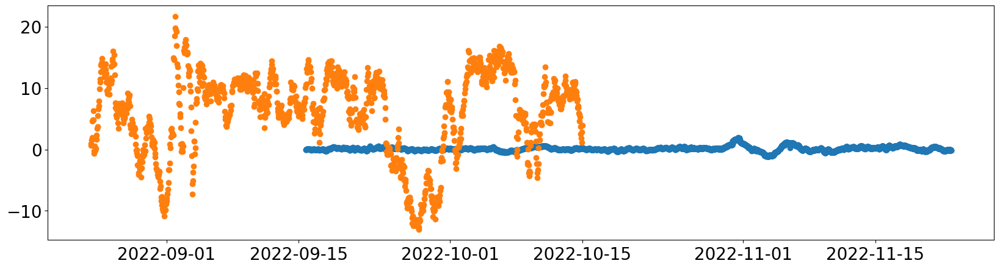

In [18]:
fig, ax= plt.subplots(figsize=[20,5])

ax.scatter(adcpsur.time, adcpsur.v10)

ax.scatter(dsH.time, dsH.u10)

Create instWIND, compare mean values, inst values to true ds

In [11]:

msk=np.isfinite(ds.WIND_CORR10)


instWIND=ds.isel(time=msk).sel(time=dsH.time, method='nearest')
instWIND=instWIND.reset_coords().resample(time='1H').mean().set_coords(['latitude','longitude'])




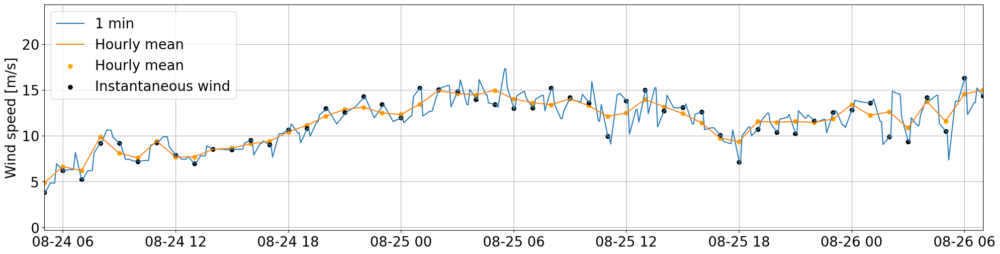

In [12]:
fig,ax=plt.subplots(figsize=[20,5], constrained_layout=True)
ax.plot(ds.time.isel(time=msk), ds.WIND_CORR10.isel(time=msk), label='1 min')

msk=np.isfinite(dsH.WIND_CORR10)
ax.plot(dsH.time.isel(time=msk), dsH.WIND_CORR10.isel(time=msk), label='Hourly mean')
ax.scatter(dsH.time.isel(time=msk), dsH.WIND_CORR10.isel(time=msk), label='Hourly mean', color='orange')



ax.scatter(instWIND.time, instWIND.WIND_CORR10, color='k', label='Instantaneous wind')

ax.grid()
ax.legend()

ax.set_ylabel('Wind speed [m/s]')

plt.xlim(dsH.time[5], dsH.time[55])

plt.savefig('figures/hourtomin.png')

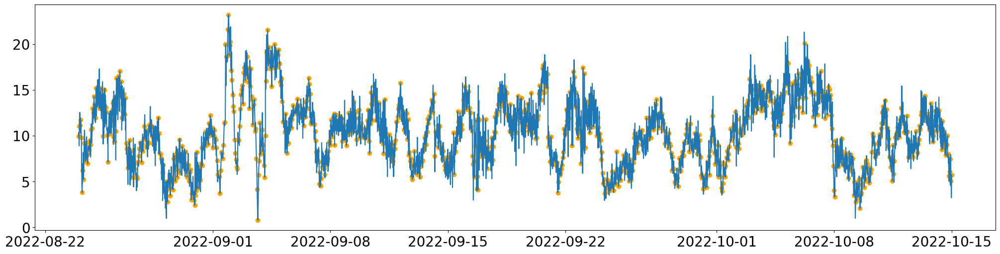

In [15]:
msk=np.isfinite(ds.WIND_CORR10)
fig,ax=plt.subplots(figsize=[20,5], constrained_layout=True)
ax.plot(ds.time.isel(time=msk), ds.WIND_CORR10.isel(time=msk), label='1 min')


ax.scatter(instWIND.time, instWIND.WIND_CORR10, color='orange')

DS stats on colocaded adcp dataset

In [21]:
print(scipy.stats.linregress(coloc3msk[0], dsadcpH.P_SEA.sel(time=np.isfinite(dsadcpH.P_SEA))))
print(scipy.stats.linregress(coloc3msk[1], dsadcpH.WIND_CORR10.sel(time=np.isfinite(dsadcpH.WIND_CORR10))))
print(scipy.stats.linregress(coloc3msk[2], dsadcpH.u10.sel(time=np.isfinite(dsadcpH.u10))))
print(scipy.stats.linregress(coloc3msk[3], dsadcpH.v10.sel(time=np.isfinite(dsadcpH.v10))))

LinregressResult(slope=0.010146882617718669, intercept=-15.119092854210407, rvalue=0.9983047142988515, pvalue=0.0, stderr=1.462615497070464e-05, intercept_stderr=1.4868295073877509)
LinregressResult(slope=0.9110549062824316, intercept=1.0419236135924965, rvalue=0.9325699464629639, pvalue=2.05447423426e-312, stderr=0.013319824103932433, intercept_stderr=0.14264199515661874)
LinregressResult(slope=1.0077883883705443, intercept=-0.358460542851061, rvalue=0.9836791735882077, pvalue=0.0, stderr=0.006962475087747416, intercept_stderr=0.06531750814715812)
LinregressResult(slope=1.0044308615943578, intercept=0.23240873412525584, rvalue=0.9620624919618741, pvalue=0.0, stderr=0.010758421964580074, intercept_stderr=0.055562537880181374)


Plot correlation for adcp colocated ds dataset

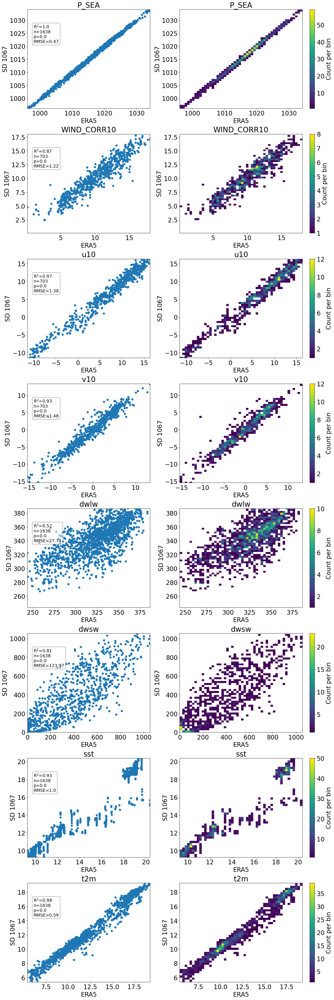

In [10]:
textstr=[]

fig, ax =plt.subplots(len(variables), 2, figsize=[15,45], constrained_layout=True)
for i in np.arange(len(variables)):
    ax[i,0].scatter(coloc3[variables[i]], dsadcpH[variables[i]])
    
#    ax[i].set_xticks(np.linspace(coloc3msk[i].min(), coloc3msk[i].max(), 5))
 #   ax[i].set_yticks(np.linspace(coloc3msk[i].min(), coloc3msk[i].max(), 5))
    
    ax[i,0].set_xlim(coloc3[variables[i]].min(), coloc3[variables[i]].max())
    ax[i,0].set_ylim(coloc3[variables[i]].min(), coloc3[variables[i]].max())
    
    ax[i,0].set_xlabel('ERA5')
    ax[i,0].set_ylabel('SD 1067')
    ax[i,0].set_title(variables[i])
    
    y_actual = coloc3msk[i] 
    y_predicted =dsadcpH[variables[i]].sel(time=np.isfinite(dsadcpH[variables[i]]))

    MSE = mean_squared_error(y_actual, y_predicted)

    RMSE = math.sqrt(MSE)
    
    
    r2=scipy.stats.linregress(coloc3msk[i], dsadcpH[variables[i]].sel(time=np.isfinite(dsadcpH[variables[i]]))).rvalue**2
    n = len(coloc3msk[i])
    p= scipy.stats.linregress(coloc3msk[i], dsadcpH[variables[i]].sel(time=np.isfinite(dsadcpH[variables[i]]))).pvalue
    
    textstr.append( 'R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'p=' + str(round(p,2))+ '\n' + 'RMSE='+ str(round(RMSE,2)) )
                              
    props = dict(boxstyle='round', facecolor='white', alpha=0.5)
    #ax[i].set_aspect('equal', adjustable="datalim")
    # place a text box in upper left in axes coords
    ax[i,0].annotate(textstr[i], xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)
    
    
    
    scat=ax[i,1].hist2d(coloc3msk[i], dsadcpH[variables[i]].sel(time=np.isfinite(dsadcpH[variables[i]])), bins=50,cmin=1, cmax=60)
    
#    ax[i].set_xticks(np.linspace(coloc3msk[i].min(), coloc3msk[i].max(), 5))
 #   ax[i].set_yticks(np.linspace(coloc3msk[i].min(), coloc3msk[i].max(), 5))
    
    ax[i,1].set_xlim(coloc3[variables[i]].min(), coloc3[variables[i]].max())
    ax[i,1].set_ylim(coloc3[variables[i]].min(), coloc3[variables[i]].max())
    
#    ax[i].set_aspect('equal', adjustable="datalim")
    
    fig.colorbar(scat[3], ax=ax[i,1], label='Counts')
    
    ax[i,1].set_xlabel('ERA5')
    ax[i,1].set_ylabel('SD 1067')
    ax[i,1].set_title(variables[i])
  

#ax[1].set_xlim(coloc3[variables[0]].min(), coloc3[variables[0]].max())
#ax[1].set_ylim(coloc3[variables[0]].min(), coloc3[variables[0]].max())

plt.savefig('figures/adcpdscoloc.png')

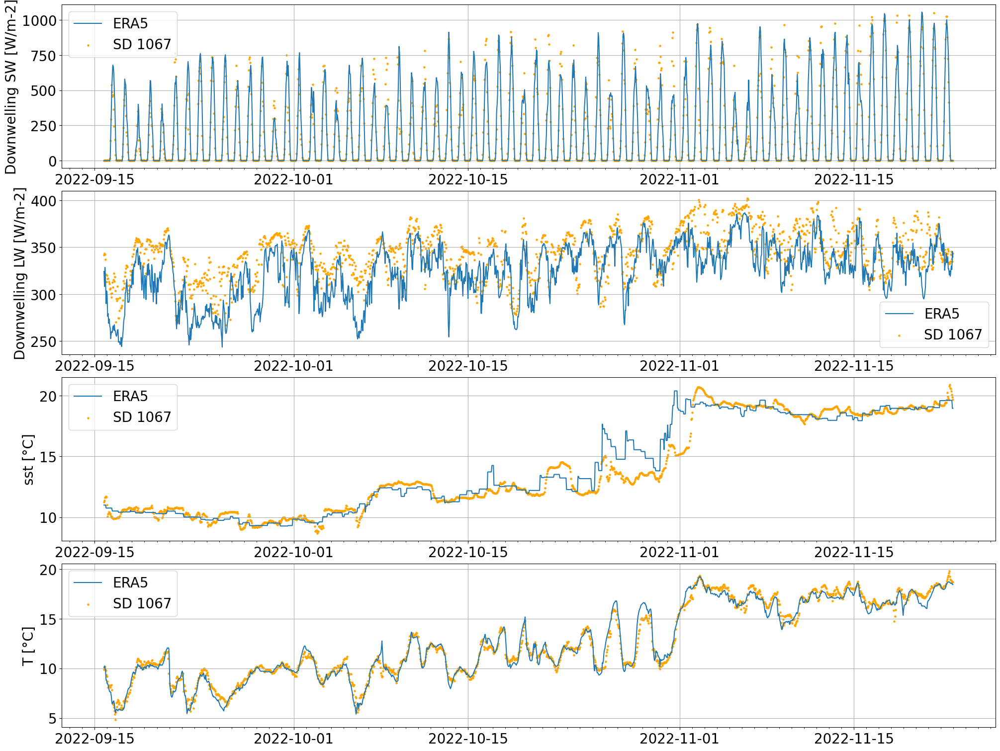

In [20]:
no=4

fig, ax=plt.subplots(no,1, figsize=[20,15], constrained_layout=True)

ax[0].plot(dsadcpH.time, coloc3.dwsw, label='ERA5')
ax[0].scatter(dsadcpH.time, dsadcpH.dwsw, s=5, c='orange', label='SD 1067')
ax[0].set_ylabel('Downwelling SW [W/m-2]')

ax[1].plot(dsadcpH.time, coloc3.dwlw, label='ERA5')
ax[1].scatter(dsadcpH.time, dsadcpH.dwlw, s=5, c='orange', label='SD 1067')
ax[1].set_ylabel('Downwelling LW [W/m-2]')

ax[2].plot(dsadcpH.time, coloc3.sst, label='ERA5')
ax[2].scatter(dsadcpH.time, dsadcpH.sst, s=5, c='orange', label='SD 1067')
ax[2].set_ylabel('sst [°C]')


ax[3].plot(dsadcpH.time, coloc3.t2m, label='ERA5')
ax[3].scatter(dsadcpH.time, dsadcpH.t2m, s=5, c='orange', label='SD 1067')
ax[3].set_ylabel('T [°C]')

for i in np.arange(no):
    ax[i].grid()
    ax[i].legend()
    ax[i].xaxis.set_minor_locator(mdates.DayLocator())
    
plt.savefig('figures/era5sdvar.png')

/tmp/ipykernel_462455/411978345.py:10: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax[i].set_xlim(coloc3[variables[i]].min(), coloc3[variables[i]].max())
/tmp/ipykernel_462455/411978345.py:11: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax[i].set_ylim(coloc3[variables[i]].min(), coloc3[variables[i]].max())
/home/michaela/sw/miniconda3/envs/michaelasenv/lib/python3.10/site-packages/scipy/stats/_stats_mstats_common.py:170: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
/home/michaela/sw/miniconda3/envs/michaelasenv/lib/python3.10/site-packages/scipy/stats/_stats_mstats_common.py:187: RuntimeWarning: divide by zero encountered in double_scalars
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


(996.14208984375, 1034.1328125)

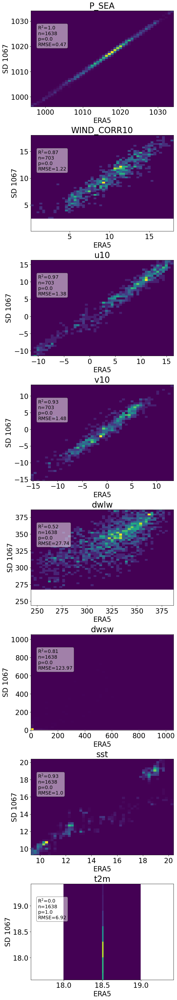

In [10]:
textstr=[]

fig, ax =plt.subplots(len(variables), figsize=[7,40], constrained_layout=True)
for i in np.arange(len(variables)):
    scat=ax[i].hist2d(coloc3msk[i], dsadcpH[variables[i]].sel(time=np.isfinite(dsadcpH[variables[i]])), bins=50)
    
#    ax[i].set_xticks(np.linspace(coloc3msk[i].min(), coloc3msk[i].max(), 5))
 #   ax[i].set_yticks(np.linspace(coloc3msk[i].min(), coloc3msk[i].max(), 5))
    
    ax[i].set_xlim(coloc3[variables[i]].min(), coloc3[variables[i]].max())
    ax[i].set_ylim(coloc3[variables[i]].min(), coloc3[variables[i]].max())
    
#    ax[i].set_aspect('equal', adjustable="datalim")
    
    #fig.colorbar(scat, ax=ax[i])
    
    ax[i].set_xlabel('ERA5')
    ax[i].set_ylabel('SD 1067')
    ax[i].set_title(variables[i])
    
    y_actual = coloc3msk[i] 
    y_predicted =dsadcpH[variables[i]].sel(time=np.isfinite(dsadcpH[variables[i]]))

    MSE = mean_squared_error(y_actual, y_predicted)

    RMSE = math.sqrt(MSE)
    
    
    r2=scipy.stats.linregress(coloc3msk[i], dsadcpH[variables[i]].sel(time=np.isfinite(dsadcpH[variables[i]]))).rvalue**2
    n = len(coloc3msk[i])
    p= scipy.stats.linregress(coloc3msk[i], dsadcpH[variables[i]].sel(time=np.isfinite(dsadcpH[variables[i]]))).pvalue
    
    textstr.append( 'R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'p=' + str(round(p,2))+ '\n' + 'RMSE='+ str(round(RMSE,2)) )
                              
    props = dict(boxstyle='round', facecolor='white', alpha=0.5)
    #ax[i].set_aspect('equal', adjustable="datalim")
    # place a text box in upper left in axes coords
    ax[i].annotate(textstr[i], xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)
  

ax[0].set_xlim(coloc3[variables[0]].min(), coloc3[variables[0]].max())
ax[0].set_ylim(coloc3[variables[0]].min(), coloc3[variables[0]].max())


Plot figures for Seb SO-CHIC presentation

In [29]:
ds

<xarray.Dataset>
Dimensions:                         (time: 131040)
Coordinates:
    latitude                        (time) float64 ...
    longitude                       (time) float64 ...
  * time                            (time) datetime64[ns] 2022-08-24 ... 2022...
    trajectory                      float32 ...
Data variables: (12/54)
    WIND_FROM_MEAN                  (time) float64 ...
    WIND_FROM_STDDEV                (time) float64 ...
    WIND_SPEED_MEAN                 (time) float64 ...
    WIND_SPEED_STDDEV               (time) float64 ...
    UWND_MEAN                       (time) float64 ...
    UWND_STDDEV                     (time) float64 ...
    ...                              ...
    WIND_CORR10                     (time) float64 ...
    u10                             (time) float64 ...
    v10                             (time) float64 ...
    SAL_ABS                         (time) float64 ...
    TEMP_CONS                       (time) float64 ...
    DENS                            (time) float64 ...
Attributes: (12/38)
    title:                     SO-CHIC 2022 NRT Surface Data
    summary:                   Southern Ocean CO2 study centered at 60*S, 0*E...
    ncei_template_version:     NCEI_NetCDF_Trajectory_Template_v2.0
    Conventions:               CF-1.6, ACDD-1.3
    netcdf_version:            4.6.2
    featureType:               trajectory
    ...                        ...
    geospatial_lat_min:        -41.6297664
    geospatial_lat_max:        -41.0866912
    geospatial_lat_units:      degrees_north
    geospatial_lon_min:        10.006752
    geospatial_lon_max:        10.418968
    geospatial_lon_units:      degrees_east

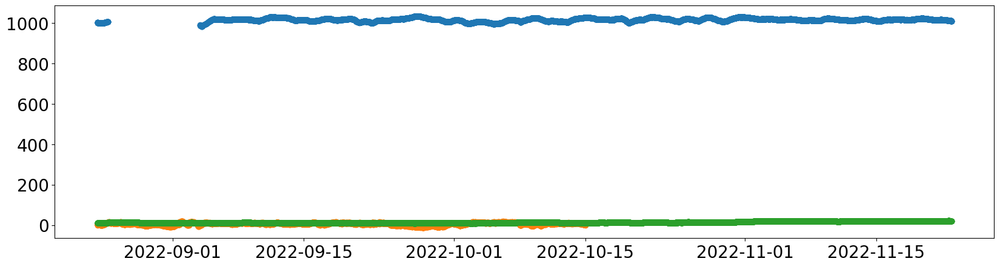

In [32]:
fig, ax=plt.subplots(figsize=[20,5])

plt.scatter(ds.time, ds.P_SEA)
#plt.plot(ds.time, ds.cur_u)
plt.scatter(ds.time, ds.UWND_MEAN)
plt.scatter(ds.time, ds.sst)

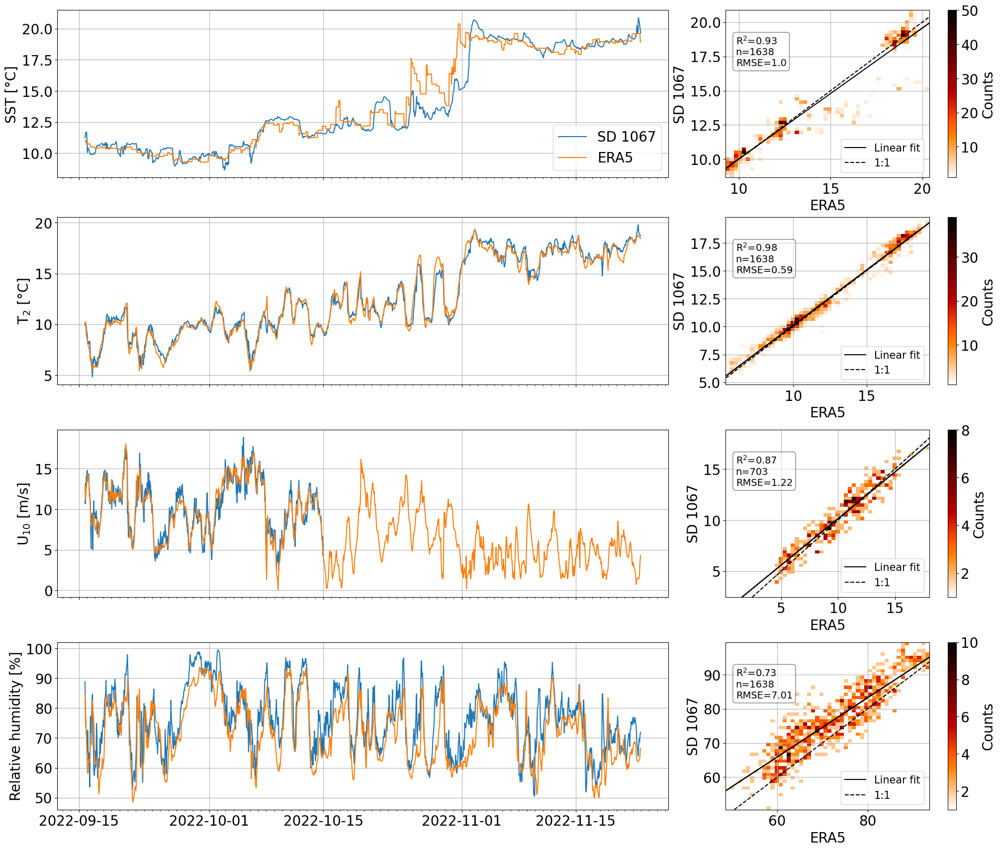

In [19]:
fig, ax = plt.subplot_mosaic([['a','a','a' ,'b'], ['c','c','c', 'd'], ['e','e','e' ,'f'], ['g','g','g', 'h']], figsize=[20,17], layout='constrained')
tims=['a','c','e', 'g']
corr=['b', 'd', 'f', 'h']
var=['sst', 't2m', 'WIND_CORR10', 'rh']
colocno=[6, 7, 1, 8] #sst, t2m, wind_corr10, rh
textstr=[]
lin=[]

for i in np.arange(len(var)):
    ax[tims[i]].plot(dsadcpH.time, dsadcpH[var[i]], label='SD 1067')
    ax[tims[i]].plot(dsadcpH.time, coloc3[var[i]], label='ERA5')
    
    scat=ax[corr[i]].hist2d(coloc3msk[colocno[i]], dsadcpH[var[i]].sel(time=np.isfinite(dsadcpH[var[i]])), bins=50,cmin=1, cmax=60, cmap='gist_heat_r')
    fig.colorbar(scat[3], ax=ax[corr[i]], label='Counts')
    
    
    #Create linear fit line and plot
    y=dsadcpH[var[i]].sel(time=np.isfinite(dsadcpH[var[i]]))
    x=coloc3msk[colocno[i]]
 
    #obtain m (slope) and b(intercept) of linear regression line
    m, b = np.polyfit(x, y, 1)

    #add linear regression line to scatterplot 
    ax[corr[i]].plot(x, m*x+b, color='k', label='Linear fit')
    
    #Create stats and statbox
    y_actual = coloc3msk[colocno[i]] 
    y_predicted =dsadcpH[var[i]].sel(time=np.isfinite(dsadcpH[var[i]]))
    RMSE = math.sqrt(mean_squared_error(y_actual, y_predicted))
    
    
    r2=scipy.stats.linregress(coloc3msk[colocno[i]], dsadcpH[var[i]].sel(time=np.isfinite(dsadcpH[var[i]]))).rvalue**2
    n = len(coloc3msk[colocno[i]])
    #p= scipy.stats.linregress(coloc3msk[colocno[i]], dsadcpH[var[i]].sel(time=np.isfinite(dsadcpH[var[i]]))).pvalue
    
    textstr.append( 'R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'RMSE='+ str(round(RMSE,2)) )
                              
    props = dict(boxstyle='round', facecolor='white', alpha=0.5)
#    ax[corr[i]].set_aspect('equal', adjustable="datalim")
    
    # place a text box in upper left in axes coords
    ax[corr[i]].annotate(textstr[i], xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)
    
    
    ax[corr[i]].set_xlabel('ERA5')
    ax[corr[i]].set_ylabel('SD 1067')
    
      #ad grid, legend, 1:1 line
    #loc='upper left')
    ax[tims[i]].xaxis.set_minor_locator(mdates.DayLocator())
    ax[tims[i]].grid()
    ax[corr[i]].grid()
    ax[corr[i]].plot(np.arange(dsadcpH[var[i]].min(), dsadcpH[var[i]].max(), 1), np.arange(dsadcpH[var[i]].min(), dsadcpH[var[i]].max(), 1) , linestyle='--', color='k', label=('1:1'))
    ax[corr[i]].legend(loc='lower right', fontsize=15 )
    
ax['a'].set_ylabel('SST [°C]')   
ax['c'].set_ylabel('T$_2$ [°C]')   
ax['e'].set_ylabel('U$_{10}$ [m/s]')      
ax['g'].set_ylabel('Relative humidity [%]') 

ax['a'].legend(loc='lower right')

    #coloc3: PSEA, WIND_CORR10, u10, v10, dwlw, dwsw, sst, t2m, rh
    
_ = [ax[i].sharex(ax['a']) for i in 'ceg']    
_ = [ax[i].tick_params(labelbottom=False) for i in "ace"]    
   
    
plt.savefig('figures/sochic.png')

## Delta sst and distance to era5 scatter for SST

In [171]:
deltasst= [0]

for i in np.arange(len(dsadcpH.sst)-1):
    deltasst.append(dsadcpH.sst[i+1]-dsadcpH.sst[i])

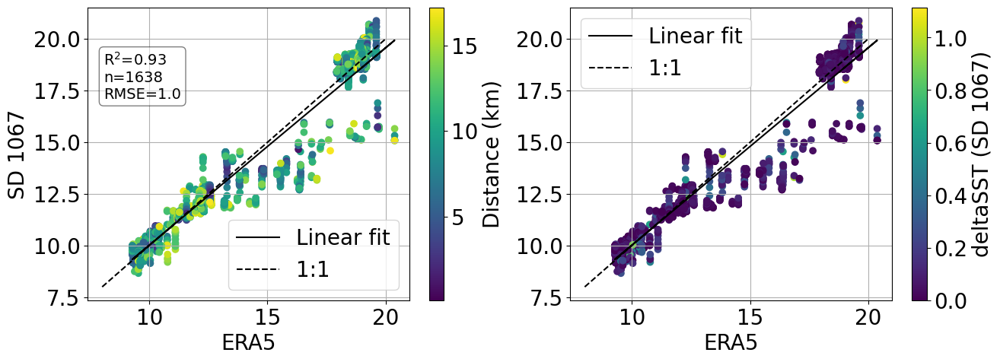

In [13]:
fig, ax=plt.subplots(1,2, figsize=[15,5])

cb=ax[0].scatter(coloc3.sst, dsadcpH.sst, c=dsadcpH.dist/1000)
fig.colorbar(cb,ax=ax[0], label=('Distance (km)'))

ax[0].set_xlabel('ERA5')
ax[0].set_ylabel('SD 1067')
ax[0].grid()

x=coloc3.sst
y=dsadcpH.sst

m, b = np.polyfit(x, y, 1)

#add linear regression line to scatterplot 
ax[0].plot(x, m*x+b, color='k', label='Linear fit')

ax[0].plot(np.arange(8, 21), np.arange(8,21), linestyle='--', color='k', label=('1:1'))

ax[0].legend(loc='lower right')


###############################



plt.scatter(coloc3.sst, dsadcpH.sst, c=np.abs(deltasst))
plt.colorbar(label=('deltaSST (SD 1067)'))

plt.xlabel('ERA5')
#plt.ylabel('SD 1067')
plt.grid()

x=coloc3.sst
y=dsadcpH.sst

m, b = np.polyfit(x, y, 1)

#add linear regression line to scatterplot 
plt.plot(x, m*x+b, color='k', label='Linear fit')

plt.plot(np.arange(8, 21), np.arange(8,21), linestyle='--', color='k', label=('1:1'))

RMSE = math.sqrt(mean_squared_error(x, y))


r2=scipy.stats.linregress(x, y).rvalue**2
n = len(x)
p= scipy.stats.linregress(x, y).pvalue

textstr=( 'R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'RMSE='+ str(round(RMSE,2)) )

props = dict(boxstyle='round', facecolor='white', alpha=0.5)
#ax[].set_aspect('equal', adjustable="datalim")

#place a text box in upper left in axes coords
ax[0].annotate(textstr, xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)

plt.legend()
plt.savefig('figures/ERA5corr.png')

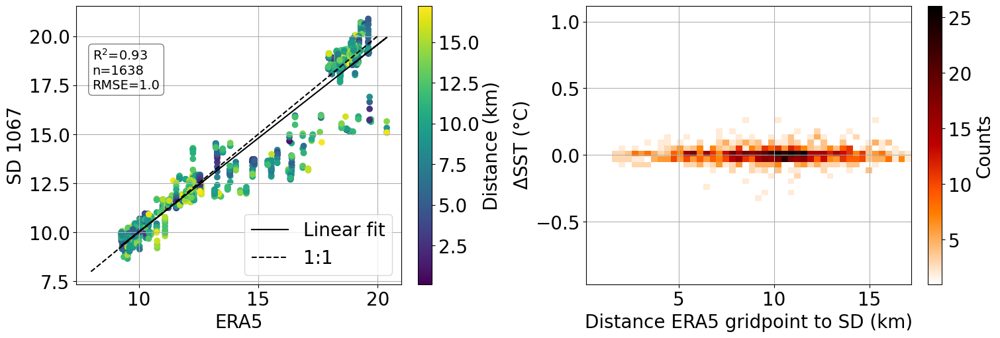

In [17]:
fig, ax=plt.subplots(1,2, figsize=[15,5], constrained_layout=True)

cb=ax[0].scatter(coloc3.sst, dsadcpH.sst, c=dsadcpH.dist/1000)
fig.colorbar(cb,ax=ax[0], label=('Distance (km)'))

ax[0].set_xlabel('ERA5')
ax[0].set_ylabel('SD 1067')
ax[0].grid()

x=coloc3.sst
y=dsadcpH.sst

m, b = np.polyfit(x, y, 1)

#add linear regression line to scatterplot 
ax[0].plot(x, m*x+b, color='k', label='Linear fit')

ax[0].plot(np.arange(8, 21), np.arange(8,21), linestyle='--', color='k', label=('1:1'))

ax[0].legend(loc='lower right')


###############################

scat=ax[1].hist2d(dsadcpH.dist/1000, (deltasst), bins=50, cmin=1, cmap='gist_heat_r')
fig.colorbar(scat[3], ax=ax[1], label=('Counts') )

ax[1].set_ylabel('$\Delta$SST (°C)')
ax[1].set_xlabel('Distance ERA5 gridpoint to SD (km)')
ax[1].grid()

x=coloc3msk[6]
y=dsadcpH.sst


RMSE = math.sqrt(mean_squared_error(x, y))


r2=scipy.stats.linregress(x, y).rvalue**2
n = len(x)
p= scipy.stats.linregress(x, y).pvalue

textstr=( 'R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'RMSE='+ str(round(RMSE,2)) )

props = dict(boxstyle='round', facecolor='white', alpha=0.5)
#ax[].set_aspect('equal', adjustable="datalim")

#place a text box in upper left in axes coords
ax[0].annotate(textstr, xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)

plt.savefig('figures/era5deltasstdist.png')

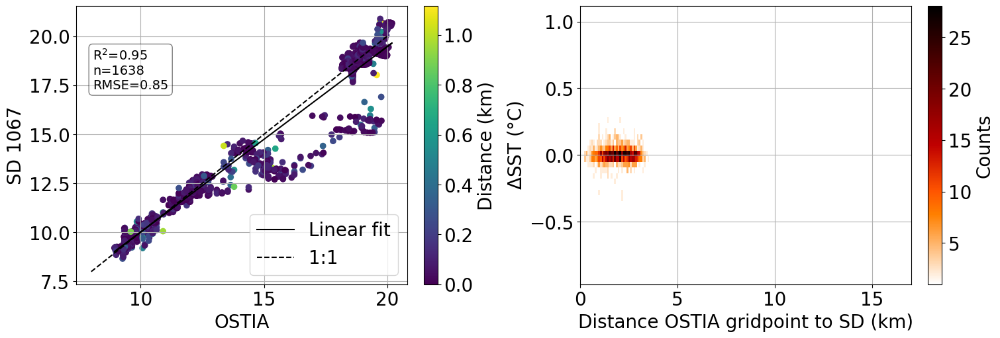

In [177]:
fig, ax=plt.subplots(1,2, figsize=[15,5], constrained_layout=True)

cb=ax[0].scatter(colocOSTIA, dsadcpH.sst, c=np.abs(deltasst))
fig.colorbar(cb,ax=ax[0], label=('Distance (km)'))

ax[0].set_xlabel('OSTIA')
ax[0].set_ylabel('SD 1067')
ax[0].grid()

x=colocOSTIA
y=dsadcpH.sst

m, b = np.polyfit(x, y, 1)

#add linear regression line to scatterplot 
ax[0].plot(x, m*x+b, color='k', label='Linear fit')

ax[0].plot(np.arange(8, 21), np.arange(8,21), linestyle='--', color='k', label=('1:1'))

ax[0].legend(loc='lower right')


###############################

scat=ax[1].hist2d(distOSTIA/1000, (deltasst), bins=50, cmin=1, cmap='gist_heat_r')
fig.colorbar(scat[3], ax=ax[1], label=('Counts') )

ax[1].set_ylabel('$\Delta$SST (°C)')
ax[1].set_xlabel('Distance OSTIA gridpoint to SD (km)')
ax[1].grid()


RMSE = math.sqrt(mean_squared_error(x, y))


r2=scipy.stats.linregress(x, y).rvalue**2
n = len(x)
p= scipy.stats.linregress(x, y).pvalue

textstr=( 'R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'RMSE='+ str(round(RMSE,2)) )

props = dict(boxstyle='round', facecolor='white', alpha=0.5)
#ax[].set_aspect('equal', adjustable="datalim")

#place a text box in upper left in axes coords
ax[0].annotate(textstr, xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)

ax[1].set_xlim(0, 17)

plt.savefig('figures/OSTIAdeltasstdist.png')

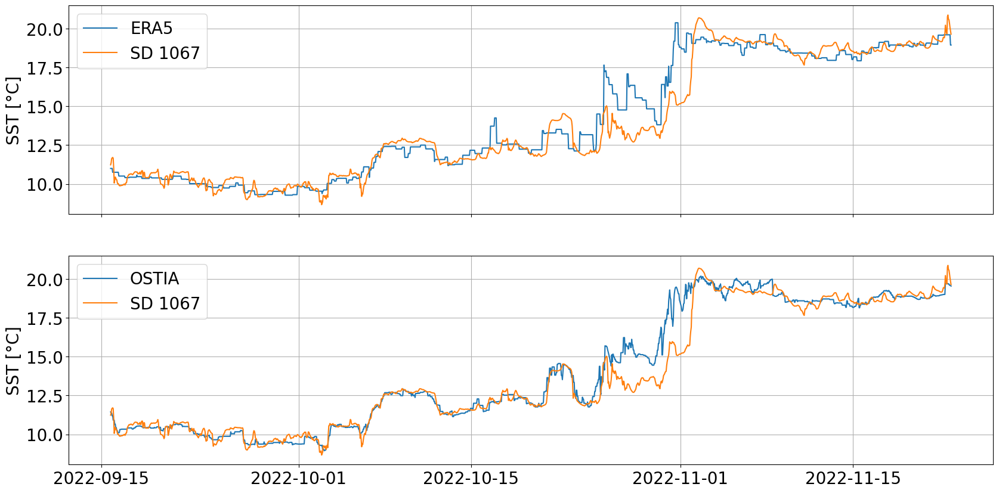

In [176]:
fig, ax=plt.subplots(2,1, figsize=[20,10], sharex=True)
ax[0].plot(dsadcpH.time, coloc3.sst, label=('ERA5'))
ax[0].plot(dsadcpH.time, dsadcpH.sst, label=('SD 1067'))


ax[1].plot(dsadcpH.time, colocOSTIA, label=('OSTIA'))
ax[1].plot(dsadcpH.time, dsadcpH.sst, label=('SD 1067'))

for i in np.arange(2):
    ax[i].grid()
    ax[i].legend()
    ax[i].set_ylabel('SST [°C]')
    
plt.savefig('figures/OSTIAvsERA5times.png')

In [22]:
plt.scatter??

Signature:
plt.scatter(
    x,
    y,
    s=None,
    c=None,
    marker=None,
    cmap=None,
    norm=None,
    vmin=None,
    vmax=None,
    alpha=None,
    linewidths=None,
    *,
    edgecolors=None,
    plotnonfinite=False,
    data=None,
    **kwargs,
)
Docstring:
A scatter plot of *y* vs. *x* with varying marker size and/or color.

Parameters
----------
x, y : float or array-like, shape (n, )
    The data positions.

s : float or array-like, shape (n, ), optional
    The marker size in points**2 (typographic points are 1/72 in.).
    Default is ``rcParams['lines.markersize'] ** 2``.

c : array-like or list of colors or color, optional
    The marker colors. Possible values:

    - A scalar or sequence of n numbers to be mapped to colors using
      *cmap* and *norm*.
    - A 2D array in which the rows are RGB or RGBA.
    - A sequence of colors of length n.
    - A single color format string.

    Note that *c* should not be a single numeric RGB or RGBA sequence
    because that

In [11]:
scipy.stats.linregress(colocOSTIA, dsadcpH.sst)

LinregressResult(slope=0.9456958414298121, intercept=0.5558821132064384, rvalue=0.976138958052765, pvalue=0.0, stderr=0.005201176908728415, intercept_stderr=0.07603547170413348)

Co-locate my hourly resampled dataset to ERA5 dataset and add to coloc array. This is masking the data to be able to calculate stats. Create text for statistics

In [69]:
variables=['P_SEA', 'WIND_CORR10', 'u10', 'v10']
coloc=[]
textstr=[]
lin=[]
std=[]
msk=(np.isfinite(dsH.P_SEA))
dsH2=dsH.isel(time=msk)

for i in np.arange(len(variables)):
    msk=(np.isfinite(dsH[variables[i]]))
    dsH1=dsH.isel(time=msk)
    coloc.append(colocate_era5_sd(dsH1, ERA5, variables[i]))
    
    lin.append(np.linspace(dsH1[variables[i]].min(), dsH1[variables[i]].max(), len(dsH1[variables[i]]))*scipy.stats.linregress(dsH1[variables[i]], coloc[i]).slope+scipy.stats.linregress(dsH1[variables[i]], coloc[i]).intercept)
    #lin.append(np.sort(coloc[i])*scipy.stats.linregress(np.sort(dsH1[variables[i]]), np.sort(coloc[i])).slope+scipy.stats.linregress(np.sort(dsH1[variables[i]]), np.sort(coloc[i])).intercept)
    std.append(scipy.stats.linregress(dsH1[variables[i]], coloc[i]).stderr)
    
    print(scipy.stats.linregress(dsH1[variables[i]], coloc[i]))
    r2=scipy.stats.linregress(dsH1[variables[i]], coloc[i]).rvalue**2
    n = len(coloc[i])
    p= scipy.stats.linregress(dsH1[variables[i]], coloc[i]).pvalue
    textstr.append('R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'p=' + str(p))
    


100%|██████████████████████████████████████████████████████| 1951/1951 [00:08<00:00, 238.47it/s]


LinregressResult(slope=0.9839597917273616, intercept=16.5007720478352, rvalue=0.9984549139862442, pvalue=0.0, stderr=0.0012404134926654212, intercept_stderr=1.2605210227844788)


100%|██████████████████████████████████████████████████████| 1249/1249 [00:05<00:00, 235.92it/s]


LinregressResult(slope=0.9377402314914681, intercept=0.41503953331188725, rvalue=0.9330559056032398, pvalue=0.0, stderr=0.010238114886691723, intercept_stderr=0.11144246530303503)


100%|██████████████████████████████████████████████████████| 1249/1249 [00:05<00:00, 235.13it/s]


LinregressResult(slope=0.9476985819440993, intercept=0.4947014682041022, rvalue=0.9791314780814876, pvalue=0.0, stderr=0.005570307356581939, intercept_stderr=0.05065299947820021)


100%|██████████████████████████████████████████████████████| 1249/1249 [00:05<00:00, 235.33it/s]

LinregressResult(slope=0.925919106211974, intercept=-0.20148776912820177, rvalue=0.9673353036239489, pvalue=0.0, stderr=0.0068713375996866085, intercept_stderr=0.04045786592022793)


Run for instWIND stats

In [ ]:
msk=np.isfinite(instWIND.WIND_CORR10)

colocIW=colocate_era5_sd(instWIND.isel(time=msk), ERA5, 'WIND_CORR10')

scipy.stats.linregress(instWIND.WIND_CORR10.isel(time=msk), colocIW)   

r2=scipy.stats.linregress(instWIND.WIND_CORR10.isel(time=msk), colocIW).rvalue**2
n = len(colocIW)
p= scipy.stats.linregress(instWIND.WIND_CORR10.isel(time=msk), colocIW).pvalue
textstr.append('R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'p=' + str(p))

Plot: Compare ERA5 to ds

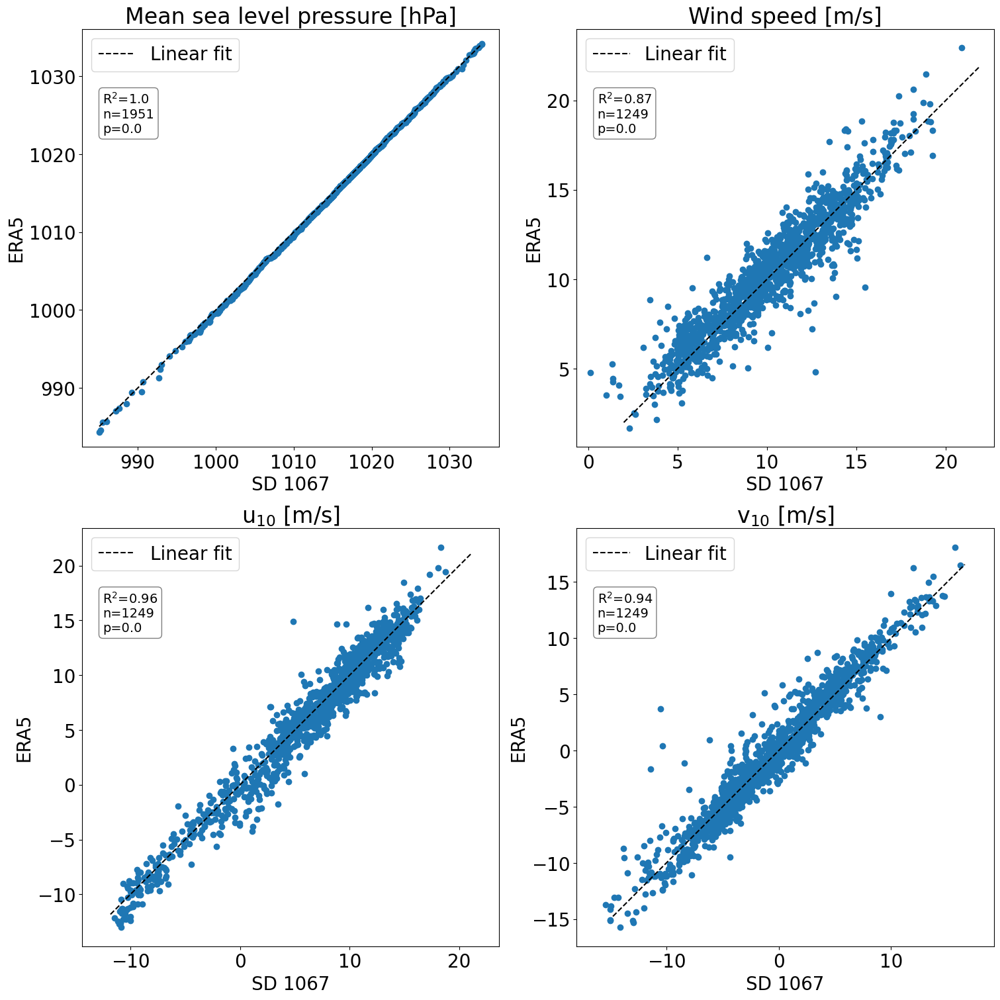

In [70]:
fig, ax=plt.subplots(2,2, figsize=(15,15), constrained_layout=True)
c='k'
l='--'
linearlabel='Linear fit'

ax[0,0].scatter(np.sort(coloc[0]), np.sort(dsH2.P_SEA))
ax[0,0].set_aspect('equal', adjustable="datalim")
ax[0,0].plot(lin[0], np.linspace(lin[0].min(), lin[0].max(), len(lin[0])), c=c, linestyle=l, label=linearlabel)

#ax[0,0].plot(np.arange(980, 1040,1), np.arange(980, 1040,1), c=c, linestyle=l, label=linearlabel)
ax[0,0].set_title('Mean sea level pressure [hPa]')
ax[0,0].legend()
ax[0,0].set_ylabel('ERA5')
ax[0,0].set_xlabel('SD 1067')


ax[0,1].scatter(coloc[1], dsH1.WIND_CORR10)
ax[0,1].set_aspect('equal', adjustable="datalim")
#ax[0,1].plot(np.arange(22), np.arange(22), c=c, linestyle=l, label=linearlabel)
ax[0,1].plot(lin[1], np.linspace(lin[1].min(), lin[1].max(), len(lin[1])), c=c, linestyle=l, label=linearlabel)


ax[0,1].set_title('Wind speed [m/s]')
ax[0,1].legend()
ax[0,1].set_ylabel('ERA5')
ax[0,1].set_xlabel('SD 1067')


ax[1,0].scatter(coloc[2], dsH1.u10)
ax[1,0].set_aspect('equal', adjustable="datalim")
#ax[1,0].plot(np.arange(-15,22), np.arange(-15,22), c=c, linestyle=l, label=linearlabel)
ax[1,0].plot(lin[2], np.linspace(lin[2].min(), lin[2].max(), len(lin[2])), c=c, linestyle=l, label=linearlabel)

ax[1,0].set_title('u$_{10}$ [m/s]')
ax[1,0].legend()
ax[1,0].set_ylabel('ERA5')
ax[1,0].set_xlabel('SD 1067')


ax[1,1].scatter(coloc[3], dsH1.v10)
ax[1,1].set_aspect('equal', adjustable="datalim")
#ax[1,1].plot(np.arange(-15, 22), np.arange(-15, 22), c=c, linestyle=l, label=linearlabel)
ax[1,1].plot(lin[3], np.linspace(lin[3].min(), lin[3].max(), len(lin[3])), c=c, linestyle=l, label=linearlabel)

ax[1,1].set_title('v$_{10}$ [m/s]')
ax[1,1].legend()
ax[1,1].set_ylabel('ERA5')
ax[1,1].set_xlabel('SD 1067')


props = dict(boxstyle='round', facecolor='white', alpha=0.5)

# place a text box in upper left in axes coords
ax[0,0].annotate(textstr[0], xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)

ax[0,1].annotate(textstr[1], xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)

ax[1,0].annotate(textstr[2], xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)



ax[1,1].annotate(textstr[3], xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)

#ax[1].plot(np.arange(20), np.arange(20), c='r')
#ax[0].plot(np.arange(980, 1040,1), np.arange(980, 1040,1), c='r')

#ax[1].set_ylim(0,20)
#ax[1].set_xlim(0,20)
plt.savefig('figures/ERA5SD.png')

Instantaneous values compared to ERA5

Text(0.05, 0.85, 'R$^2$=0.83\nn=1243\np=0.0')

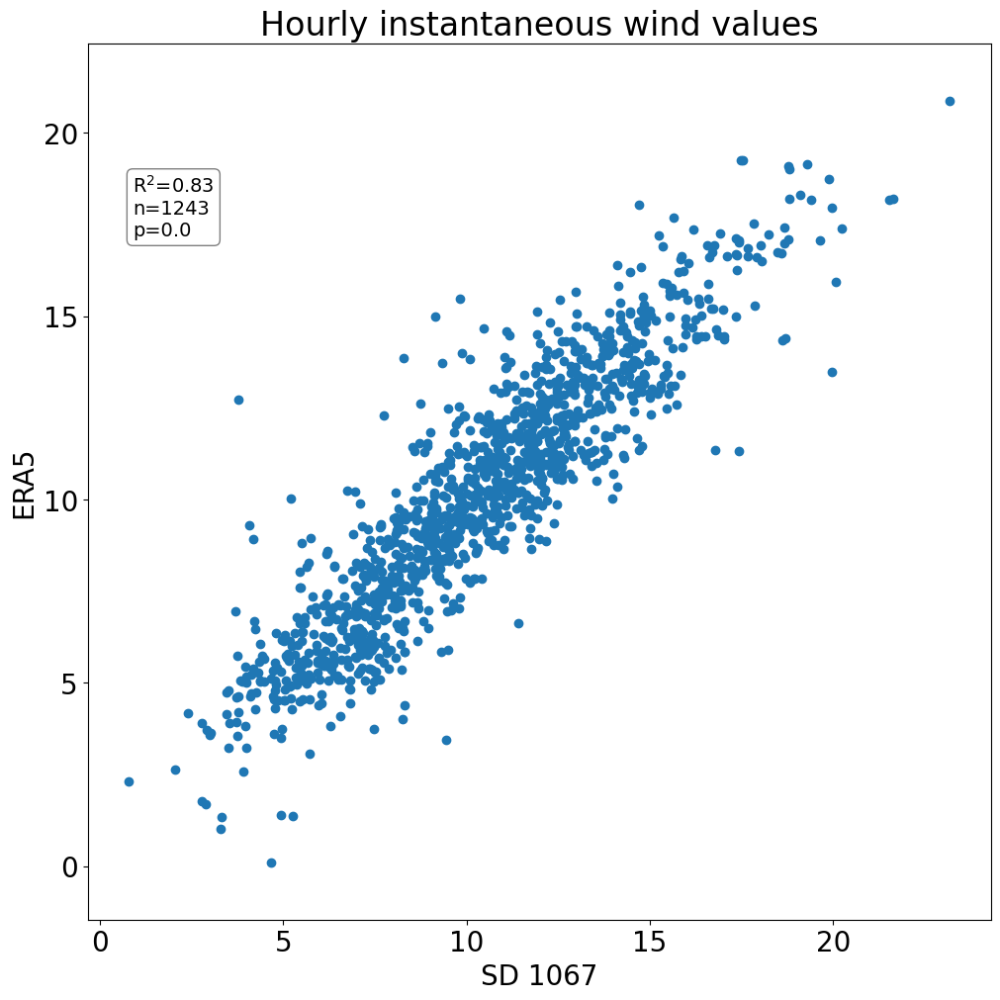

In [52]:
fig, ax=plt.subplots(1,1, figsize=(10,10), constrained_layout=True)
c='k'
l='--'
linearlabel='Linear fit'
msk=np.isfinite(instWIND.WIND_CORR10)

ax.scatter(instWIND.WIND_CORR10.isel(time=msk), colocIW )
ax.set_aspect('equal', adjustable="datalim")
#ax[0,0].plot(lin[0], np.linspace(lin[0].min(), lin[0].max(), len(lin[0])), c=c, linestyle=l, label=linearlabel)

#ax[0,0].plot(np.arange(980, 1040,1), np.arange(980, 1040,1), c=c, linestyle=l, label=linearlabel)
ax.set_title('Hourly instantaneous wind values')
ax.set_ylabel('ERA5')
ax.set_xlabel('SD 1067')

props = dict(boxstyle='round', facecolor='white', alpha=0.5)

# place a text box in upper left in axes coords
ax.annotate(textstr[4], xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)

RMSE calculations

In [54]:
    
y_actual = coloc[0] 
y_predicted =dsH2.P_SEA

MSE = mean_squared_error(y_actual, y_predicted)

RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)

y_actual = coloc[1]
y_predicted = dsH1.WIND_CORR10

MSE = mean_squared_error(y_actual, y_predicted)

RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)

y_actual = dsH1.u10
y_predicted =coloc[2]

MSE = mean_squared_error(y_actual, y_predicted)

RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)

y_actual = dsH1.v10
y_predicted =coloc[3]

MSE = mean_squared_error(y_actual, y_predicted)

RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)

msk=np.isfinite(instWIND.WIND_CORR10)
y_actual = instWIND.WIND_CORR10.isel(time=msk)
y_predicted =colocIW

MSE = mean_squared_error(y_actual, y_predicted)

RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)

Root Mean Square Error:

0.475770122414864
Root Mean Square Error:

1.2588648653866032
Root Mean Square Error:

1.3895702020896348
Root Mean Square Error:

1.501217728717324
Root Mean Square Error:

1.481244698793845


Plot T & S rho-scaled + rho

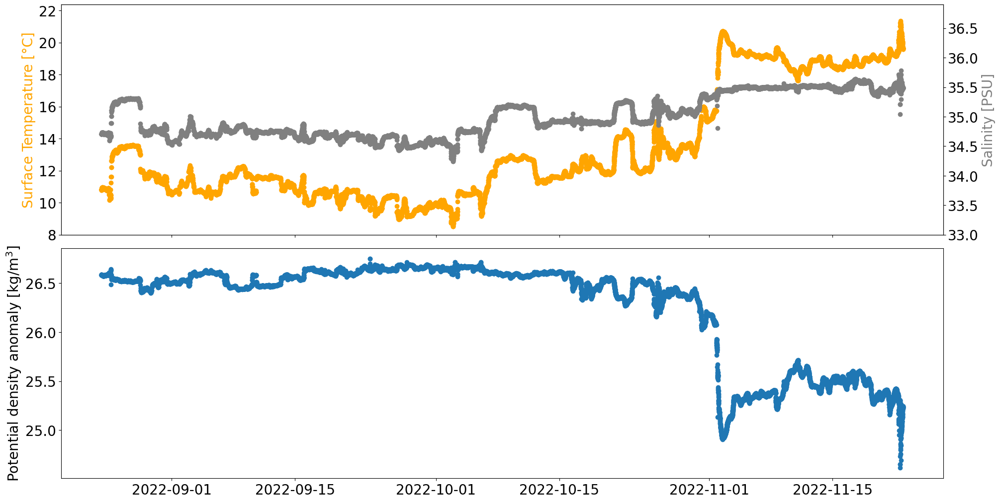

In [9]:
tmax=22
tmin=8
smax=37
smin=33

beta= gsw.beta(ds.SAL_ABS, ds.TEMP_CONS, 0).mean()
alpha= gsw.alpha(ds.SAL_ABS, ds.TEMP_CONS, 0).mean()
deltaT=(beta/alpha)*(smax-smin)
deltaS=(alpha/beta)*(tmax-tmin)


salc='grey' #salinity
#tempairc='steelblue' #airtemp
tempsurc='orange' #surfacetemp

scattersize=0.7 #scatter markersizes
#cmap = mpl.colors.ListedColormap(['salmon', 'khaki', 'skyblue','mediumpurple', 'salmon']) #winddirection colors
#cmap = matplotlib.colormaps['Accent']
#bounds = [0, 45, 135, 225, 315, 360] #limits for colors
#norm = mpl.colors.BoundaryNorm(bounds, cmap.N) 

fig, ax=plt.subplots(2,1, figsize=[20,10], constrained_layout=True, sharex=True)


ax[0].scatter(ds.time, ds.TEMP_SBE37_MEAN, c=tempsurc)
ax[0].set_ylabel('Surface Temperature [°C]', c=tempsurc)
#ax[0].grid()
#ax[0].legend(loc=l)
ax[0].set_ylim(tmin, tmin+deltaT)

#Ax0 axel nr två, salt
sal = ax[0].twinx()
sal.scatter(ds.time, ds.SAL_SBE37_MEAN, c=salc, label='Salinity (TSG)')
sal.set_ylim([smin, smin+deltaS ])
sal.set_ylabel('Salinity [PSU]', c=salc)
#sal.legend(loc='lower right')

ax[1].scatter(ds.time, ds.DENS-1000)
ax[1].set_ylabel('Potential density anomaly [kg/m$^3$]')
#plt.scatter(ds.time, ds.DENS-1000)

plt.savefig('figures/TSD.png')

Calculate directions of current and wind

In [11]:
dirH=wind_direction(dsH.VWND_MEAN, dsH.UWND_MEAN)
dirFULL= wind_direction(ds.VWND_MEAN, ds.UWND_MEAN)
adcpdir=wind_direction(adcpsur.vel_north, adcpsur.vel_east)
currentspeed=((adcpsur.vel_east.values**2)+(adcpsur.vel_north.values**2))**0.5

Plot surface currents

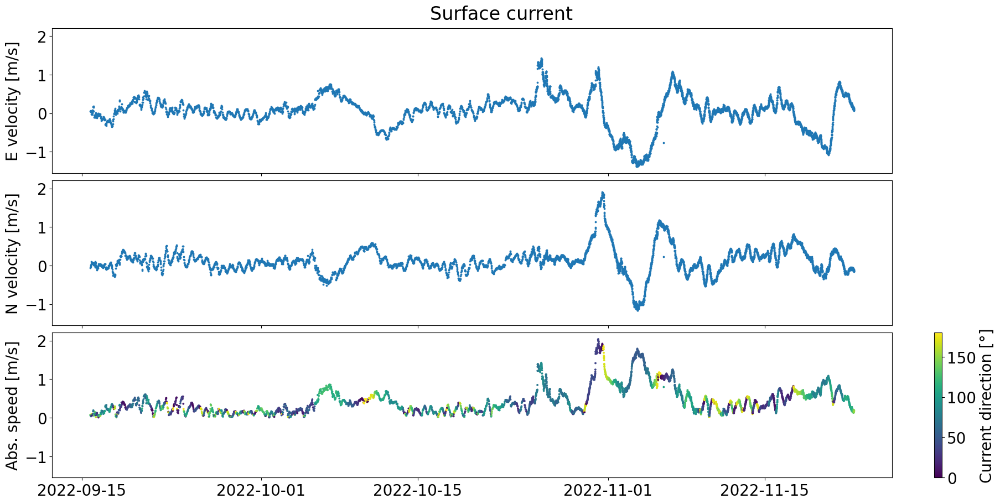

In [12]:
fig, ax=plt.subplots(3,1, figsize=[18,9], sharex=True, sharey=True, constrained_layout=True )

ax[0].scatter(adcpsur.time, adcpsur.vel_east, s=3)
ax[1].scatter(adcpsur.time, adcpsur.vel_north, s=3)
#ax[3].scatter(adcpsur.time, adcpdir-180, s=3)
cdir=ax[2].scatter(adcpsur.time, currentspeed, s=3, c=adcpdir-180)


ax[0].set_ylabel('E velocity [m/s]')
ax[1].set_ylabel('N velocity [m/s]')
ax[2].set_ylabel('Abs. speed [m/s]')

fig.colorbar(cdir, ax=ax[2], label='Current direction [°]')

plt.suptitle('Surface current')
plt.savefig('figures/surfcurrent.png')

Plot parameters. Wind is brought up to 10 meters, temperature not yet. Skin temperature measurements where incomplete

Text(0, 0.5, 'Wind speed (10m) [m/s)]')

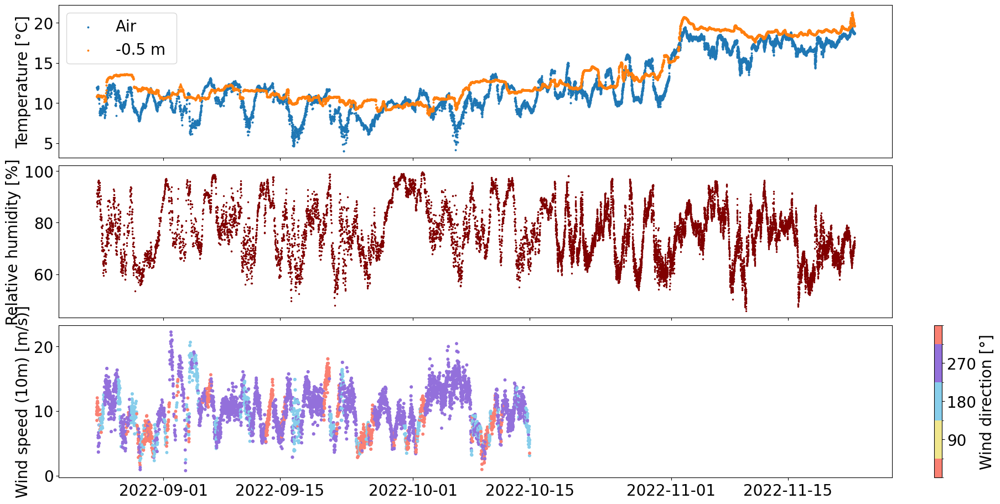

In [13]:
fig, ax= plt.subplots(3, 1,figsize=[18,9], constrained_layout=True, sharex=True)

ax[0].scatter(ds.time, ds.TEMP_AIR_MEAN, s=3, label='Air')
ax[0].scatter(ds.time, ds.TEMP_SBE37_MEAN, s=3, label='-0.5 m ')
#ax[0].scatter(ds.time, ds.TEMP_IR_SEA_WING_UNCOMP_MEAN, s=3, label='Skin ') no data

#ax[0].scatter(ds.time, ds.TEMP_DEPTH_HALFMETER_MEAN, s=5)
ax[0].legend()
ax[0].set_ylabel('Temperature [°C]')

ax[1].scatter(ds.time, ds.RH_MEAN, s=2, color='maroon')
ax[1].set_ylabel('Relative humidity [%]')

#ax[2].scatter(ds.time, ds.UWND_MEAN, s=2)
#v=ax[2].twinx()
cmap = matplotlib.colors.ListedColormap(['salmon', 'khaki', 'skyblue','mediumpurple', 'salmon']) #winddirection colors
#cmap = matplotlib.colormaps['Accent']
bounds = [0, 45, 135, 225, 315, 360] #limits for colors
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N) 

windspeed=ax[2].scatter(ds.time, wind_sp_to_10m(ds.WIND_SPEED_MEAN), s=10, c=dirFULL, cmap=cmap, norm=norm)
fig.colorbar(windspeed, ax=ax[2], label='Wind direction [°]', ticks=[90,180, 270], spacing='proportional')#, pad=-0.0001)
ax[2].set_ylabel('Wind speed (10m) [m/s)]')

# AirSeaFluxCode

Import ASFC, input data-variables

In [33]:
from AirSeaFluxCode import AirSeaFluxCode

# Relative windspeed and colocated ds to adcp data THIS IS THE DATA TO WORK WITH

Turn ASFC into xarray and create variables for the input that is going to primes and bar values 

In [34]:
hum1=dsadcpH.rh.values

spd= coloc3.abs_rel.values#relative windpeed
SST= dsadcpH.sst.values
T= dsadcpH.t2m.values #seasurface temperature in kelvin. Will convert iff less than 200
hum= ['rh', hum1 ] #chose rh, spec hum or dew point temp.
P= dsadcpH.P_SEA.values #air pressure in hPA
SST_fl ='bulk' #string, 'bulk' or 'skin' for input
meth= 'C35' #string, choose method of calcultion
lat= dsadcpH.latitude.values #latitude
hin=([10, 2.3, 2.3])  #sensor heights in m, 3x1 same order as output 
hout=10 #output height, default is 10m
Rl=dsadcpH.dwlw.values#longwave dwn radiation
Rs= dsadcpH.dwsw.values # shortwave dwn radiation
cskin= 1 #0 cool skin adj off
skin='C35' #'C35' #string "C35", "ecmwf" or "Beljaars"
wl=1 #warm layer off 0 (default)
gust= None# [x,beta,zi,ustbj] #Check documentation
qmeth= 'Buck2' #string, saturation evaporation method
tol= None #float, tolerance limits for fluxes and heights, check documentation
maxiter= 30 #number fo iterations
out= 0 #int, set 0 to set points thathave not converged
out_var= None #str, define pandas arrayod variables for output. There i a default for cskin and gust off. Check documentation
L=None #str, M-O definition option. 'tsrv' is default

ASFC=AirSeaFluxCode(spd, T, SST, SST_fl, meth, lat=lat, hum=hum, P=P,
                   hin=hin, hout=hout, Rl=Rl, Rs=Rs, cskin=cskin, skin=skin, wl=wl,
                   gust=gust, qmeth=qmeth, tol=tol, maxiter=maxiter, out=out,
                   out_var=out_var, L=L)


ASFC['time']=dsadcpH.time.values
ASFC['latitude']=dsadcpH.latitude.values
ASFC['longitude']=dsadcpH.longitude.values
ASFC=ASFC.to_xarray().swap_dims({'index':'time'}).drop('index').set_coords(['longitude', 'latitude'])
ASFC['skin']=(SST-(ASFC.dter-273.15)+(ASFC.dtwl-273.15))
ASFC['deltaT']=(ASFC.tref-273.15)-ASFC.skin
ASFC['deltaq']=ASFC.qref-ASFC.qsea

In [35]:
ASFC=ASFC.rename({'Rs':'dwsw'})
ASFC=ASFC.rename({'Rl':'dwlw'})
ERA5['sensible']=xr.open_dataset('MasterH23/ERA5flux.nc').msshf
ERA5['latent']=xr.open_dataset('MasterH23/ERA5flux.nc').mslhf

Load coloc4

In [42]:
coloc4=pd.read_table('MasterH23/coloc4.csv', delimiter=',').to_xarray()
coloc4['time']=('index', dsadcpH.time.values)
coloc4=coloc4.swap_dims({'index':'time'})

Remake coloc4 and save

In [37]:
variables=['dwsw', 'dwlw', 'sensible', 'latent' ]
coloc4=pd.DataFrame(columns=variables)
#msk=np.isfinite(dsadcpH.P_SEA)

for i in np.arange(len(variables)):
    #coloc3[variables[i]]=colocate_era5_sd(dsadcpH.sel(time=msk), ERA5, variables[i])
    coloc4[variables[i]]=colocate_era5_sd(ASFC, ERA5, variables[i])
    

coloc4.to_csv('MasterH23/coloc4.csv')

100%|█████████████████████████████████████████████████████████████████████| 1638/1638 [00:08<00:00, 203.84it/s]


Coloc4msk

In [38]:
variables=['dwsw', 'dwlw', 'sensible', 'latent' ]
coloc4msk=[] 
for i in np.arange(len(variables)):
    msk=np.isfinite(ASFC[variables[i]])
    coloc4msk.append(colocate_era5_sd(ASFC.sel(time=msk), ERA5, variables[i]))

100%|█████████████████████████████████████████████████████████████████████| 1637/1637 [00:08<00:00, 200.81it/s]


In [43]:
night=0 #define limit for nighttime values
#msk=np.isfinite(ASFC['dwsw'])
coloc5=coloc4.sel(time=np.isfinite(ASFC['dwsw']))
ASFC2=ASFC.sel(time=np.isfinite(ASFC['dwsw']))

dwswE5day=coloc5.sel(time=((coloc5.dwsw>night)))
dwswday=ASFC2['dwsw'].sel(time=((coloc5.dwsw>night)))

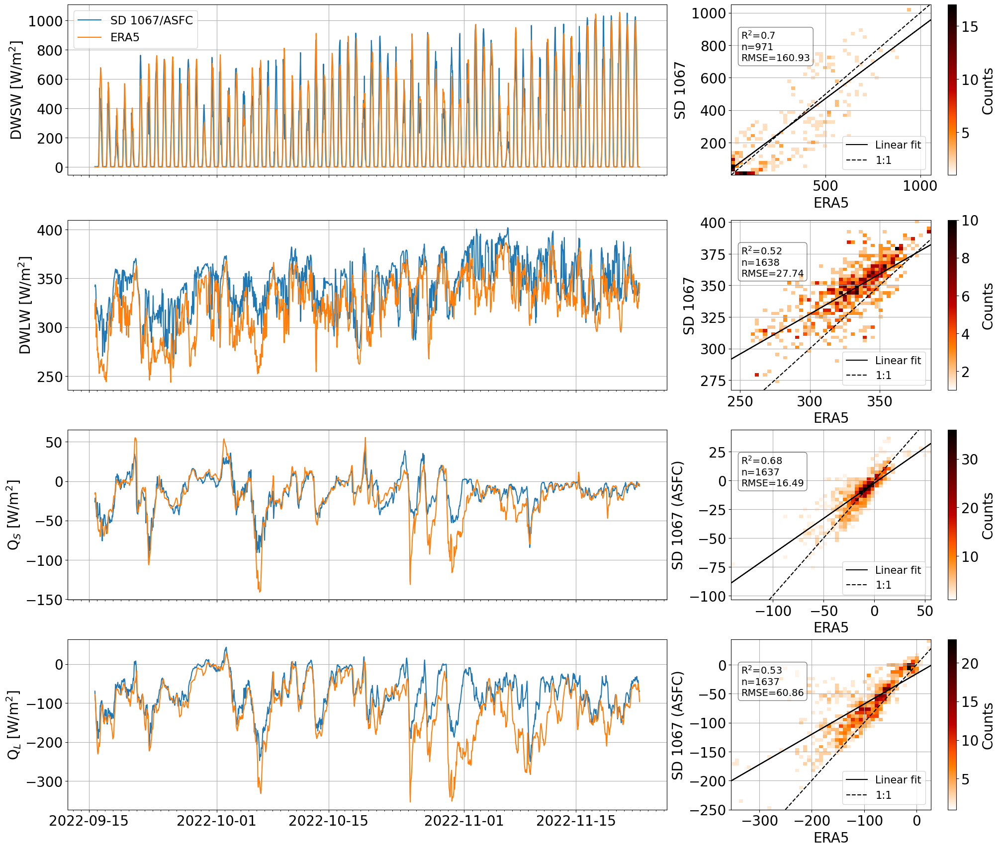

In [48]:
fig, ax = plt.subplot_mosaic([['a','a','a' ,'b'], ['c','c','c', 'd'], ['e','e','e' ,'f'], ['g','g','g', 'h']], figsize=[20,17], layout='constrained')
tims=['c','e', 'g']
corr=['d', 'f', 'h']
var=['dwlw', 'sensible', 'latent']
colocno=[1, 2, 3] #sst, t2m, wind_corr10, rh
textstr=[]
lin=[]

for i in np.arange(len(var)):
    ax[tims[i]].plot(ASFC.time, ASFC[var[i]], label='ASFC')
    ax[tims[i]].plot(ASFC.time, coloc4[var[i]], label='ERA5')
    
    scat=ax[corr[i]].hist2d(coloc4msk[colocno[i]], ASFC[var[i]].sel(time=np.isfinite(ASFC[var[i]])), bins=50,cmin=1, cmax=60, cmap='gist_heat_r')
    fig.colorbar(scat[3], ax=ax[corr[i]], label='Counts')
    
    
    #Create linear fit line and plot
    y=ASFC[var[i]].sel(time=np.isfinite(ASFC[var[i]]))
    x=coloc4msk[colocno[i]]
 
    #obtain m (slope) and b(intercept) of linear regression line
    m, b = np.polyfit(x, y, 1)

    #add linear regression line to scatterplot 
    ax[corr[i]].plot(x, m*x+b, color='k', label='Linear fit')
    
    #Create stats and statbox
    y_actual = coloc4msk[colocno[i]] 
    y_predicted =ASFC[var[i]].sel(time=np.isfinite(ASFC[var[i]]))
    RMSE = math.sqrt(mean_squared_error(y_actual, y_predicted))
    
    
    r2=scipy.stats.linregress(coloc4msk[colocno[i]], ASFC[var[i]].sel(time=np.isfinite(ASFC[var[i]]))).rvalue**2
    n = len(coloc4msk[colocno[i]])
    #p= scipy.stats.linregress(coloc3msk[colocno[i]], dsadcpH[var[i]].sel(time=np.isfinite(dsadcpH[var[i]]))).pvalue
    
    textstr.append( 'R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'RMSE='+ str(round(RMSE,2)) )
                              
    props = dict(boxstyle='round', facecolor='white', alpha=0.5)
#    ax[corr[i]].set_aspect('equal', adjustable="datalim")
    
    # place a text box in upper left in axes coords
    ax[corr[i]].annotate(textstr[i], xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)
   
    
    ax[corr[i]].set_xlabel('ERA5')
    ax[corr[i]].set_ylabel('SD 1067 (ASFC)')
    ax[corr[i]].plot(np.arange(ASFC[var[i]].min(), ASFC[var[i]].max(), 1), np.arange(ASFC[var[i]].min(), ASFC[var[i]].max(), 1) , linestyle='--', color='k', label=('1:1'))
      #ad grid, legend, 1:1 line
#    ax[tims[i]].legend()#loc='upper left')
    ax[tims[i]].xaxis.set_minor_locator(mdates.DayLocator())
    ax[tims[i]].grid()
    ax[corr[i]].grid()
    
    ax[corr[i]].legend(loc='lower right', fontsize=15 )

    
ax['a'].set_ylabel('DWSW [W/m$^2$]')   
ax['c'].set_ylabel('DWLW [W/m$^2$]')   
ax['e'].set_ylabel('Q$_S$ [W/m$^2$]')      
ax['g'].set_ylabel('Q$_L$ [W/m$^2$]') 


    #coloc3: PSEA, WIND_CORR10, u10, v10, dwlw, dwsw, sst, t2m, rh
    
   
#for dwsw daytime


ax['a'].plot(ASFC.time, ASFC.dwsw, label='SD 1067/ASFC')
ax['a'].plot(ASFC.time, coloc4.dwsw, label='ERA5')


scat=ax['b'].hist2d(dwswE5day.dwsw.values, dwswday, bins=50,cmin=1, cmax=40, cmap='gist_heat_r')
fig.colorbar(scat[3], ax=ax['b'], label='Counts')


#Create linear fit line and plot
y=dwswday.values
x=dwswE5day.dwsw.values

#obtain m (slope) and b(intercept) of linear regression line
m, b = np.polyfit(x, y, 1)

#add linear regression line to scatterplot 
ax['b'].plot(x, m*x+b, color='k', label='Linear fit')

#Create stats and statbox
y_actual = x
y_predicted = y
RMSE = math.sqrt(mean_squared_error(y_actual, y_predicted))


r2=scipy.stats.linregress(dwswE5day.dwsw.values, dwswday).rvalue**2
n = len(dwswE5day.dwsw.values)


textstr=( 'R$^2$='+ str(round(r2, 2)) + '\n'+ 'n=' +str(n) + '\n' + 'RMSE='+ str(round(RMSE,2)) )

props = dict(boxstyle='round', facecolor='white', alpha=0.5)
#    ax[corr[i]].set_aspect('equal', adjustable="datalim")

# place a text box in upper left in axes coords
ax['b'].annotate(textstr, xy=(0.05, 0.85), xycoords='axes fraction', bbox=props, va='top',fontsize=14)
ax['b'].plot(np.arange(ASFC.dwsw.min(), ASFC.dwsw.max(), 1), np.arange(ASFC.dwsw.min(), ASFC.dwsw.max(), 1) , linestyle='--', color='k', label=('1:1'))
#ad grid, legend, 1:1 line
ax['a'].legend(fontsize='small')#loc='upper left')
ax['a'].xaxis.set_minor_locator(mdates.DayLocator())
ax['a'].grid()
ax['b'].grid()

ax['b'].legend(loc='lower right', fontsize=15 )   
ax['b'].set_xlabel('ERA5')
ax['b'].set_ylabel('SD 1067')
ax['d'].set_ylabel('SD 1067')

#ax['a'].sharex(ax['c'])
    
_ = [ax[i].sharex(ax['a']) for i in 'ceg']    
_ = [ax[i].tick_params(labelbottom=False) for i in "ace"]
#_ = [ax[i].sharey(ax['g']) for i in 'e'] 
#_ = [ax[i].tick_params(labelleft=False) for i in "BD"]
    
    
plt.savefig('figures/sochicflux.png')

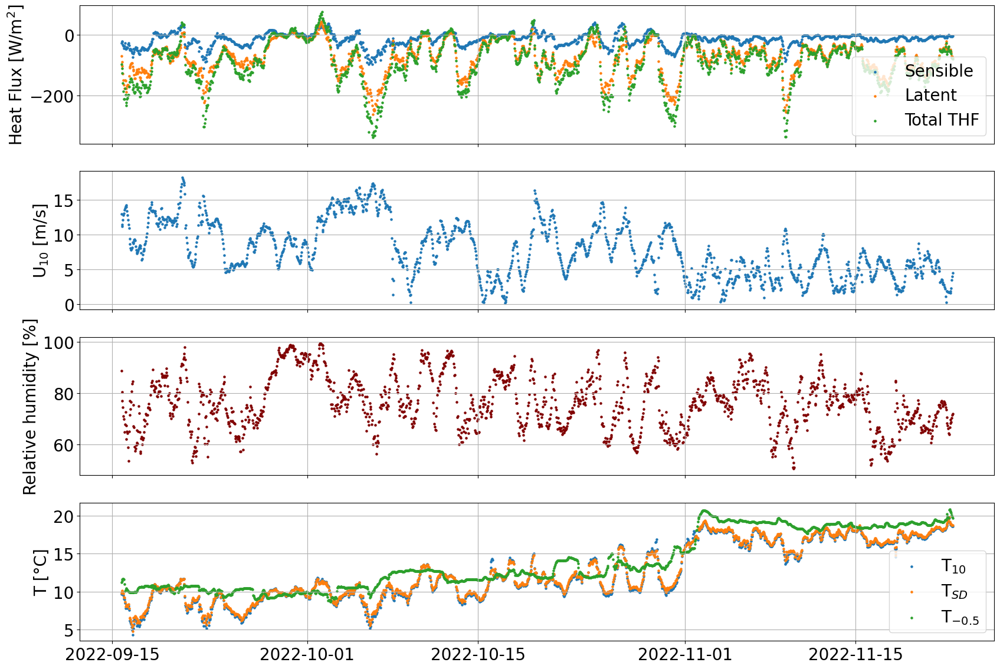

In [45]:
s=5
plots=4

fig, ax= plt.subplots(plots,1, figsize=(20,14), sharex=True)

ax[0].scatter(dsadcpH.time, ASFC['sensible'], s=s, label=('Sensible'))
ax[0].scatter(dsadcpH.time, ASFC['latent'], s=s, label=('Latent'))

ax[0].scatter(dsadcpH.time, ASFC['sensible']+ASFC['latent'], s=s, label=('Total THF'))

ax[0].set_ylabel('Heat Flux [W/m$^2$]')
ax[0].legend(loc='lower right')

ax[1].scatter(dsadcpH.time, spd, s=s)
ax[1].set_ylabel('U$_{10}$ [m/s]')


#ax[2].scatter(dsH.time, coloc2.P_SEA/100, s=s)
#ax[2].set_ylabel('Pressure [hPa]')
ax[2].scatter(dsadcpH.time, hum1, s=s, c='maroon')
ax[2].set_ylabel('Relative humidity [%]')

ax[3].scatter(dsadcpH.time, ASFC.tref-273.15, s=s, label='T$_{10}$')
ax[3].scatter(dsadcpH.time, T, s=s, label='T$_{SD}$')
ax[3].scatter(dsadcpH.time, SST, s=s, label='T$_{-0.5}$')
ax[3].set_ylabel('T [°C]')
ax[3].legend()

for i in np.arange(plots):
    ax[i].grid()


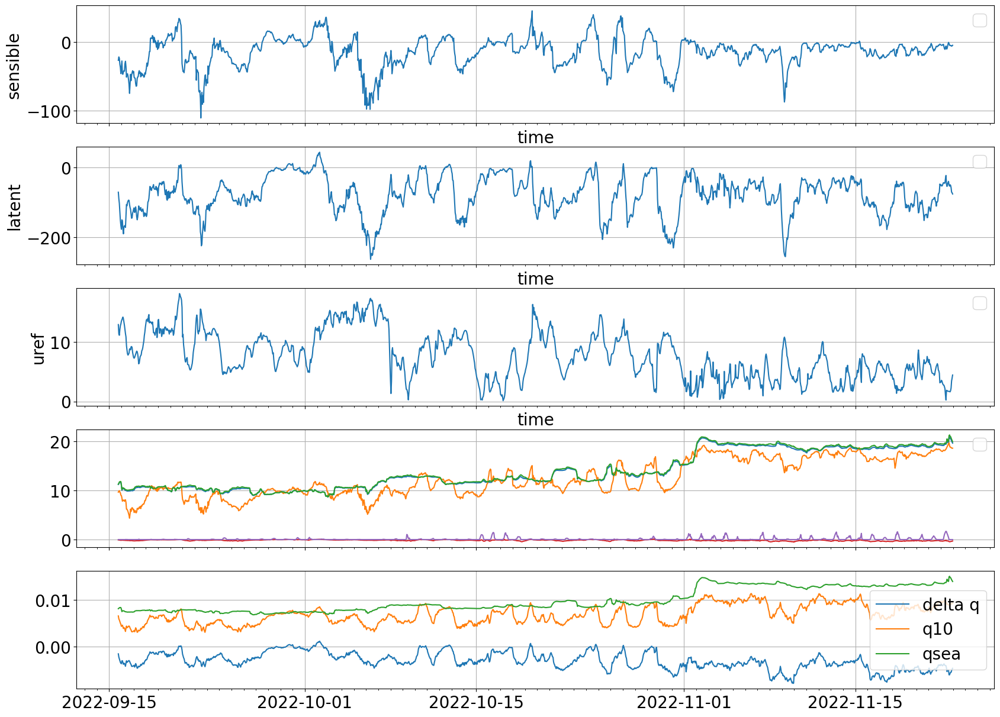

In [86]:
no=5

fig, ax=plt.subplots(no,1, figsize=[20,15], sharex=True)

ASFC.sensible.plot(ax=ax[0])

ASFC.latent.plot(ax=ax[1])

ASFC.uref.plot(ax=ax[2])

ax[3].plot(ASFC.time, SST)
ax[3].plot(ASFC.time, ASFC.tref-273.15)

ax[3].plot(ASFC.time, SST-ASFC.dter)
ax[3].plot(ASFC.time, ASFC.dter)

ax[3].plot(ASFC.time, ASFC.dtwl)

ax[4].plot(ASFC.time, ASFC.qref-ASFC.qsea, label='delta q')
ax[4].plot(ASFC.time, ASFC.qref, label='q10')
ax[4].plot(ASFC.time, ASFC.qsea, label='qsea')

for i in np.arange(no):
    ax[i].legend()
    ax[i].grid()
    ax[i].xaxis.set_minor_locator(mdates.DayLocator())

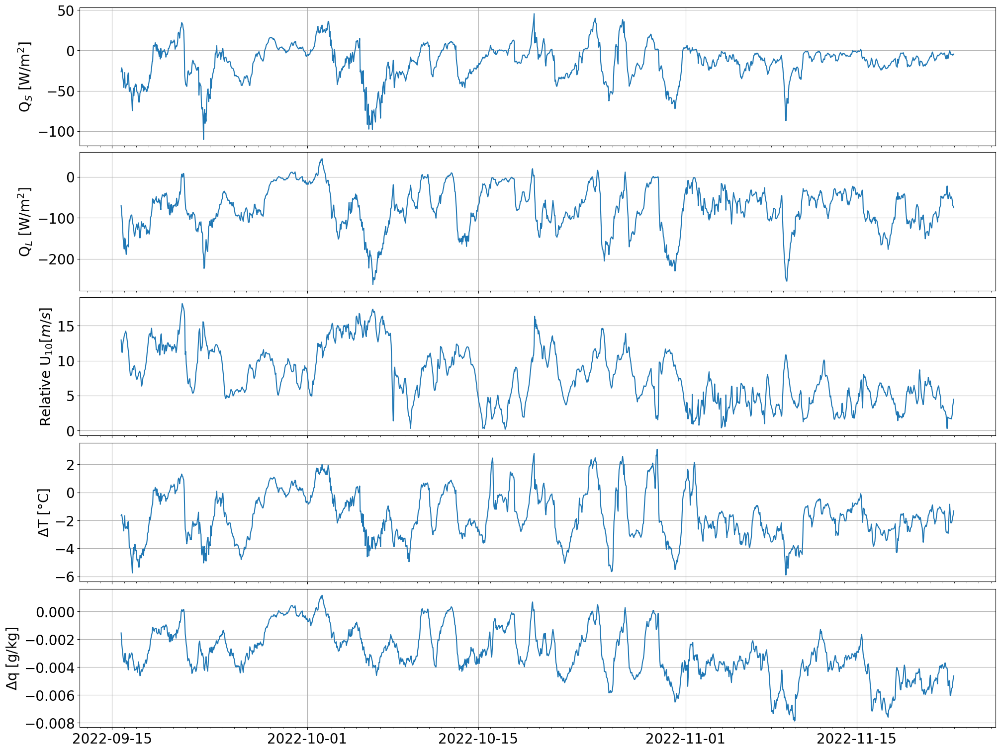

In [26]:
no=5

fig, ax=plt.subplots(no,1, figsize=[20,15], sharex=True, constrained_layout=True)

ax[0].plot(ASFC.time, ASFC.sensible)
ax[0].set_ylabel('Q$_S$ [W/m$^2$]')

ax[1].plot(ASFC.time, ASFC.latent)
ax[1].set_ylabel('Q$_L$ [W/m$^2$]')

ax[2].plot(ASFC.time, ASFC.uref)
ax[2].set_ylabel('Relative U$_{10} [m/s]$')

#ax[3].plot(ASFC.time, SST)
#ax[3].plot(ASFC.time, ASFC.tref-273.15)

ax[3].plot(ASFC.time, ASFC.deltaT, label='delta T')
ax[3].set_ylabel('$\Delta$T [°C]')
#ax[3].plot(ASFC.time, ASFC.dter)
#ax[3].plot(ASFC.time, ASFC.dtwl)

ax[4].plot(ASFC.time, ASFC.deltaq, label='delta q')
#ax[4].plot(ASFC.time, ASFC.qref, label='q10')
#ax[4].plot(ASFC.time, ASFC.qsea, label='qsea')
ax[4].set_ylabel('$\Delta$q [g/kg]')

for i in np.arange(no):
#    ax[i].legend()
    ax[i].grid()
    ax[i].xaxis.set_minor_locator(mdates.DayLocator())

# Create averages and prime for all variables

In [22]:
print(np.nanmean((ASFC.cp*ASFC.rho*ASFC.ct).values))
print(np.nanmean(ASFC.cp)*np.nanmean(ASFC.rho)*np.nanmean(ASFC.ct))
#ASFC.rho*ASFC.lv*ASFC.cq

1.7109407896806024
1.7114195630130011


In [8]:
vari=['sensible', 'latent', 'uref','deltaT', 'deltaq']
var=['Qs', 'Ql', 'U','deltaT', 'q']

varbar=pd.DataFrame(columns=var)
varprime=pd.DataFrame(columns=var)

for i in np.arange(len(vari)):
    varbar[var[i]]=np.zeros(len(ASFC[vari[i]]))+np.nanmean(ASFC[vari[i]].values)
    varprime[var[i]]=ASFC[vari[i]].values-varbar[var[i]]
    

cS= np.nanmean(ASFC.cp)*np.nanmean(ASFC.rho)*np.nanmean(ASFC.ct) #ASFC.cp*ASFC.rho*ASFC.ct
cL=np.nanmean(ASFC.cq)*np.nanmean(ASFC.rho)*np.nanmean(ASFC.lv) #ASFC.rho*ASFC.lv*ASFC.cq

#kSbar=np.zeros(len(cS))+np.nanmean(cS)
#kSprime=cS-kSbar
#kLbar=np.zeros(len(cL))+np.nanmean(cL)
#kLprime=cL-kLbar
    
parS=['t', 'u', 'c']
parL=['q','u','c']
parS=pd.DataFrame(columns=parS)
parL=pd.DataFrame(columns=parL)


parS['t']=varbar.U*varprime.deltaT
parS['u']=varbar.deltaT*varprime.U
parS['c']=varprime.U*varprime.deltaT-(np.zeros(len(varprime.deltaT))+np.nanmean(varprime.U*varprime.deltaT))


parL['q']=varbar.U*varprime.q
parL['u']=varbar.q*varprime.U
parL['c']=varprime.U*varprime.q-(np.zeros(len(varprime.q))+np.nanmean(varprime.U*varprime.q))

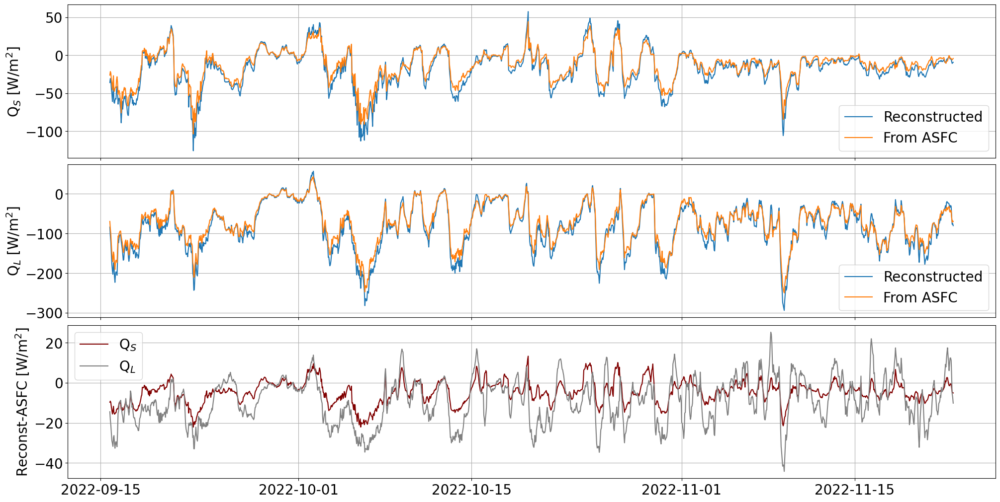

In [9]:
figs=3

fig, ax=plt.subplots(figs,1, figsize=[20,10], sharex=True, constrained_layout=True)

meanS=np.zeros(len(ASFC.deltaT))+np.nanmean(ASFC.deltaT.values*ASFC.uref.values)
meanL=np.zeros(len(ASFC.deltaq))+np.nanmean(ASFC.deltaq.values*ASFC.uref.values)

reS=cS*(parS.t+parS.u+parS.c+meanS)
reL=cL*(parL.q+parL.u+parL.c+meanL)


ax[0].plot(ASFC.time, reS, label=('Reconstructed'))
ax[0].plot(ASFC.time, ASFC.sensible, label=('From ASFC'))


######Check that they are equal to each other, missing some of the dips, but looks ok
ax[1].plot(ASFC.time, reL, label=('Reconstructed'))
ax[1].plot(ASFC.time, ASFC.latent, label=('From ASFC'))

ax[1].set_ylabel('Q$_L$ [W/m$^2$]')
ax[0].set_ylabel('Q$_S$ [W/m$^2$]')
ax[2].set_ylabel('Reconst-ASFC [W/m$^2$]')

##############
ax[2].plot(ASFC.time, reS-ASFC.sensible, label=('Q$_S$'),color='maroon')
ax[2].plot(ASFC.time, reL-ASFC.latent, label=('Q$_L$'), color='grey')


for i in np.arange(figs):
    ax[i].grid()
    ax[i].legend()
    
plt.savefig('figures/reconstructedvsasfc.png')

Text(0, 0.5, 'diff/ASFC.signal')

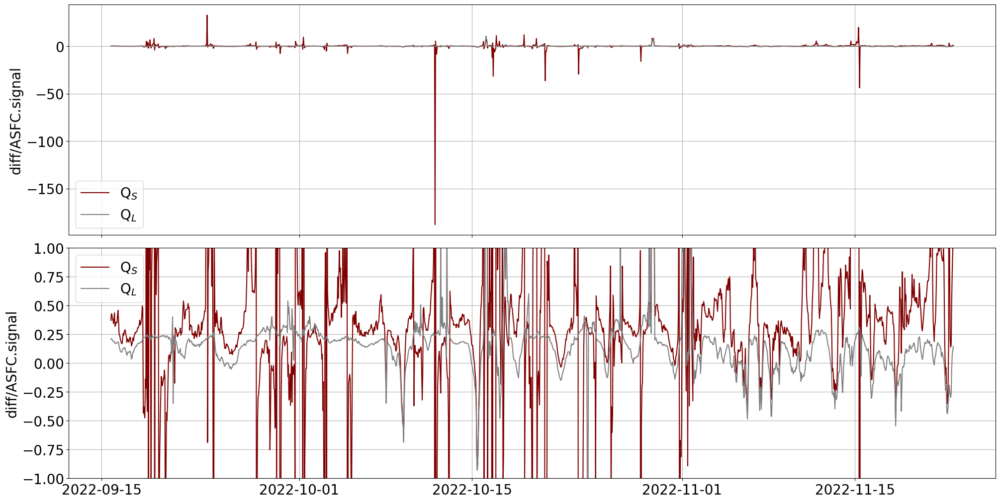

In [26]:
figs=2

fig, ax=plt.subplots(figs,1, figsize=[20,10], sharex=True, constrained_layout=True)

ax[0].plot(ASFC.time, (reS-ASFC.sensible)/ASFC.sensible , label=('Q$_S$'),color='maroon')
ax[0].plot(ASFC.time, (reL-ASFC.latent)/ASFC.latent , label=('Q$_L$'), color='grey')

ax[1].plot(ASFC.time, (reS-ASFC.sensible)/ASFC.sensible , label=('Q$_S$'),color='maroon')
ax[1].plot(ASFC.time, (reL-ASFC.latent)/ASFC.latent , label=('Q$_L$'), color='grey')

ax[1].set_ylim(-1,1)

ax[0].grid()
ax[1].grid()

ax[0].legend()
ax[1].legend()

ax[0].set_ylabel('diff/ASFC.signal')
ax[1].set_ylabel('diff/ASFC.signal')

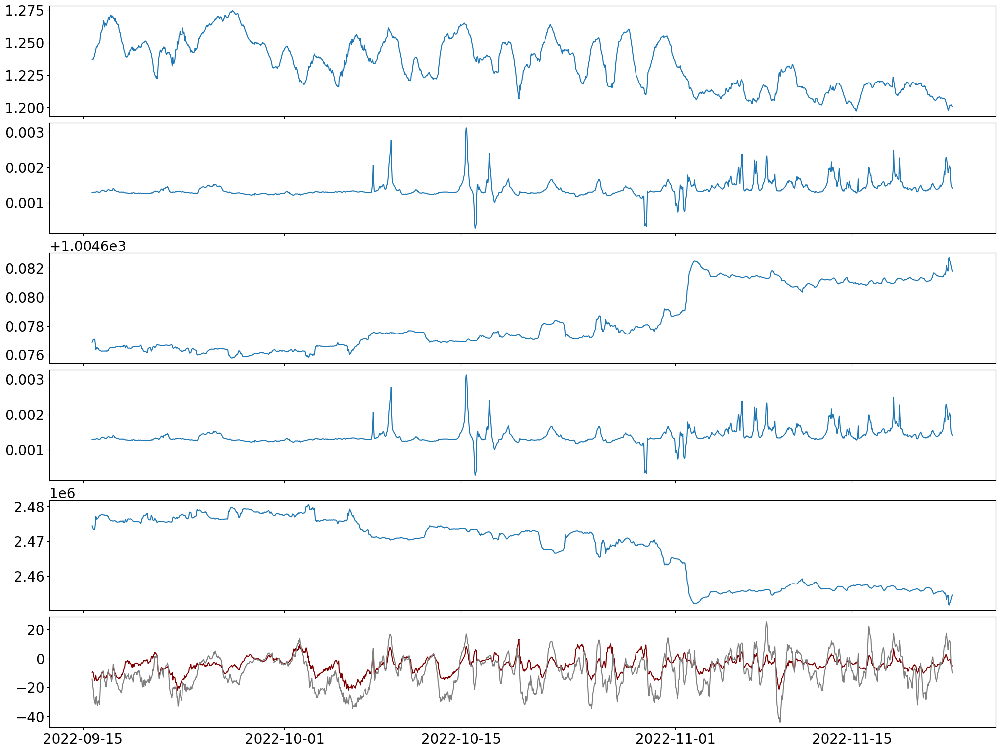

In [28]:
figs=6

fig, ax=plt.subplots(figs,1, figsize=[20,15], sharex=True, constrained_layout=True)

ax[0].plot(ASFC.time, ASFC.rho)

ax[1].plot(ASFC.time, ASFC.ct)

ax[2].plot(ASFC.time, ASFC.cp)

ax[3].plot(ASFC.time, ASFC.cq)

ax[4].plot(ASFC.time, ASFC.lv)

ax[5].plot(ASFC.time, cS*(parS.t+parS.u+parS.c+meanS)-ASFC.sensible, label=('Q$_S$'),color='maroon')
ax[5].plot(ASFC.time, cL*(parL.q+parL.u+parL.c+meanL)-ASFC.latent, label=('Q$_L$'), color='grey')


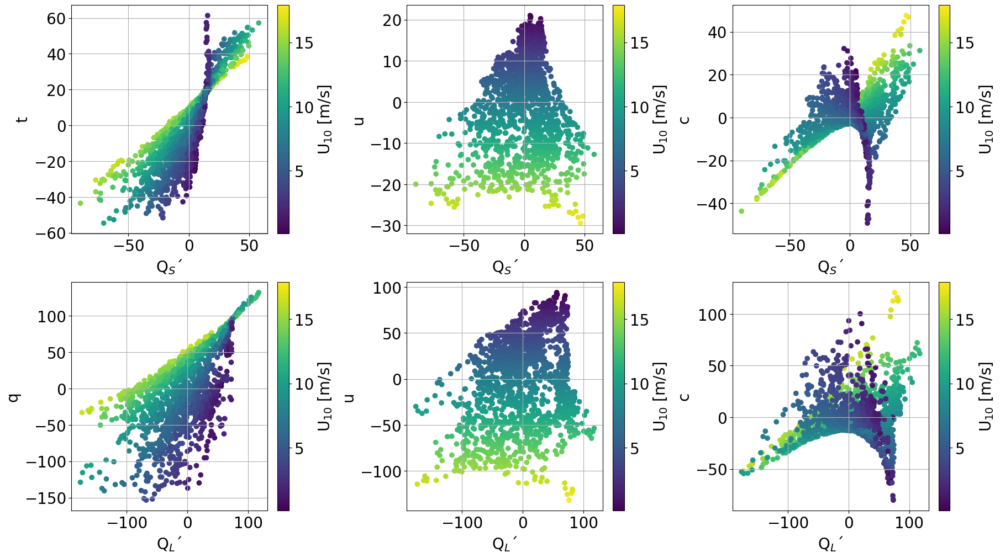

In [29]:
fig, ax=plt.subplots(2,3, figsize=[18,10], constrained_layout=True)

S=['t', 'u', 'c', 'const']
L=['q', 'u', 'c', 'const']
for i in np.arange(3):
    wind1=ax[0,i].scatter(varprime.Qs, cS*parS[S[i]], c=ASFC.uref)
    fig.colorbar(wind1, ax=ax[0,i], label=('U$_{10}$ [m/s]'))

    wind2=ax[1,i].scatter(varprime.Ql, cL*parL[L[i]], c=ASFC.uref)
    fig.colorbar(wind2, ax=ax[1,i], label=('U$_{10}$ [m/s]'))
    
    ax[0,i].set_ylabel(S[i])
    ax[1,i].set_ylabel(L[i])
    
    ax[0,i].set_xlabel('Q$_S$´')
    ax[1,i].set_xlabel('Q$_L$´')
    
    ax[0,i].grid()
    ax[1,i].grid()
#    mask = ~np.isnan(varprime.Qs) & ~np.isnan(varprime.deltaT)

#    scipy.stats.linregress(varprime.Qs[mask], varprime.deltaT[mask])

plt.savefig('figures/primecorr.png')

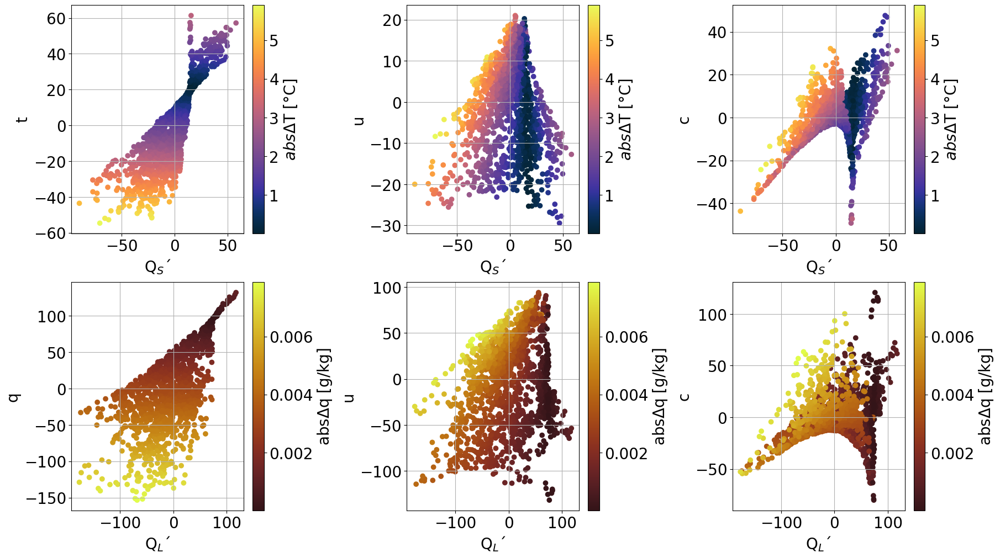

In [30]:
fig, ax=plt.subplots(2,3, figsize=[18,10], constrained_layout=True)

S=['t', 'u', 'c', 'const']
L=['q', 'u', 'c', 'const']
for i in np.arange(3):
    wind1=ax[0,i].scatter(varprime.Qs, cS*parS[S[i]], c=np.abs(ASFC.deltaT), cmap=cmo.cm.thermal)
    fig.colorbar(wind1, ax=ax[0,i], label=('$abs\Delta$T [°C]'))

    wind2=ax[1,i].scatter(varprime.Ql, cL*parL[L[i]], c=np.abs(ASFC.deltaq), cmap=cmo.cm.solar)
    fig.colorbar(wind2, ax=ax[1,i], label=('abs$\Delta$q [g/kg]'))
    
    ax[0,i].set_ylabel(S[i])
    ax[1,i].set_ylabel(L[i])
    
    ax[0,i].set_xlabel('Q$_S$´')
    ax[1,i].set_xlabel('Q$_L$´')
    
    ax[0,i].grid()
    ax[1,i].grid()
#    mask = ~np.isnan(varprime.Qs) & ~np.isnan(varprime.deltaT)

#    scipy.stats.linregress(varprime.Qs[mask], varprime.deltaT[mask])

plt.savefig('figures/primecorr2.png')

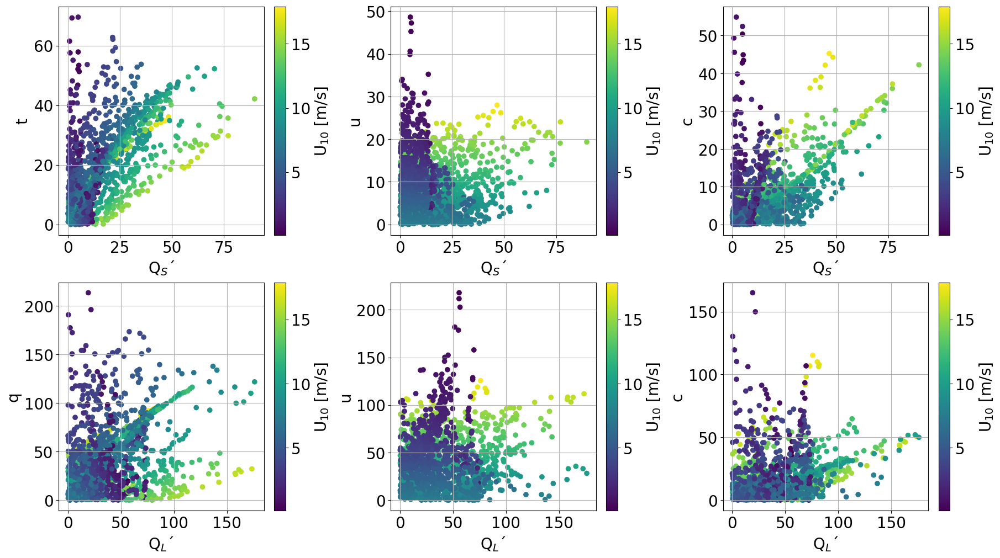

In [29]:
fig, ax=plt.subplots(2,3, figsize=[18,10], constrained_layout=True)

S=['t', 'u', 'c', 'const']
L=['q', 'u', 'c', 'const']
for i in np.arange(3):
    wind1=ax[0,i].scatter(np.abs(varprime.Qs), cS*np.abs(parS[S[i]]), c=ASFC.uref)
    fig.colorbar(wind1, ax=ax[0,i], label=('U$_{10}$ [m/s]'))

    wind2=ax[1,i].scatter(np.abs(varprime.Ql), cL*np.abs(parL[L[i]]), c=ASFC.uref)
    fig.colorbar(wind2, ax=ax[1,i], label=('U$_{10}$ [m/s]'))
    
    ax[0,i].set_ylabel(S[i])
    ax[1,i].set_ylabel(L[i])
    
    ax[0,i].set_xlabel('Q$_S$´')
    ax[1,i].set_xlabel('Q$_L$´')
    
    ax[0,i].grid()
    ax[1,i].grid()
#    mask = ~np.isnan(varprime.Qs) & ~np.isnan(varprime.deltaT)

#    scipy.stats.linregress(varprime.Qs[mask], varprime.deltaT[mask])

plt.savefig('figures/absprimecorr.png')

In [11]:
CB_color_cycle = ['#377eb8', '#ff7f00', '#4daf4a',
                  '#f781bf', '#a65628', '#984ea3',
                  '#999999', '#e41a1c', '#dede00']

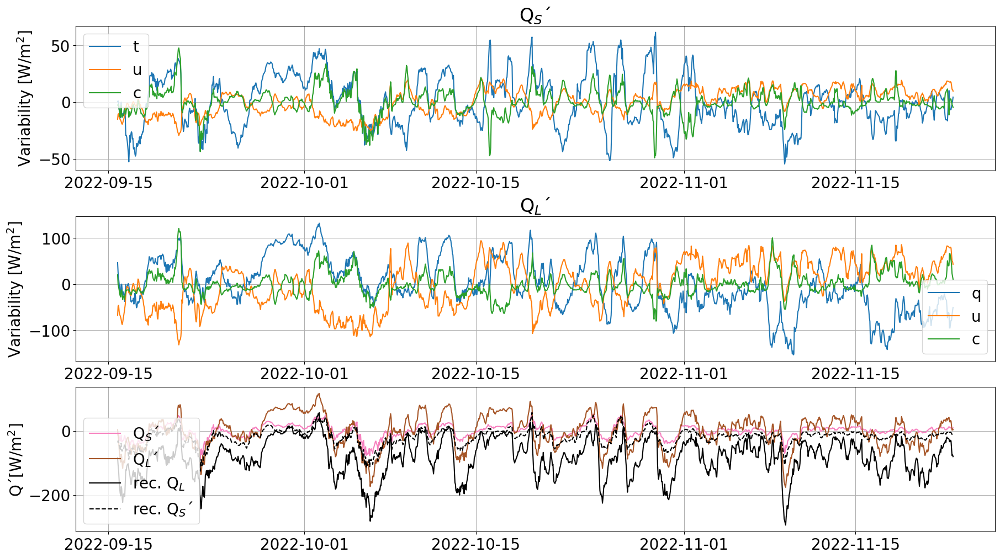

In [15]:
figs=3

fig, ax=plt.subplots(figs,1, figsize=[18,10], constrained_layout=True)

S=['t', 'u', 'c', 'const']
L=['q', 'u', 'c', 'const']
for i in np.arange(3):
    ax[0].plot(ASFC.time, cS*parS[S[i]], label=S[i])

    ax[1].plot(ASFC.time, cL*parL[L[i]], label=L[i])

    
ax[0].set_title('Q$_S$´')
ax[1].set_title('Q$_L$´')

    
ax[0].set_ylabel('Variability [W/m$^2$]')
ax[1].set_ylabel('Variability [W/m$^2$]')

ax[0].grid()
ax[1].grid()
ax[0].legend()
ax[1].legend()



ax[2].plot(ASFC.time, varprime.Qs, label=('Q$_S$´'), color=CB_color_cycle[3])
ax[2].plot(ASFC.time, varprime.Ql, label=('Q$_L$´'), color=CB_color_cycle[4])
ax[2].plot(ASFC.time, reL , label=('rec. Q$_L$'), color='k')
ax[2].plot(ASFC.time, reS , label=('rec. Q$_S$'), color='k', linestyle='--')

ax[2].grid()
ax[2].legend()
ax[2].set_ylabel('Q´[W/m$^2$]')

plt.savefig('figures/primetime.png')

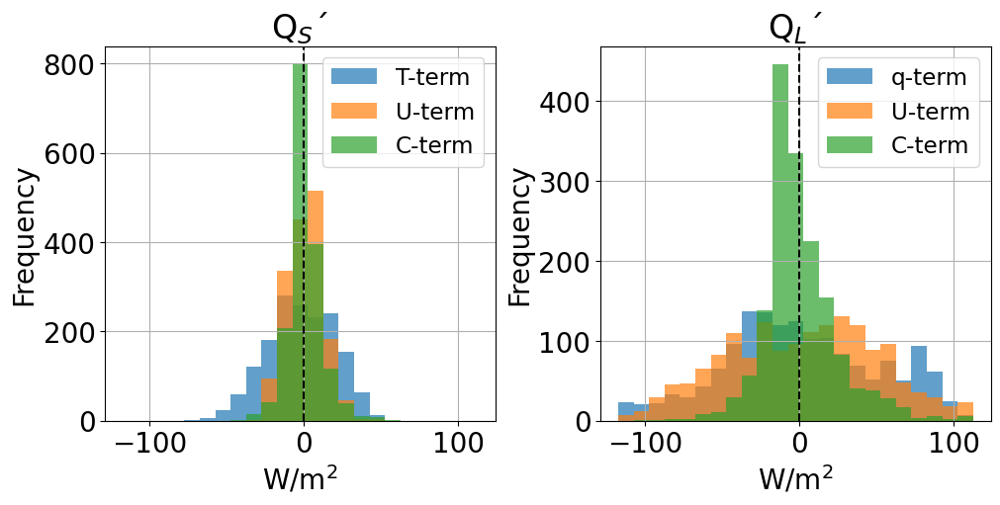

In [24]:


# Create a figure with two subplots (1 row, 2 columns)
fig, ax = plt.subplots(1, 2, figsize=[10, 5], constrained_layout=True)

# Lists defining keys for dictionaries
S = ['t', 'u', 'c', 'const']
L = ['q', 'u', 'c', 'const']

# Labels for the histograms
labelS = ['T-term', 'U-term', 'C-term']
labelL = ['q-term', 'U-term', 'C-term']

# Number of bins for the histograms
bins = np.arange(-varprime.Ql.max(), varprime.Ql.max(), 10)

# Transparency of the histograms
alpha = 0.7

# Create histograms and add them to the subplots
for i in np.arange(3):
    ax[0].hist(cS*parS[S[i]], bins=bins, alpha=alpha, label=labelS[i])
    ax[1].hist(cL*parL[L[i]], bins=bins, alpha=alpha, label=labelL[i])

# Customize the subplots
for i in np.arange(2):
    ax[i].grid()
    ax[i].legend(fontsize='small')
    ax[i].set_xlabel('W/m$^2$')
    ax[i].set_ylabel('Frequency')

    # Set titles for the subplots
    ax[0].set_title('Q$_S$´')
    ax[1].set_title('Q$_L$´')
    
    # Add a dashed vertical line at x = 0
    ax[i].axvline(x=0, color='k', linestyle='--')

    
# Display the plot
plt.show()


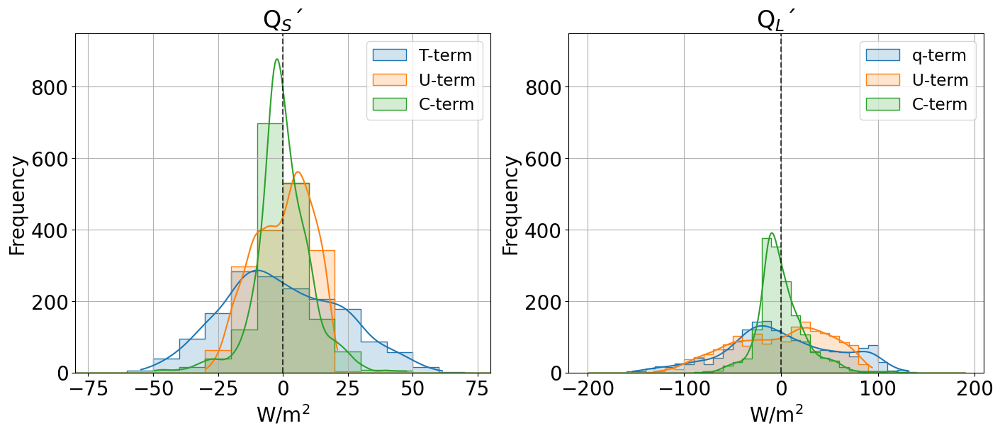

In [16]:


# Create a figure with two subplots (1 row, 2 columns)
fig, ax = plt.subplots(1,2, figsize=[14, 6], constrained_layout=True)

# Lists defining keys for dictionaries
S = ['t', 'u', 'c', 'const']
L = ['q', 'u', 'c', 'const']

# Labels for the histograms
labelS = ['T-term', 'U-term', 'C-term']
labelL = ['q-term', 'U-term', 'C-term']

# Number of bins for the histograms
bins = np.arange(-200, 200, 10)

# Transparency of the histograms
alpha = 0.2

# Create histograms and add them to the subplots
for i in np.arange(3):
    sns.histplot(cS*parS[S[i]],bins=bins, label=labelS[i],kde=True, ax=ax[0], alpha=alpha, element="step")
    sns.histplot(cL*parL[L[i]], bins=bins, label=labelL[i],kde=True, ax=ax[1], alpha=alpha, element="step")

# Customize the subplots
for i in np.arange(2):
    ax[i].grid()
    ax[i].legend(fontsize='small')
    ax[i].set_xlabel('W/m$^2$')
    ax[i].set_ylabel('Frequency')

    # Set titles for the subplots
    ax[0].set_title('Q$_S$´')
    ax[1].set_title('Q$_L$´')
    
    # Add a dashed vertical line at x = 0
    ax[i].axvline(x=0, color='k', linestyle='--', alpha=0.7)
    ax[i].set_ylim(0,950)
    
ax[0].set_xlim(-80,80)    
# Display the plot
plt.savefig('figures/hstprime.png')

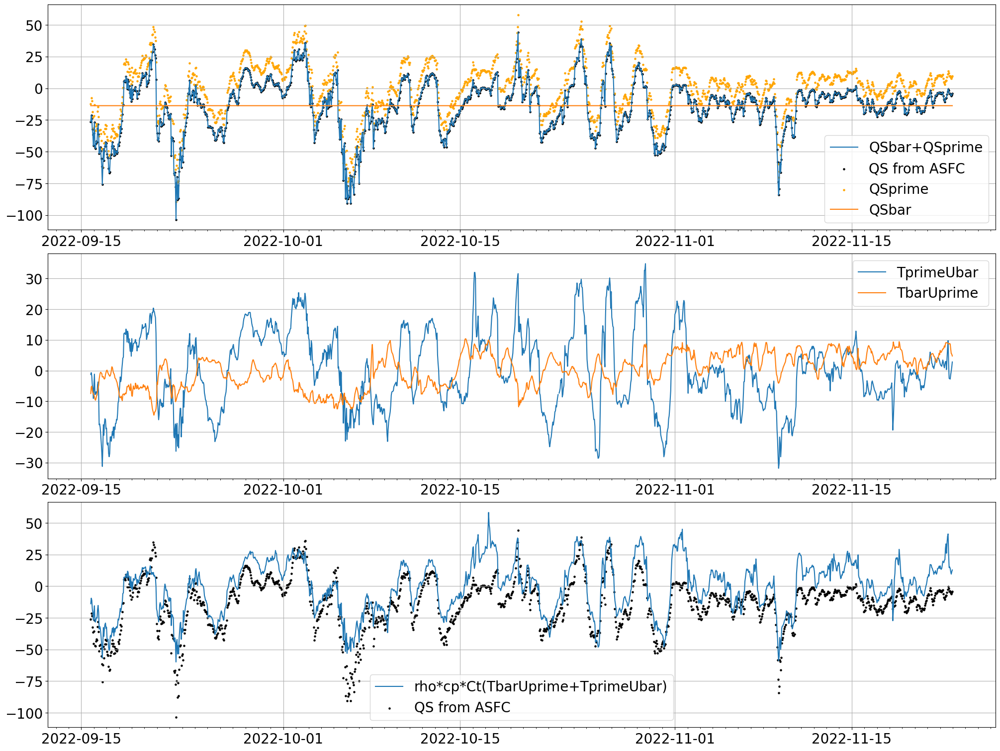

In [69]:
no=3
fig, ax=plt.subplots(no,1, figsize=[20,15], constrained_layout=True)
ax[0].plot(ASFC.time, varbar['QSbar']+varprime['QSprime'], label='QSbar+QSprime')
ax[0].scatter(ASFC.time, ASFC.sensible, s=5, c='k', label='QS from ASFC')
ax[0].scatter(ASFC.time, varprime['QSprime'], s=5, c='orange', label='QSprime')
ax[0].plot(ASFC.time, varbar['QSbar'], label='QSbar')

ax[1].plot(ASFC.time, varprime['Tprime']*varbar['Ubar'], label='TprimeUbar ')

ax[1].plot(ASFC.time, varprime['Uprime']*varbar['Tbar'], label='TbarUprime')

ax[2].plot(ASFC.time, ASFC.cp*ASFC.rho*ASFC.ct*(varprime['Tprime']*varbar['Ubar']+varprime['Uprime']*varbar['Tbar']), label='rho*cp*Ct(TbarUprime+TprimeUbar)')
ax[2].scatter(ASFC.time, ASFC.sensible, s=5, c='k', label='QS from ASFC')

for i in np.arange(no):
    ax[i].legend()
    ax[i].grid()
    ax[i].xaxis.set_minor_locator(mdates.DayLocator())
    
plt.savefig('figures/firstlook.png')

True value: Wind speed (not relative)

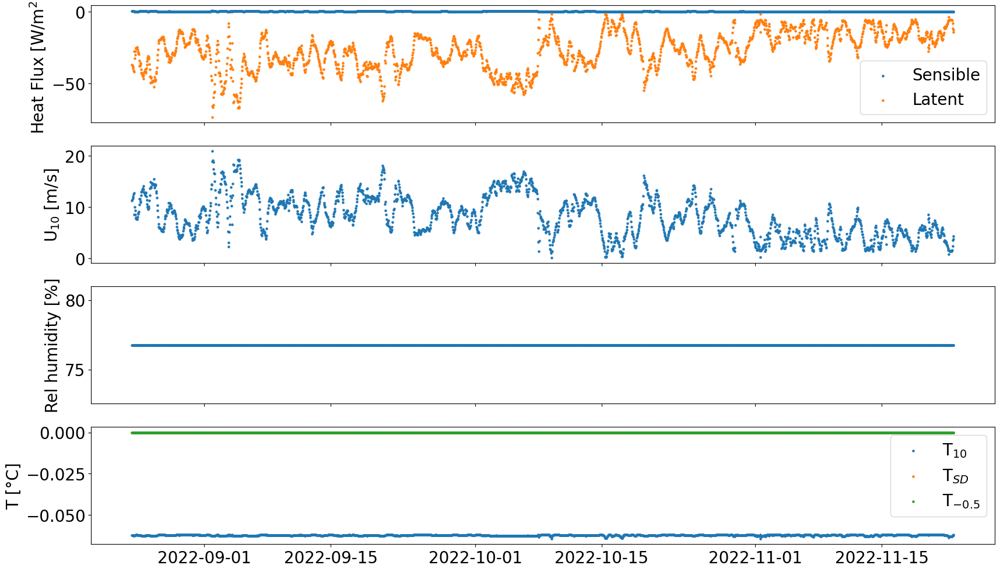

In [15]:
hum1=np.zeros(len(dsH.RH_MEAN.values))+dsH.RH_MEAN.values.mean() #Change this one for humidity data

spd= coloc2.WIND_CORR10.values#relative windpeed
SST= np.zeros(len(dsH.TEMP_SBE37_MEAN.values))#+ dsH.TEMP_DEPTH_HALFMETER_MEAN.values.mean()
T= np.zeros(len(dsH.TEMP_AIR_MEAN.values))#+dsH.TEMP_AIR_MEAN.values.mean() #seasurface temperature in kelvin. Will convert iff less than 200
P= np.zeros(len(dsH.P_SEA.values))+coloc2.P_SEA.values.mean()/100 #air pressure in hPA

hum= ['rh', hum1 ] #chose rh, spec hum or dew point temp.
SST_fl ='skin' #string, 'bulk' or 'skin' for input
meth= 'C35' #string, choose method of calcultion
lat= dsH.latitude.values #latitude
hin=([10,2.3, 2.3])  #sensor heights in m, 3x1 same order as output 
hout=10 #output height, default is 10m
Rl=None #longwave dwn radiation
Rs= None # shortwave dwn radiation
cskin= 0 #0 cool skin adj off
skin=None #'C35' #string "C35", "ecmwf" or "Beljaars"
wl=0 #warm layer off 0 (default)
gust= None# [x,beta,zi,ustbj] #Check documentation
qmeth= 'Buck2' #string, saturation evaporation method
tol= None #float, tolerance limits for fluxes and heights, check documentation
maxiter= 30 #number fo iterations
out= 0 #int, set 0 to set points thathave not converged
out_var= None #str, define pandas arrayod variables for output. There i a default for cskin and gust off. Check documentation
L=None #str, M-O definition option. 'tsrv' is default

ASFC=AirSeaFluxCode(spd, T, SST, SST_fl, meth, lat=lat, hum=hum, P=P,
                   hin=hin, hout=hout, Rl=Rl, Rs=Rs, cskin=cskin, skin=skin, wl=wl,
                   gust=gust, qmeth=qmeth, tol=tol, maxiter=maxiter, out=out,
                   out_var=out_var, L=L)

s=5

fig, ax= plt.subplots(4,1, figsize=(20,12), sharex=True)

ax[0].scatter(dsH.time, ASFC['sensible'], s=s, label=('Sensible'))
ax[0].scatter(dsH.time, ASFC['latent'], s=s, label=('Latent'))
ax[0].set_ylabel('Heat Flux [W/m$^2$]')
ax[0].legend()

ax[1].scatter(dsH.time, spd, s=s)
ax[1].set_ylabel('U$_{10}$ [m/s]')


#ax[2].scatter(dsH.time, coloc2.P_SEA/100, s=s)
#ax[2].set_ylabel('Pressure [hPa]')
ax[2].scatter(dsH.time, hum1, s=s)
ax[2].set_ylabel('Rel humidity [%]')

ax[3].scatter(dsH.time, ASFC.tref-273.15, s=s, label='T$_{10}$')
ax[3].scatter(dsH.time, T, s=s, label='T$_{SD}$')
ax[3].scatter(dsH.time, SST, s=s, label='T$_{-0.5}$')
ax[3].set_ylabel('T [°C]')
ax[3].legend()

Figure: It can be seen that the Latent heat flux is a reflection of the windspeed at 10 meters. When winds get close to zero, lhf goes close to zero. Windspeeds of around 20 m/s gives a respons in heatflux up to -75 in lhf. The sensible heat flux is also showing some response, but not at all in the same magnitude as lhf.

True values: Relative humidity

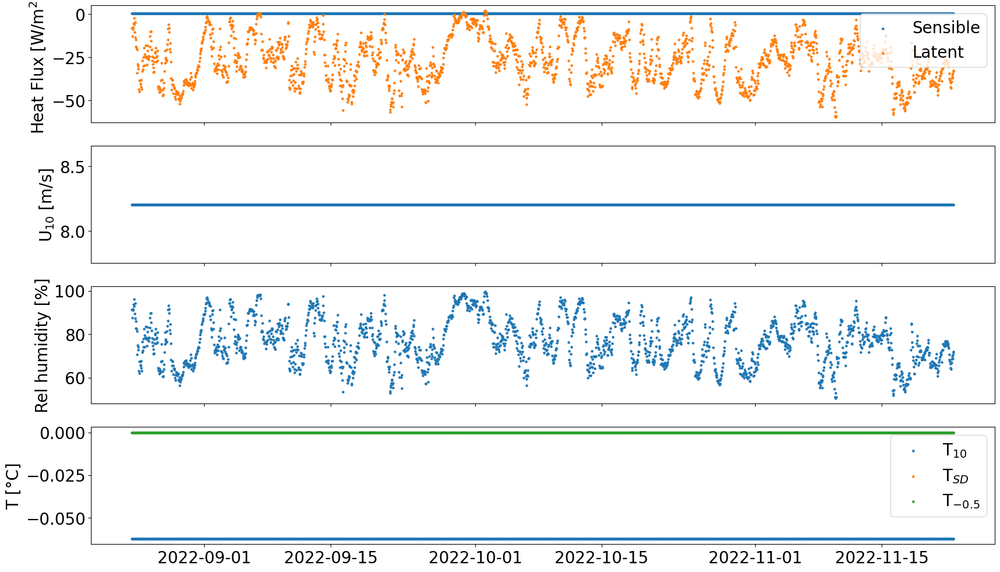

In [21]:
hum1=dsH.RH_MEAN.values #Change this one for humidity data

spd= np.zeros(len(coloc2.WIND_CORR10.values))+coloc2.WIND_CORR10.values.mean()#relative windpeed
SST= np.zeros(len(dsH.TEMP_SBE37_MEAN.values))#+ dsH.TEMP_DEPTH_HALFMETER_MEAN.values.mean()
T= np.zeros(len(dsH.TEMP_AIR_MEAN.values))#+dsH.TEMP_AIR_MEAN.values.mean() #seasurface temperature in kelvin. Will convert iff less than 200
P= np.zeros(len(dsH.P_SEA.values))+coloc2.P_SEA.values.mean()/100 #air pressure in hPA

hum= ['rh', hum1 ] #chose rh, spec hum or dew point temp.
SST_fl ='skin' #string, 'bulk' or 'skin' for input
meth= 'C35' #string, choose method of calcultion
lat= dsH.latitude.values #latitude
hin=([10,2.3, 2.3])  #sensor heights in m, 3x1 same order as output 
hout=10 #output height, default is 10m
Rl=None #longwave dwn radiation
Rs= None # shortwave dwn radiation
cskin= 0 #0 cool skin adj off
skin=None #'C35' #string "C35", "ecmwf" or "Beljaars"
wl=0 #warm layer off 0 (default)
gust= None# [x,beta,zi,ustbj] #Check documentation
qmeth= 'Buck2' #string, saturation evaporation method
tol= None #float, tolerance limits for fluxes and heights, check documentation
maxiter= 30 #number fo iterations
out= 0 #int, set 0 to set points thathave not converged
out_var= None #str, define pandas arrayod variables for output. There i a default for cskin and gust off. Check documentation
L=None #str, M-O definition option. 'tsrv' is default

ASFC=AirSeaFluxCode(spd, T, SST, SST_fl, meth, lat=lat, hum=hum, P=P,
                   hin=hin, hout=hout, Rl=Rl, Rs=Rs, cskin=cskin, skin=skin, wl=wl,
                   gust=gust, qmeth=qmeth, tol=tol, maxiter=maxiter, out=out,
                   out_var=out_var, L=L)

s=5

fig, ax= plt.subplots(4,1, figsize=(20,12), sharex=True)

ax[0].scatter(dsH.time, ASFC['sensible'], s=s, label=('Sensible'))
ax[0].scatter(dsH.time, ASFC['latent'], s=s, label=('Latent'))
ax[0].set_ylabel('Heat Flux [W/m$^2$]')
ax[0].legend()

ax[1].scatter(dsH.time, spd, s=s)
ax[1].set_ylabel('U$_{10}$ [m/s]')


#ax[2].scatter(dsH.time, coloc2.P_SEA/100, s=s)
#ax[2].set_ylabel('Pressure [hPa]')
ax[2].scatter(dsH.time, hum1, s=s)
ax[2].set_ylabel('Rel humidity [%]')

ax[3].scatter(dsH.time, ASFC.tref-273.15, s=s, label='T$_{10}$')
ax[3].scatter(dsH.time, T, s=s, label='T$_{SD}$')
ax[3].scatter(dsH.time, SST, s=s, label='T$_{-0.5}$')
ax[3].set_ylabel('T [°C]')
ax[3].legend()


Figure: It can be seen that the Latent heat flux is showing the same patterns as RH. When RH is close to 100 % lhf is close to zero and when its lower, like under 60 % lhf goes to just under -50.

True values air-sea temperature gradient: 

Text(0, 0.5, 'qref')

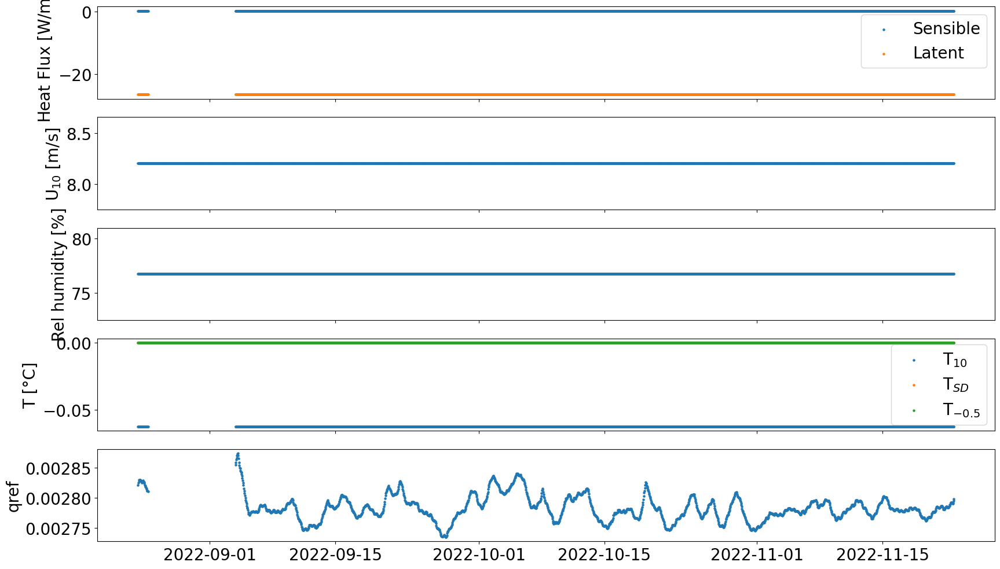

In [10]:
hum1=np.zeros(len(dsH.RH_MEAN.values))+dsH.RH_MEAN.values.mean()
#Change this one for humidity data

spd= np.zeros(len(coloc2.WIND_CORR10.values))+coloc2.WIND_CORR10.values.mean()#relative windpeed
SST= np.zeros(len(dsH.TEMP_SBE37_MEAN.values))
T= np.zeros(len(dsH.TEMP_AIR_MEAN.values)) #seasurface temperature in kelvin. Will convert iff less than 200
P= dsH.P_SEA.values #air pressure in hPA

hum= ['rh', hum1 ] #chose rh, spec hum or dew point temp.
SST_fl ='skin' #string, 'bulk' or 'skin' for input
meth= 'C35' #string, choose method of calcultion
lat= dsH.latitude.values #latitude
hin=([10,2.3, 2.3])  #sensor heights in m, 3x1 same order as output 
hout=10 #output height, default is 10m
Rl=None #longwave dwn radiation
Rs= None # shortwave dwn radiation
cskin= 0 #0 cool skin adj off
skin=None #'C35' #string "C35", "ecmwf" or "Beljaars"
wl=0 #warm layer off 0 (default)
gust= None# [x,beta,zi,ustbj] #Check documentation
qmeth= 'Buck2' #string, saturation evaporation method
tol= None #float, tolerance limits for fluxes and heights, check documentation
maxiter= 30 #number fo iterations
out= 0 #int, set 0 to set points thathave not converged
out_var= None #str, define pandas arrayod variables for output. There i a default for cskin and gust off. Check documentation
L=None #str, M-O definition option. 'tsrv' is default

ASFC=AirSeaFluxCode(spd, T, SST, SST_fl, meth, lat=lat, hum=hum, P=P,
                   hin=hin, hout=hout, Rl=Rl, Rs=Rs, cskin=cskin, skin=skin, wl=wl,
                   gust=gust, qmeth=qmeth, tol=tol, maxiter=maxiter, out=out,
                   out_var=out_var, L=L)

s=5

fig, ax= plt.subplots(5,1, figsize=(20,12), sharex=True)

ax[0].scatter(dsH.time, ASFC['sensible'], s=s, label=('Sensible'))
ax[0].scatter(dsH.time, ASFC['latent'], s=s, label=('Latent'))
ax[0].set_ylabel('Heat Flux [W/m$^2$]')
ax[0].legend()

ax[1].scatter(dsH.time, spd, s=s)
ax[1].set_ylabel('U$_{10}$ [m/s]')


#ax[2].scatter(dsH.time, coloc2.P_SEA/100, s=s)
#ax[2].set_ylabel('Pressure [hPa]')
ax[2].scatter(dsH.time, hum1, s=s)
ax[2].set_ylabel('Rel humidity [%]')


ax[3].scatter(dsH.time, ASFC.tref-273.15, s=s, label='T$_{10}$')
ax[3].scatter(dsH.time, T, s=s, label='T$_{SD}$')
ax[3].scatter(dsH.time, SST, s=s, label='T$_{-0.5}$')
ax[3].set_ylabel('T [°C]')
ax[3].legend()

#ax[4].scatter(dsH.time, ASFC.rh, s=s)
ax[4].scatter(dsH.time, ASFC.qref, s=s)
ax[4].set_ylabel('qref')

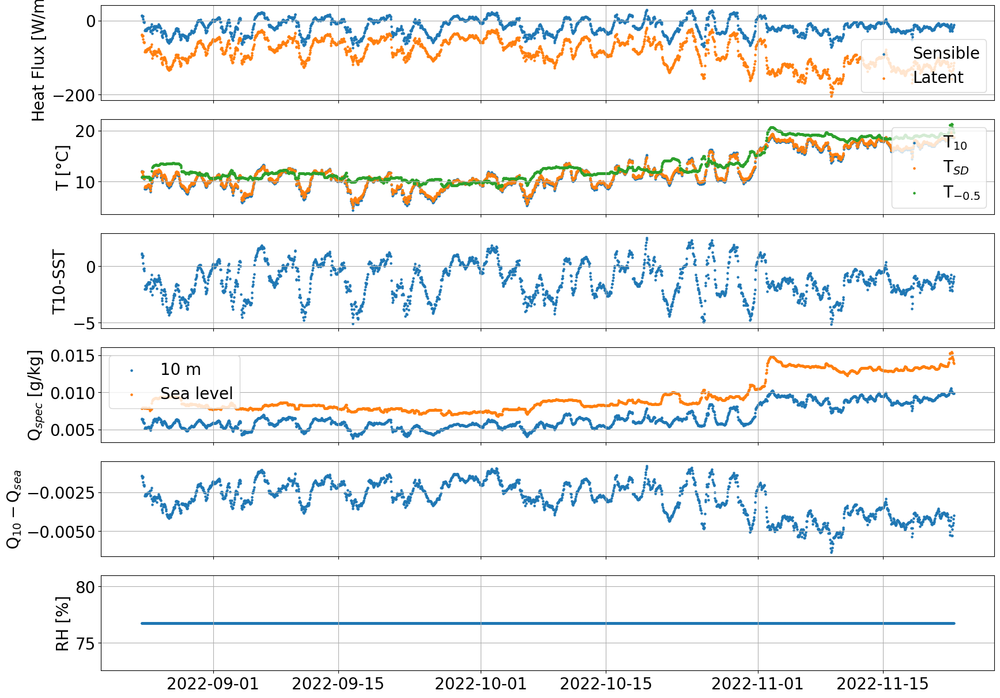

In [22]:
hum1=np.zeros(len(dsH.RH_MEAN.values))+dsH.RH_MEAN.values.mean()
#Change this one for humidity data

spd= np.zeros(len(coloc2.WIND_CORR10.values))+coloc2.WIND_CORR10.values.mean()#relative windpeed
SST= dsH.TEMP_SBE37_MEAN.values
T= dsH.TEMP_AIR_MEAN.values #seasurface temperature in kelvin. Will convert iff less than 200
P= np.zeros(len(dsH.P_SEA.values))+coloc2.P_SEA.values.mean()/100 #air pressure in hPA

hum= ['rh', hum1 ] #chose rh, spec hum or dew point temp.
SST_fl ='skin' #string, 'bulk' or 'skin' for input
meth= 'C35' #string, choose method of calcultion
lat= dsH.latitude.values #latitude
hin=([10,2.3, 2.3])  #sensor heights in m, 3x1 same order as output 
hout=10 #output height, default is 10m
Rl=None #longwave dwn radiation
Rs= None # shortwave dwn radiation
cskin= 0 #0 cool skin adj off
skin=None #'C35' #string "C35", "ecmwf" or "Beljaars"
wl=0 #warm layer off 0 (default)
gust= None# [x,beta,zi,ustbj] #Check documentation
qmeth= 'Buck2' #string, saturation evaporation method
tol= None #float, tolerance limits for fluxes and heights, check documentation
maxiter= 30 #number fo iterations
out= 0 #int, set 0 to set points thathave not converged
out_var= None #str, define pandas arrayod variables for output. There i a default for cskin and gust off. Check documentation
L=None #str, M-O definition option. 'tsrv' is default

ASFC=AirSeaFluxCode(spd, T, SST, SST_fl, meth, lat=lat, hum=hum, P=P,
                   hin=hin, hout=hout, Rl=Rl, Rs=Rs, cskin=cskin, skin=skin, wl=wl,
                   gust=gust, qmeth=qmeth, tol=tol, maxiter=maxiter, out=out,
                   out_var=out_var, L=L)

s=5
plots=6

fig, ax= plt.subplots(plots,1, figsize=(20,15), sharex=True)

ax[0].scatter(dsH.time, ASFC['sensible'], s=s, label=('Sensible'))
ax[0].scatter(dsH.time, ASFC['latent'], s=s, label=('Latent'))
ax[0].set_ylabel('Heat Flux [W/m$^2$]')
ax[0].legend()

#ax[1].scatter(dsH.time, spd, s=s)
#ax[1].set_ylabel('U$_{10}$ [m/s]')


#ax[2].scatter(dsH.time, coloc2.P_SEA/100, s=s)
#ax[2].set_ylabel('Pressure [hPa]')
#ax[2].scatter(dsH.time, hum1, s=s)
#ax[2].set_ylabel('Rel humidity [%]')


ax[3-2].scatter(dsH.time, ASFC.tref-273.15, s=s, label='T$_{10}$')
ax[3-2].scatter(dsH.time, T, s=s, label='T$_{SD}$')
ax[3-2].scatter(dsH.time, SST, s=s, label='T$_{-0.5}$')
ax[3-2].set_ylabel('T [°C]')
ax[3-2].legend()

ax[4-2].scatter(dsH.time, T-(SST), s=s)
ax[4-2].set_ylabel('T10-SST')

ax[5-2].scatter(dsH.time, ASFC.qref, s=s, label='10 m')
ax[5-2].scatter(dsH.time, ASFC.qsea, s=s, label='Sea level')
ax[5-2].set_ylabel('Q$_{spec}$ [g/kg]')
ax[5-2].legend()

ax[6-2].scatter(dsH.time,ASFC.qref-ASFC.qsea, s=s)
ax[6-2].set_ylabel('Q$_{10}-$Q$_{sea}$')

ax[7-2].scatter(dsH.time, hum1, s=s)
ax[7-2].set_ylabel('RH [%]')

for i in np.arange(plots):
    ax[i].grid()

plt.savefig('figures/astgflux.png')

Even latent is affected by the A-S teperature gradient. This is due to the humidity gradient that is affected by the air temperature.

Check latent heat flux for which variabes are reasonable to show here. Write function to easily exchange and plot the checked variable and put means on the other. Also to visualise the values of the other parameters.

* COARE

In [15]:
# %load coare36vn_zrf_et.py
"""
Functions for COARE model version 3.6 bulk flux calculations.

Translated from MATLAB scripts written by Jim Edson and Chris Fairall, 
further edited by Elizabeth Thompson. Main Matalb script source is coare36vn_zrf_et.m

Execute '%run coare36vn_zrf_et' from the iPython command line for test run with
'test_36_data.txt' input data file. 
Code can also be imported as a module so that subfunctions can be used independently if desired.
List of functions in this code are:
    ['RHcalc',
    'albedo_vector',
    'bucksat',
    'coare36vn_zrf_et',
    'grv',
    'psit_26',
    'psiu_26',
    'psiu_40',
    'qsat26air',
    'qsat26sea']

ludovic Bariteau, CU/CIRES, NOAA/ESRL/PSL
v1: August 2022
"""
import numpy as np
import os
    
def coare36vn_zrf_et(u, zu , t, zt, rh, zq, P, ts, sw_dn, lw_dn, lat, lon,jd, zi,rain, Ss, cp=None, sigH=None, zrf_u=10.0, zrf_t=10.0, zrf_q=10.0):   
#**************************************************************************
# VERSION INFO:
    
# Vectorized version of COARE 3.6 code (Fairall et al, 2003) with
# modification based on the CLIMODE, MBL and CBLAST experiments
# (Edson et al., 2012). The cool skin and surface wave options are included.
# A separate warm layer function can be used to call this function.
    
# This 3.6 version include parameterizations using wave height and wave
# slope using cp and sigH.  If these are set to NaN, then the wind
# speed dependent formulation is used.  The parameterizations are based
# on fits to the Banner-Norison wave model and the Fairall-Edson flux
# database.  This version also allows salinity as a input.
# Open ocean example Ss=35; Great Lakes Ss=0;
    
#**************************************************************************
# COOL SKIN:
    
# An important component of this code is whether the inputed ts
# represents the ocean skin temperature or a subsurface temperature.
# How this variable is treated is determined by the jcool parameter:
#   set jcool=1 if ts is subsurface or bulk ocean temperature (default);
#   set jcool=0 if ts is skin temperature or to not run cool skin model.
# The code updates the cool-skin temperature depression dT_skin and
# thickness dz_skin during iteration loop for consistency. The number of
# iterations set to nits = 6.
    
    jcoolx = 1
#**************************************************************************
### INPUTS:
    
# Notes on input default values, missing values, vectors vs. single values:
#   - the code assumes u,t,rh,ts,P,sw_dn,lw_dn,rain,Ss,cp,sigH are vectors;
#   - sensor heights (zu,zt,zl) latitude lat, longitude lon, julian date jd,
#       and PBL height zi may be constants;
#   - air pressure P and radiation sw_dn, lw_dn may be vectors or constants.
#   - input NaNs as vectors or single values to indicate no data.
#   - assign a default value to P, lw_dn, sw_dn, lat, zi if unknown, single
#       values of these inputs are okay.
# Notes about signs and units:
#   - radiation signs: positive warms the ocean
#   - signs and units change throughout the program for ease of calculations.
#   - the signs and units noted here are for the inputs.
    
    
#  u = water-relative wind speed magnitude (m/s) at height zu (m)
#             i.e. mean wind speed accounting for the ocean current vector.
#             i.e. the magnitude of the difference between the wind vector
#             (at height zu) and ocean surface current vector.
#             If not available, use true wind speed to compute fluxes in
#             earth-coordinates only which will be ignoring the stress
#             contribution from the ocean current to all fluxes
#  t = air temperature (degC) at height zt (m)
#  rh = relative humidity (#) at height zq (m)
#  P = sea level air pressure (mb)
#  ts = seawater temperature (degC), see jcool below for cool skin
#             calculation, and separate warm layer code for specifying
#             sensor depth and whether warm layer is computed
#  sw_dn = downward (positive) shortwave radiation (W/m^2)
#  lw_dn = downward (positive) longwave radiation (W/m^2)
#  lat = latitude defined positive to north
#  lon = longitude defined positive to east, if using other version,
#             adjust the eorw string input to albedo_vector function
#  jd = year day or julian day, where day Jan 1 00:00 UTC = 0
#  zi = PBL height (m) (default or typical value = 600m)
#  rain = rain rate (mm/hr)
#  Ss = sea surface salinity (PSU)
#  cp = phase speed of dominant waves (m/s) computed from peak period
#  sigH = significant wave height (m)
#  zu, zt, zq heights of the observations (m)
#  zrf_u, zrf_t, zrf_q  reference height for profile.  Use this to compare observations at different heights
    
#**************************************************************************
#### OUTPUTS: the user controls the output array A at the end of the code.
    
# Note about signs and units:
#   - radiation signs: positive warms the ocean
#   - sensible, rain, and latent flux signs: positive cools the ocean
#   - signs and units change throughout the program for ease of calculations.
#   - the signs and units noted here are for the final outputs.
    
#    usr = friction velocity that includes gustiness (m/s), u*
#    tau = wind stress that includes gustiness (N/m^2)
#    hsb = sensible heat flux (W/m^2) ... positive for Tair < Tskin
#    hlb = latent heat flux (W/m^2) ... positive for qair < qs
#    hbb = atmospheric buoyany flux (W/m^2)... positive when hlb and hsb heat the atmosphere
#    hsbb = atmospheric buoyancy flux from sonic ... as above, computed with sonic anemometer T
#    hlwebb = webb factor to be added to hl covariance and ID latent heat fluxes
#    tsr = temperature scaling parameter (K), t*
#    qsr = specific humidity scaling parameter (kg/kg), q*
#    zo = momentum roughness length (m)
#    zot = thermal roughness length (m)
#    zoq = moisture roughness length (m)
#    Cd = wind stress transfer (drag) coefficient at height zu (unitless)
#    Ch = sensible heat transfer coefficient (Stanton number) at height zu (unitless)
#    Ce = latent heat transfer coefficient (Dalton number) at height zu (unitless)
#    L = Monin-Obukhov length scale (m)
#    zeta = Monin-Obukhov stability parameter zu/L (dimensionless)
#    dT_skin = cool-skin temperature depression (degC), pos value means skin is cooler than subskin
#    dq_skin = cool-skin humidity depression (g/kg)
#    dz_skin = cool-skin thickness (m)
#    Urf = wind speed at reference height (user can select height at input)
#    Trf = air temperature at reference height
#    Qrf = air specific humidity at reference height
#    RHrf = air relative humidity at reference height
#    UrfN = neutral value of wind speed at reference height
#    TrfN = neutral value of air temp at reference height
#    qarfN = neutral value of air specific humidity at reference height
#    lw_net = Net IR radiation computed by COARE (W/m2)... positive heating ocean
#    sw_net = Net solar radiation computed by COARE (W/m2)... positive heating ocean
#    Le = latent heat of vaporization (J/K)
#    rhoa = density of air at input parameter height zt, typically same as zq (kg/m3)
#    UN = neutral value of wind speed at zu (m/s)
#    U10 = wind speed adjusted to 10 m (m/s)
#    UN10 = neutral value of wind speed at 10m (m/s)
#    Cdn_10 = neutral value of drag coefficient at 10m (unitless)
#    Chn_10 = neutral value of Stanton number at 10m (unitless)
#    Cen_10 = neutral value of Dalton number at 10m (unitless)
#    hrain = rain heat flux (W/m^2)... positive cooling ocean
#    Qs = sea surface specific humidity, i.e. assuming saturation (g/kg)
#    Evap = evaporation rate (mm/h)
#    T10 = air temperature at 10m (deg C)
#    Q10 = air specific humidity at 10m (g/kg)
#    RH10 = air relative humidity at 10m (#)
#    P10 = air pressure at 10m (mb)
#    rhoa10 = air density at 10m (kg/m3)
#    gust = gustiness velocity (m/s)
#    wc_frac = whitecap fraction (ratio)
#    Edis = energy dissipated by wave breaking (W/m^2)
    
#**************************************************************************
#### ADDITONAL CALCULATIONS:
    
#   using COARE output, one can easily calculate the following using the
#   sign conventions and names herein:
    
#     ### Skin sea surface temperature or interface temperature; neglect
#     ### dT_warm_to_skin if warm layer code is not used as the driver
#     #### program for this program
#           Tskin = ts + dT_warm_to_skin - dT_skin;
    
#     ### Upwelling radiative fluxes: positive heating the ocean
#           lw_up = lw_net - lw_dn;
#           sw_up = sw_net - sw_dn;
    
#     ### Net heat flux: positive heating ocean
#     ### note that hs, hl, hrain are defined when positive cooling
#     ### ocean by COARE, so their signs are flipped here:
#           hnet = sw_net + lw_net - hs - hl - hrain;
    
#**************************************************************************
#### REFERENCES:
    
    #  Fairall, C. W., E. F. Bradley, J. S. Godfrey, G. A. Wick, J. B. Edson,
#  and G. S. Young, 1996a: Cool-skin and warm-layer effects on sea surface
#  temperature. J. Geophys. Res., 101, 1295?1308.
    
    #  Fairall, C. W., E. F. Bradley, D. P. Rogers, J. B. Edson, and G. S. Young,
#  1996b: Bulk parameterization of air-sea fluxes for Tropical Ocean- Global
#  Atmosphere Coupled- Ocean Atmosphere Response Experiment. J. Geophys. Res.,
#  101, 3747?3764.
    
    #  Fairall, C. W., A. B. White, J. B. Edson, and J. E. Hare, 1997: Integrated
#  shipboard measurements of the marine boundary layer. Journal of Atmospheric
#  and Oceanic Technology, 14, 338?359
    
    #  Fairall, C.W., E.F. Bradley, J.E. Hare, A.A. Grachev, and J.B. Edson (2003),
#  Bulk parameterization of air sea fluxes: updates and verification for the
#  COARE algorithm, J. Climate, 16, 571-590.
    
    #  Edson, J.B., J. V. S. Raju, R.A. Weller, S. Bigorre, A. Plueddemann, C.W.
#  Fairall, S. Miller, L. Mahrt, Dean Vickers, and Hans Hersbach, 2013: On
#  the Exchange of momentum over the open ocean. J. Phys. Oceanogr., 43,
#  15891610. doi: http://dx.doi.org/10.1175/JPO-D-12-0173.1
    
#**************************************************************************
# CODE HISTORY:
    
# 1. 12/14/05 - created based on scalar version coare26sn.m with input
#    on vectorization from C. Moffat.
# 2. 12/21/05 - sign error in psiu_26 corrected, and code added to use variable
#    values from the first pass through the iteration loop for the stable case
#    with very thin M-O length relative to zu (zetau>50) (as is done in the
#    scalar coare26sn and COARE3 codes).
# 3. 7/26/11 - S = dT was corrected to read S = ut.
# 4. 7/28/11 - modification to roughness length parameterizations based
#    on the CLIMODE, MBL, Gasex and CBLAST experiments are incorporated
# 5. 9/20/2017 - New wave parameterization added based on fits to wave model
# 6. 9/2020 - tested and updated to give consistent readme info and units,
#    and so that no external functions are required. They are all included at
#    end of this program now. Changed names for a few things... including skin
#    dter -> dT_skin; dt -> dT; dqer -> dq_skin; tkt -> dz_skin
#    and others to avoid ambiguity:
#    Rnl -> lw_net; Rns -> sw_net; Rl -> lw_dn; Rs -> sw_dn;
#    SST -> Tskin; Also corrected heights at which q and P are
#    computed to be more accurate, changed units of qstar to kg/kg, removed
#    extra 1000 on neutral 10 m transfer coefficients;
# 7. 10/2021 - implemented zenith angle dependent sw_up and sw_net;
#    changed buoyancy flux calculation to follow Stull
#    textbook version of tv* and tv_sonic*; reformatted preamble of program for
#    consistent formatting and to reduce redundancy; resolved issues of
#    nomenclature around T adjusted to heights vs theta potential
#    temperature when computing dT for the purpose of sensible heat flux.
#-----------------------------------------------------------------------

#***********  prep input data *********************************************
    
### Make sure INPUTS are consistent in size. 
# Best to avoid NaNs as inputs as well. Will prevent weird results

    # be sure array inputs are ndarray floats for single value function
    # if inputs are already ndarray float this does nothing
    # otherwise copies are created in the local namespace
    # .flatten() return a 1D version in case single value input is already an array (array([[]]) vs array([]))
    if u.size ==1 and t.size ==1: 
        u = np.copy(np.asarray([u], dtype=float)).flatten()
        zu = np.copy(np.asarray([zu], dtype=float)).flatten()
        t = np.copy(np.asarray([t], dtype=float)).flatten()
        zt = np.copy(np.asarray([zt], dtype=float)).flatten()
        rh = np.copy(np.asarray([rh], dtype=float)).flatten()
        zq = np.copy(np.asarray([zq], dtype=float)).flatten()
        P = np.copy(np.asarray([P], dtype=float)).flatten()
        ts = np.copy(np.asarray([ts], dtype=float)).flatten()
        sw_dn = np.copy(np.asarray([sw_dn], dtype=float)).flatten()
        lw_dn = np.copy(np.asarray([lw_dn], dtype=float)).flatten()
        lat = np.copy(np.asarray([lat], dtype=float)).flatten()
        lon = np.copy(np.asarray([lon], dtype=float)).flatten()
        jd = np.copy(np.asarray([jd], dtype=float)).flatten()
        zi = np.copy(np.asarray([zi], dtype=float)).flatten()
        rain = np.copy(np.asarray([rain], dtype=float)).flatten()
        Ss = np.copy(np.asarray([Ss], dtype=float)).flatten()
        zrf_u = np.copy(np.asarray([zrf_u], dtype=float)).flatten()
        zrf_t = np.copy(np.asarray([zrf_t], dtype=float)).flatten()
        zrf_q = np.copy(np.asarray([zrf_q], dtype=float)).flatten()
    
    N = np.size(u)
    jcool = jcoolx * np.ones(N)
    
    if cp is not None and cp.size==1:
        cp = np.copy(np.asarray([cp], dtype=float)).flatten()
    elif cp is None:
        cp = np.nan * np.ones(N)

    if sigH is not None and sigH.size==1:
        sigH = np.copy(np.asarray([sigH], dtype=float)).flatten()
    elif sigH is None:
        sigH = np.nan * np.ones(N)
     
# Option to set local variables to default values if input is NaN... can do
# single value or fill each individual. Warning... this will fill arrays
# with the dummy values and produce results where no input data are valid
# ii=find(isnan(P)); P(ii)=1013;    # pressure
# ii=find(isnan(sw_dn)); sw_dn(ii)=200;   # incident shortwave radiation
# ii=find(isnan(lat)); lat(ii)=45;  # latitude
# ii=find(isnan(lw_dn)); lw_dn(ii)=400-1.6*abs(lat(ii)); # incident longwave radiation
# ii=find(isnan(zi)); zi(ii)=600;   # PBL height
# ii=find(isnan(Ss)); Ss(ii)=35;    # Salinity
    
# find missing input data
# iip = np.where(np.isnan(P))
# iirs = np.where(np.isnan(sw_dn))
# iilat = np.where(np.isnan(lat))
# iirl = np.where(np.isnan(lw_dn))
# iizi = np.where(np.isnan(zi))
# iiSs = np.where(np.isnan(Ss))
# Input variable u is assumed to be wind speed corrected for surface current
# (magnitude of difference between wind and surface current vectors). To
# follow orginal Fairall code, set surface current speed us=0. If us surface
# current data are available, construct u prior to using this code and
# input us = 0*u here;
    us = 0 * u
    # convert rh to specific humidity after accounting for salt effect on freezing
    # point of water
    Tf = - 0.0575 * Ss + 0.00171052 * Ss ** 1.5 - np.multiply(0.0002154996 * Ss,Ss)
    Qs = qsat26sea(ts,P,Ss,Tf) / 1000
    P_tq = P - (0.125 * zt)
    Q,Pv = qsat26air(t,P_tq,rh)
    
    # Assumes rh relative to ice T<0
    # Pv is the partial pressure due to wate vapor in mb
    Q = Q / 1000

    ice = np.zeros(N)
    iice = np.array(np.where(ts < Tf))
    ice[iice] = 1
    jcool[iice] = 0
    zos = 0.0005
    #***********  set constants ***********************************************
    zref = 10
    Beta = 1.2
    von = 0.4
    fdg = 1.0
    T2K = 273.16
    grav = grv(lat)
    #***********  air constants ***********************************************
    Rgas = 287.1
    Le = (2.501 - 0.00237 * ts) * 1000000.0
    cpa = 1004.67
    cpv = cpa * (1 + 0.84 * Q)
    rhoa = P_tq * 100.0 / (np.multiply(Rgas * (t + T2K),(1 + 0.61 * Q)))
    # Pv is the partial pressure due to wate vapor in mb
    rhodry = (P_tq - Pv) * 100.0 / (Rgas * (t + T2K))
    visa = 1.326e-05 * (1 + np.multiply(0.006542,t) + 8.301e-06 * t ** 2 - 4.84e-09 * t ** 3)
    lapse = grav / cpa
    
    #***********  cool skin constants  ***************************************
    ### includes salinity dependent thermal expansion coeff for water
    tsw = ts
    ii = np.array(np.where(ts < Tf))
    if np.size(ii) != 0:
        tsw[ii] = Tf[ii]
    Al35 = 2.1e-05 * (tsw + 3.2) ** 0.79
    # Al0 = (2.2 * real((tsw - 1) ** 0.82) - 5) * 1e-05
    Al0_i=(tsw - 1) ** 0.82
    Al0 = (2.2 * Al0_i.real - 5) * 1e-05
    Al = Al0 + np.multiply((Al35 - Al0),Ss) / 35
    ###################
    bets = 0.00075
    be = bets * Ss
    ####  see "Computing the seater expansion coefficients directly from the
    ####  1980 equation of state".  J. Lillibridge, J.Atmos.Oceanic.Tech, 1980.
    cpw = 4000
    rhow = 1022
    visw = 1e-06
    tcw = 0.6
    bigc = 16 * grav * cpw * (rhow * visw) ** 3.0 / (tcw ** 2 * rhoa ** 2)
    wetc = np.multiply(0.622 * Le,Qs) / (Rgas * (ts + T2K) ** 2)
    #***********  net solar and IR radiation fluxes ***************************
    ### net solar flux, aka sw, aka shortwave
    
    # *** for time-varying, i.e. zenith angle varying albedo using Payne 1972:
    # insert 'E' for input to albedo function if longitude is defined positive
    # to E (normal), in this case lon sign will be flipped for the calculation.
    # Otherwise specify 'W' and the sign will not be changed in the function.
    # Check: albedo should usually peak at sunrise not at sunset, though it may
    # vary based on sw_dn.
    alb,T_sw,solarmax_sw,psi_sw = albedo_vector(sw_dn,jd,lon,lat,eorw='E')
    sw_net = np.multiply((1 - alb),sw_dn)
    
    # *** for constant albedo:
    # sw_net = 0.945.*sw_dn; # constant albedo correction, positive heating ocean
    
    ### net longwave aka IR aka infrared
    # initial value here is positive for cooling ocean in the calculations
    # below. However it is returned at end of program as -lw_net in final output so
    # that it is positive heating ocean like the other input radiation values.
    lw_net = 0.97 * (5.67e-08 * (ts - 0.3 * jcool + T2K) ** 4 - lw_dn)
    #***********  begin bulk loop *********************************************
    
    #***********  first guess *************************************************
    
    # wind speed minus current speed
    du = u - us
    # air sea temperature difference for the purpose of sensible heat flux
    dT = ts - t - np.multiply(lapse,zt)
    # air-sea T diff must account for lapse rate between surface and instrument height
    # t is air temperature in C, ts is surface water temperature in C. dT is
    # an approximation that is equivalent to  dtheta where theta is the
    # potential temperature, and the pressure at sea level and instrument level
    # are used. They are equivalent (max difference = 0.0022 K). This way
    # elimniates the need to involve the pressures at different heights.
    # Using or assuming dry adiabatic lapse rate between the two heights
    # doesn't matter because if real pressures are used the result is the
    # unchanged. The dT need not include conversion to K either. Here's an example:
    # grav = grv(lat);
    # lapse=grav/cpa;
    # P_at_tq_height=(psealevel - (0.125*zt)); # P at tq measurement height (mb)
    # note psealevel is adjusted using same expression from pa height
    # Ta is originally in C and C2K = 273.15 to convert from C to K
    # theta = (b10.Ta+C2K).*(1000./P_tq).^(Rgas/cpa);
    # TadjK = (b10.Ta+C2K) + lapse*zt;
    # Tadj = b10.Ta + lapse*zt;
    # theta_sfc = (b10.Tskin+C2K).*(1000./b10.psealevel).^(Rgas/cpa);
    # TadjK_sfc = b10.Tskin+C2K;
    # Tadj_sfc = b10.Tskin;
        
    ### the adj versions are only 0.0022 K smaller than theta versions)
    # dtheta = theta_sfc - theta;
    # dTadjK = TadjK_sfc - TadjK;
    # dTadj = Tadj_sfc - Tadj; # so dT = Tskin - (Ta + lapse*zt) = Tskin - Ta - lapse*zt
        
    # put things into different units and expressions for more calculations,
    # including first guesses that get redone later
    dq = Qs - Q
    ta = t + T2K
    tv = np.multiply(ta,(1 + 0.61 * Q))
    gust = 0.5
    dT_skin = 0.3
    ut = np.sqrt(du ** 2 + gust ** 2)
    u10 = np.multiply(ut,np.log(10 / 0.0001)) / np.log(zu / 0.0001)
    usr = 0.035 * u10
    zo10 = 0.011 * usr ** 2.0 / grav + 0.11 * visa / usr
    Cd10 = (von / np.log(10.0 / zo10)) ** 2
    Ch10 = 0.00115
    Ct10 = Ch10 / np.sqrt(Cd10)
    zot10 = 10.0 / np.exp(von / Ct10)
    Cd = (von / np.log(zu / zo10)) ** 2
    Ct = von / np.log(zt / zot10)
    CC = von * Ct / Cd
    Ribcu = - zu / zi / 0.004 / Beta ** 3
    Ribu = np.multiply(np.multiply(- grav,zu) / ta,((dT - np.multiply(dT_skin,jcool)) + np.multiply(0.61 * ta,dq))) / ut ** 2
    zetau = np.multiply(np.multiply(CC,Ribu),(1 + 27 / 9 * Ribu / CC))
    k50 = np.array(np.where(zetau > 50))
    
    k = np.array(np.where(Ribu < 0))
    if np.size(Ribcu) == 1:
        zetau[k] = np.multiply(CC[k],Ribu[k]) / (1 + Ribu[k] / Ribcu)
        del k
    else:
        zetau[k] = np.multiply(CC[k],Ribu[k]) / (1 + Ribu[k] / Ribcu[k])
        del k
    
    L10 = zu / zetau
    gf = ut / du
    usr = np.multiply(ut,von) / (np.log(zu / zo10) - psiu_40(zu / L10))
    tsr = np.multiply(- (dT - np.multiply(dT_skin,jcool)),von) * fdg / (np.log(zt / zot10) - psit_26(zt / L10))
    qsr = - (dq - np.multiply(np.multiply(wetc,dT_skin),jcool)) * von * fdg / (np.log(zq / zot10) - psit_26(zq / L10))
    dz_skin = 0.001 * np.ones(N)
    #**********************************************************
    #  The following gives the new formulation for the
    #  Charnock variable
    #**********************************************************
    #############   COARE 3.5 wind speed dependent charnock
    charnC = 0.011 * np.ones(N)
    umax = 19
    a1 = 0.0017
    a2 = - 0.005
    # charnC = a1 * u10 + a2
    charnC=np.copy(np.asarray(a1 * u10 + a2, dtype=float))
    k = np.array(np.where(u10 > umax))
    if k.size!=0:
        charnC[k] = a1 * umax + a2
    #########   if wave age is given but not wave height, use parameterized
    #########   wave height based on wind speed
    hsig = np.multiply((0.02 * (cp / u10) ** 1.1 - 0.0025),u10 ** 2)
    hsig = np.maximum(hsig,0.25)
    ii = np.array(np.where(np.logical_and(np.logical_not(np.isnan(cp)) ,np.isnan(sigH))))
    if ii.size!=0:
        sigH[ii] = hsig[ii]
    Ad = 0.2
    #Ad=0.73./sqrt(u10);
    Bd = 2.2
    zoS = np.multiply(np.multiply(sigH,Ad),(usr / cp) ** Bd)
    charnS = np.multiply(zoS,grav) / usr / usr
    nits = 10
    
    charn = np.copy(charnC)  # creates a deep copy of charnC - if shallow copy (= only) charnC may change too below!
    ii = np.array(np.where(np.logical_not(np.isnan(cp))))
    charn[ii] = charnS[ii]
    #**************  bulk loop ************************************************
    
    for i in np.arange(1,nits+1).reshape(-1):
        zeta = np.multiply(np.multiply(np.multiply(von,grav),zu) / ta,(tsr + np.multiply(0.61 * ta,qsr))) / (usr ** 2)
        L = zu / zeta
        zo = np.multiply(charn,usr ** 2.0) / grav + 0.11 * visa / usr
        zo[iice] = zos
        rr = np.multiply(zo,usr) / visa
        rt = np.zeros(u.size)
        rq = np.zeros(u.size)
        # This thermal roughness length Stanton number is close to COARE 3.0 value
        zoq = np.minimum(0.00016,5.8e-05 / rr ** 0.72)
        # Andreas 1987 for snow/ice
        ik = np.array(np.where(rr[iice] <= 0.135))
        rt[iice[ik]] = rr[iice[ik]] * np.exp(1.25)
        rq[iice[ik]] = rr[iice[ik]] * np.exp(1.61)
        ik = np.array(np.where(rr[iice] > np.logical_and(0.135,rr[iice]) <= 2.5))
        rt[iice[ik]] = np.multiply(rr[iice[ik]],np.exp(0.149 - 0.55 * np.log(rr[iice[ik]])))
        rq[iice[ik]] = np.multiply(rr[iice[ik]],np.exp(0.351 - 0.628 * np.log(rr[iice[ik]])))
        ik = np.array(np.where(rr[iice] > np.logical_and(2.5,rr[iice]) <= 1000))
        rt[iice[ik]] = np.multiply(rr[iice[ik]],np.exp(0.317 - 0.565 * np.log(rr[iice[ik]]) - np.multiply(0.183 * np.log(rr[iice[ik]]),np.log(rr[iice[ik]]))))
        rq[iice[ik]] = np.multiply(rr[iice[ik]],np.exp(0.396 - 0.512 * np.log(rr[iice[ik]]) - np.multiply(0.18 * np.log(rr[iice[ik]]),np.log(rr[iice[ik]]))))
        # Dalton number is close to COARE 3.0 value
        zot = zoq
        cdhf = von / (np.log(zu / zo) - psiu_26(zu / L))
        cqhf = np.multiply(von,fdg) / (np.log(zq / zoq) - psit_26(zq / L))
        cthf = np.multiply(von,fdg) / (np.log(zt / zot) - psit_26(zt / L))
        usr = np.multiply(ut,cdhf)
        qsr = np.multiply(- (dq - np.multiply(np.multiply(wetc,dT_skin),jcool)),cqhf)
        tsr = np.multiply(- (dT - np.multiply(dT_skin,jcool)),cthf)
        # original COARE version buoyancy flux
        tvsr1 = tsr + np.multiply(0.61 * ta,qsr)
        tssr1 = tsr + np.multiply(0.51 * ta,qsr)
        # new COARE version buoyancy flux from Stull (1988) page 146
        # tsr here uses dT with the lapse rate adjustment (see code above). The
        # Q and ta values should be at measurement height, not adjusted heights
        tvsr = np.multiply(tsr,(1 + np.multiply(0.61,Q))) + np.multiply(0.61 * ta,qsr)
        tssr = np.multiply(tsr,(1 + np.multiply(0.51,Q))) + np.multiply(0.51 * ta,qsr)
        Bf = np.multiply(np.multiply(- grav / ta,usr),tvsr)
        gust = 0.2 * np.ones(N)
        k = np.array(np.where(Bf > 0))
        ### gustiness in this way is from the original code. Notes:
        # we measured the actual gustiness by measuring the variance of the
        # wind speed and empirically derived the the scaling. It's empirical
        # but it seems appropriate... the longer the time average then the larger
        # the gustiness factor should be, to account for the gustiness averaged
        # or smoothed out by the averaging. wstar is the convective velocity.
        # gustiness is beta times wstar. gustiness is different between mean of
        # velocity and square of the mean of the velocity vector components.
        # The actual wind (mean + fluctuations) is still the most relavent
        # for the flux. The models do u v w, and then compute vector avg to get
        # speed, so we've done the same thing. coare alg input is the magnitude
        # of the mean vector wind relative to water.
        if np.size(zi) == 1:
            gust[k] = Beta * (np.multiply(Bf[k],zi)) ** 0.333
            del k
        else:
            gust[k] = Beta * (np.multiply(Bf[k],zi[k])) ** 0.333
            del k
        ut = np.sqrt(du ** 2 + gust ** 2)
        gf = ut / du
        hsb = np.multiply(np.multiply(- rhoa * cpa,usr),tsr)
        hlb = np.multiply(np.multiply(np.multiply(- rhoa,Le),usr),qsr)
        qout = lw_net + hsb + hlb
        ### rain heat flux is not included in qout because we don't fully
        # understand the evolution or gradient of the cool skin layer in the
        # presence of rain, and the sea snake subsurface measurement input
        # value will capture some of the rain-cooled water already. TBD.
        ### solar absorption:
        # The absorption function below is from a Soloviev paper, appears as
        # Eq 17 Fairall et al. 1996 and updated/tested by Wick et al. 2005. The
        # coefficient was changed from 1.37 to 0.065 ~ about halved.
        # Most of the time this adjustment makes no difference. But then there
        # are times when the wind is weak, insolation is high, and it matters a
        # lot. Using the original 1.37 coefficient resulted in many unwarranted
        # warm-skins that didn't seem realistic. See Wick et al. 2005 for details.
        # That's the last time the cool-skin routine was updated. The
        # absorption is not from Paulson & Simpson because that was derived in a lab.
        # It absorbed too much and produced too many warm layers. It likely
        # approximated too much near-IR (longerwavelength solar) absorption
        # which probably doesn't make it to the ocean since it was probably absorbed
        # somewhere in the atmosphere first. The below expression could
        # likely use 2 exponentials if you had a shallow mixed layer...
        # but we find better results with 3 exponentials. That's the best so
        # far we've found that covers the possible depths.
        dels = np.multiply(sw_net,(0.065 + 11 * dz_skin - np.multiply(6.6e-05 / dz_skin,(1 - np.exp(- dz_skin / 0.0008)))))
        qcol = qout - dels
        # only needs stress, water temp, sum of sensible, latent, ir, solar,
        # and latent individually.
        alq = np.multiply(Al,qcol) + np.multiply(np.multiply(be,hlb),cpw) / Le
        xlamx = 6.0 * np.ones(N)
        #     the other is the salinity part caused by latent heat flux (evap) leaving behind salt.
        dz_skin = np.minimum(0.01,np.multiply(xlamx,visw) / (np.multiply(np.sqrt(rhoa / rhow),usr)))
        k = np.array(np.where(alq > 0))
        xlamx[k] = 6.0 / (1 + (np.multiply(bigc[k],alq[k]) / usr[k] ** 4) ** 0.75) ** 0.333
        dz_skin[k] = np.multiply(xlamx[k],visw) / (np.multiply(np.sqrt(rhoa[k] / rhow),usr[k]))
        del k
        dT_skin = np.multiply(qcol,dz_skin) / tcw
        dq_skin = np.multiply(wetc,dT_skin)
        lw_net = 0.97 * (5.67e-08 * (ts - np.multiply(dT_skin,jcool) + T2K) ** 4 - lw_dn)
        if i == 1:
            usr50 = usr[k50]
            tsr50 = tsr[k50]
            qsr50 = qsr[k50]
            L50 = L[k50]
            zeta50 = zeta[k50]
            dT_skin50 = dT_skin[k50]
            dq_skin50 = dq_skin[k50]
            tkt50 = dz_skin[k50]
        u10N = np.multiply(usr / von / gf,np.log(10.0 / zo))
        charnC = a1 * u10N + a2
        k = u10N > umax
        charnC[k] = a1 * umax + a2
        charn = charnC
        zoS = np.multiply(np.multiply(sigH,Ad),(usr / cp) ** Bd)
        charnS = np.multiply(zoS,grav) / usr / usr
        ii = np.array(np.where(np.logical_not(np.isnan(cp))))
        charn[ii] = charnS[ii]
    
    # end bulk loop
    
    # insert first iteration solution for case with zetau>50
    usr[k50] = usr50
    tsr[k50] = tsr50
    qsr[k50] = qsr50
    L[k50] = L50
    zeta[k50] = zeta50
    dT_skin[k50] = dT_skin50
    dq_skin[k50] = dq_skin50
    dz_skin[k50] = tkt50
    #****************  compute fluxes  ****************************************
    tau = np.multiply(np.multiply(rhoa,usr),usr) / gf
    
    hsb = np.multiply(np.multiply(np.multiply(- rhoa,cpa),usr),tsr)
    
    hlb = np.multiply(np.multiply(np.multiply(- rhoa,Le),usr),qsr)
    
    hbb = np.multiply(np.multiply(np.multiply(- rhoa,cpa),usr),tvsr)
    
    hbb1 = np.multiply(np.multiply(np.multiply(- rhoa,cpa),usr),tvsr1)
    
    hsbb = np.multiply(np.multiply(np.multiply(- rhoa,cpa),usr),tssr)
    
    hsbb1 = np.multiply(np.multiply(np.multiply(- rhoa,cpa),usr),tssr1)
    
    wbar = 1.61 * hlb / Le / (1 + 1.61 * Q) / rhoa + hsb / rhoa / cpa / ta
    
    hlwebb = np.multiply(np.multiply(np.multiply(rhoa,wbar),Q),Le)
    
    Evap = 1000 * hlb / Le / 1000 * 3600
    
    #*****  compute transfer coeffs relative to ut @ meas. ht  ****************
    Cd = tau / rhoa / ut / np.maximum(0.1,du)
    Ch = np.multiply(- usr,tsr) / ut / (dT - np.multiply(dT_skin,jcool))
    Ce = np.multiply(- usr,qsr) / (dq - np.multiply(dq_skin,jcool)) / ut
    #***##  compute 10-m neutral coeff relative to ut *************************
    Cdn_10 = von ** 2.0 / np.log(10.0 / zo) ** 2
    Chn_10 = von ** 2.0 * fdg / np.log(10.0 / zo) / np.log(10.0 / zot)
    Cen_10 = von ** 2.0 * fdg / np.log(10.0 / zo) / np.log(10.0 / zoq)
    #***##  compute 10-m neutral coeff relative to ut *************************
    
    # Find the stability functions for computing values at user defined
    # reference heights and 10 m
    psi = psiu_26(zu / L)
    psi10 = psiu_26(10.0 / L)
    psirf = psiu_26(zrf_u / L)
    psiT = psit_26(zt / L)
    psi10T = psit_26(10.0 / L)
    psirfT = psit_26(zrf_t / L)
    psirfQ = psit_26(zrf_q / L)
    gf = ut / du
    #*********************************************************
    #  Determine the wind speeds relative to ocean surface at different heights
    #  Note that usr is the friction velocity that includes
    #  gustiness usr = sqrt(Cd) S, which is equation (18) in
    #  Fairall et al. (1996)
    #*********************************************************
    S = ut
    U = du
    S10 = S + np.multiply(usr / von,(np.log(10.0 / zu) - psi10 + psi))
    U10 = S10 / gf
    # or U10 = U + usr./von./gf.*(log(10/zu)-psi10+psi);
    Urf = U + np.multiply(usr / von / gf,(np.log(zrf_u / zu) - psirf + psi))
    UN = U + np.multiply(psi,usr) / von / gf
    U10N = U10 + np.multiply(psi10,usr) / von / gf
    
    UrfN = Urf + np.multiply(psirf,usr) / von / gf
    UN2 = np.multiply(usr / von / gf,np.log(zu / zo))
    U10N2 = np.multiply(usr / von / gf,np.log(10.0 / zo))
    UrfN2 = np.multiply(usr / von / gf,np.log(zrf_u / zo))
    #******** rain heat flux *****************************
    dwat = 2.11e-05 * ((t + T2K) / T2K) ** 1.94
    dtmp = np.multiply((1.0 + 0.003309 * t - np.multiply(np.multiply(1.44e-06,t),t)),0.02411) / (np.multiply(rhoa,cpa))
    dqs_dt = np.multiply(Q,Le) / (np.multiply(Rgas,(t + T2K) ** 2))
    alfac = 1.0 / (1 + 0.622 * (np.multiply(np.multiply(dqs_dt,Le),dwat)) / (np.multiply(cpa,dtmp)))
    hrain = np.multiply(np.multiply(np.multiply(rain,alfac),cpw),((ts - t - np.multiply(dT_skin,jcool)) + np.multiply((Qs - Q - np.multiply(dq_skin,jcool)),Le) / cpa)) / 3600
    
    Tskin = ts - np.multiply(dT_skin,jcool)
    
    # P is sea level pressure, so use subtraction through hydrostatic equation
    # to get P10 and P at reference height
    P10 = P - (0.125 * 10)
    Prf = P - (0.125 * zref)
    T10 = t + np.multiply(tsr / von,(np.log(10.0 / zt) - psi10T + psiT)) + np.multiply(lapse,(zt - 10))
    Trf = t + np.multiply(tsr / von,(np.log(zrf_t / zt) - psirfT + psiT)) + np.multiply(lapse,(zt - zrf_t))
    TN = t + np.multiply(psiT,tsr) / von
    T10N = T10 + np.multiply(psi10T,tsr) / von
    TrfN = Trf + np.multiply(psirfT,tsr) / von
    # unused... these are here to make sure you gets the same answer whether
    # you used the thermal calculated roughness lengths or the values at the
    # measurement height. So at this point they are just illustrative and can
    # be removed or ignored if you want.
    TN2 = Tskin + np.multiply(tsr / von,np.log(zt / zot)) - np.multiply(lapse,zt)
    T10N2 = Tskin + np.multiply(tsr / von,np.log(10.0 / zot)) - np.multiply(lapse,10)
    TrfN2 = Tskin + np.multiply(tsr / von,np.log(zrf_t / zot)) - np.multiply(lapse,zrf_t)
    dq_skin = np.multiply(np.multiply(wetc,dT_skin),jcool)
    Qs = Qs - dq_skin
    dq_skin = dq_skin * 1000
    Qs = Qs * 1000
    Q = Q * 1000
    Q10 = Q + np.multiply(np.multiply(1000.0,qsr) / von,(np.log(10.0 / zq) - psi10T + psiT))
    Qrf = Q + np.multiply(np.multiply(1000.0,qsr) / von,(np.log(zrf_q / zq) - psirfQ + psiT))
    QN = Q + np.multiply(np.multiply(psiT,1000.0),qsr) / von / np.sqrt(gf)
    Q10N = Q10 + np.multiply(np.multiply(psi10T,1000.0),qsr) / von
    QrfN = Qrf + np.multiply(np.multiply(psirfQ,1000.0),qsr) / von
    # unused... these are here to make sure you gets the same answer whether
    # you used the thermal calculated roughness lengths or the values at the
    # measurement height. So at this point they are just illustrative and can
    # be removed or ignored if you want.
    QN2 = Qs + np.multiply(np.multiply(1000.0,qsr) / von,np.log(zq / zoq))
    Q10N2 = Qs + np.multiply(np.multiply(1000.0,qsr) / von,np.log(10.0 / zoq))
    QrfN2 = Qs + np.multiply(np.multiply(1000.0,qsr) / von,np.log(zrf_q / zoq))
    RHrf = RHcalc(Trf,Prf,Qrf / 1000,Tf)
    RH10 = RHcalc(T10,P10,Q10 / 1000,Tf)
    # recompute rhoa10 with 10-m values of everything else.
    rhoa10 = P10 * 100.0 / (np.multiply(Rgas * (T10 + T2K),(1 + 0.61 * (Q10 / 1000))))
    ############  Other wave breaking statistics from Banner-Morison wave model
    wc_frac = 0.00073 * (U10N - 2) ** 1.43
    wc_frac[U10 < 2.1] = 1e-05
    
    kk = np.array(np.where(np.isfinite(cp) == 1))
    wc_frac[kk] = 0.0016 * U10N[kk] ** 1.1 / np.sqrt(cp[kk] / U10N[kk])
    
    Edis = np.multiply(np.multiply(0.095 * rhoa,U10N),usr ** 2)
    wc_frac[iice] = 0
    Edis[iice] = 0
    #****************  output  ****************************************************
    # only return values if jcool = 1; if cool skin model was intended to be run
    dT_skinx = np.multiply(dT_skin,jcool)
    dq_skinx = np.multiply(dq_skin,jcool)
    # get rid of filled values where nans are present in input data
    bad_input = np.array(np.where(np.isnan(u) == 1))
    gust[bad_input] = np.nan
    dz_skin[bad_input] = np.nan
    zot[bad_input] = np.nan
    zoq[bad_input] = np.nan
    # flip lw_net sign for standard radiation sign convention: positive heating ocean
    lw_net = - lw_net
    # this sign flip means lw_net, net long wave flux, is equivalent to:
    # lw_net = 0.97*(lw_dn_best - 5.67e-8*(Tskin+C2K).^4);
    
    # adjust A output as desired:
    out = np.array([usr,tau,hsb,hlb,hbb,hsbb,hlwebb,tsr,qsr,zo,zot,zoq,Cd,Ch,Ce,L,zeta,dT_skinx,dq_skinx,dz_skin,Urf,Trf,Qrf,RHrf,UrfN,TrfN,QrfN,lw_net,sw_net,Le,rhoa,UN,U10,U10N,Cdn_10,Chn_10,Cen_10,hrain,Qs,Evap,T10,T10N,Q10,Q10N,RH10,P10,rhoa10,gust,wc_frac,Edis])
    #                1   2   3   4   5   6    7      8   9  10  11  12 13 14 15 16  17   18       19        20    21  22  23  24   25   26   27     28    29   30  31  32 33   34    35     36    37      38  39  40   41  42   43   44   45  46   47    48     49    50
    A = np.column_stack(out)
    return A
    
#------------------------------------------------------------------------------
    
def psit_26(zeta = None): 
    # computes temperature structure function
    dzeta = np.minimum(50,0.35 * zeta)
    psi = - ((1 + 0.6667 * zeta) ** 1.5 + np.multiply(0.6667 * (zeta - 14.28),np.exp(- dzeta)) + 8.525)
    k = np.array(np.where(zeta < 0))
    x = (1 - 15 * zeta[k]) ** 0.5
    psik = 2 * np.log((1 + x) / 2)
    x = (1 - 34.15 * zeta[k]) ** 0.3333
    psic = 1.5 * np.log((1 + x + x ** 2) / 3) - np.sqrt(3) * np.arctan((1 + 2 * x) / np.sqrt(3)) + 4 * np.arctan(1) / np.sqrt(3)
    f = zeta[k] ** 2.0 / (1 + zeta[k] ** 2)
    psi[k] = np.multiply((1 - f),psik) + np.multiply(f,psic)
    return psi
    
#------------------------------------------------------------------------------
    
def psiu_26(zeta = None): 
    # computes velocity structure function
    dzeta = np.minimum(50,0.35 * zeta)
    a = 0.7
    b = 3 / 4
    c = 5
    d = 0.35
    psi = - (a * zeta + np.multiply(b * (zeta - c / d),np.exp(- dzeta)) + b * c / d)
    k = np.array(np.where(zeta < 0))
    x = (1 - 15 * zeta[k]) ** 0.25
    psik = 2 * np.log((1 + x) / 2) + np.log((1 + np.multiply(x,x)) / 2) - 2 * np.arctan(x) + 2 * np.arctan(1)
    x = (1 - 10.15 * zeta[k]) ** 0.3333
    psic = 1.5 * np.log((1 + x + x ** 2) / 3) - np.sqrt(3) * np.arctan((1 + 2 * x) / np.sqrt(3)) + 4 * np.arctan(1) / np.sqrt(3)
    f = zeta[k] ** 2.0 / (1 + zeta[k] ** 2)
    psi[k] = np.multiply((1 - f),psik) + np.multiply(f,psic)
    return psi
    
#------------------------------------------------------------------------------
    
def psiu_40(zeta = None): 
    # computes velocity structure function
    dzeta = np.minimum(50,0.35 * zeta)
    a = 1
    b = 3 / 4
    c = 5
    d = 0.35
    psi = - (a * zeta + np.multiply(b * (zeta - c / d),np.exp(- dzeta)) + b * c / d)
    k = np.array(np.where(zeta < 0))
    x = (1 - 18 * zeta[k]) ** 0.25
    psik = 2 * np.log((1 + x) / 2) + np.log((1 + np.multiply(x,x)) / 2) - 2 * np.arctan(x) + 2 * np.arctan(1)
    x = (1 - 10 * zeta[k]) ** 0.3333
    psic = 1.5 * np.log((1 + x + x ** 2) / 3) - np.sqrt(3) * np.arctan((1 + 2 * x) / np.sqrt(3)) + 4 * np.arctan(1) / np.sqrt(3)
    f = zeta[k] ** 2.0 / (1 + zeta[k] ** 2)
    psi[k] = np.multiply((1 - f),psik) + np.multiply(f,psic)
    return psi
    
#------------------------------------------------------------------------------
    
def bucksat(T = None,P = None,Tf = None): 
    # computes saturation vapor pressure [mb]
    # given T [degC] and P [mb] Tf is freezing pt
    exx = np.multiply(np.multiply(6.1121,np.exp(np.multiply(17.502,T) / (T + 240.97))),(1.0007 + np.multiply(3.46e-06,P)))
    ii = np.array(np.where(T < Tf))
    if np.size(ii) != 0:
        exx[ii] = np.multiply(np.multiply((1.0003 + 4.18e-06 * P[ii]),6.1115),np.exp(np.multiply(22.452,T[ii]) / (T[ii] + 272.55)))
    
    return exx
    
#------------------------------------------------------------------------------
    
def qsat26sea(T = None,P = None,Ss = None,Tf = None): 
    # computes surface saturation specific humidity [g/kg]
    # given T [degC] and P [mb]
    ex = bucksat(T,P,Tf)
    fs = 1 - 0.02 * Ss / 35
    es = np.multiply(fs,ex)
    qs = 622 * es / (P - 0.378 * es)
    return qs
    
#------------------------------------------------------------------------------
    
def qsat26air(T = None,P = None,rh = None): 
    # computes saturation specific humidity [g/kg]
    # given T [degC] and P [mb]
    Tf = 0
    es = bucksat(T,P,Tf)
    em = np.multiply(0.01 * rh,es)
    q = 622 * em / (P - 0.378 * em)
    return q,em
    
#------------------------------------------------------------------------------
    
def grv(lat = None): 
    # computes g [m/sec^2] given lat in deg
    gamma = 9.7803267715
    c1 = 0.0052790414
    c2 = 2.32718e-05
    c3 = 1.262e-07
    c4 = 7e-10
    phi = lat * np.pi / 180
    x = np.sin(phi)
    g = gamma * (1 + c1 * x ** 2 + c2 * x ** 4 + c3 * x ** 6 + c4 * x ** 8)
    return g
    
#------------------------------------------------------------------------------
    
def RHcalc(T = None,P = None,Q = None,Tf = None): 
    # computes relative humidity given T,P, & Q
    es = np.multiply(np.multiply(6.1121,np.exp(np.multiply(17.502,T) / (T + 240.97))),(1.0007 + np.multiply(3.46e-06,P)))
    ii = np.array(np.where(T < Tf))
    if np.size(ii) != 0:
        es[ii] = np.multiply(np.multiply(6.1115,np.exp(np.multiply(22.452,T[ii]) / (T[ii] + 272.55))),(1.0003 + 4.18e-06 * P[ii]))
    em = np.multiply(Q,P) / (np.multiply(0.378,Q) + 0.622)
    RHrf = 100 * em / es
    return RHrf
    
#------------------------------------------------------------------------------
    
def albedo_vector(sw_dn = None,jd = None,lon = None,lat = None,eorw = None): 
    #  Computes transmission and albedo from downwelling sw_dn using
    #  lat   : latitude in degrees (positive to the north)
    #  lon   : longitude in degrees (positive to the west)
    #  jd    : yearday
    #  sw_dn : downwelling solar radiation measured at surface
    #  eorw  : 'E' if longitude is positive to the east, or 'W' if otherwise
        
    # updates:
    #   20-10-2021: ET vectorized function
    
    if eorw == 'E':
        #     disp('lon is positive to east so negate for albedo calculation');
        lon = - lon
    elif eorw == 'W':
        #     disp('lon is already positive to west so go ahead with albedo calculation');
        pass
    else:
        print('please provide sign information on whether lon is deg E or deg W')
        
    
    alb = np.full([np.size(sw_dn)],np.nan)
    lat = lat * np.pi / 180
    lon = lon * np.pi / 180
    SC = 1380
    utc = (jd - np.fix(jd)) * 24
    h = np.pi * utc / 12 - lon
    declination = 23.45 * np.cos(2 * np.pi * (jd - 173) / 365.25)
    solarzenithnoon = (lat * 180 / np.pi - declination)
    solaraltitudenoon = 90 - solarzenithnoon
    sd = declination * np.pi / 180
    gamma = 1
    gamma2 = gamma * gamma
    
    sinpsi = np.multiply(np.sin(lat),np.sin(sd)) - np.multiply(np.multiply(np.cos(lat),np.cos(sd)),np.cos(h))
    psi = np.multiply(np.arcsin(sinpsi),180) / np.pi
    solarmax = np.multiply(SC,sinpsi) / gamma2
    #solarmax=1380*sinpsi*(0.61+0.20*sinpsi);
    
    T = np.minimum(2,sw_dn / solarmax)
    
    Ts = np.arange(0,1+0.05,0.05)
    As = np.arange(0,90+2,2)
    
    #  Look up table from Payne (1972)  Only adjustment is to T=0.95 Alt=10 value
    #       0     2     4     6     8     10    12    14    16    18    20   22     24    26    28    30    32    34    36    38    40    42    44    46    48    50    52    54    56    58    60    62    64    66    68    70    72    74    76    78    80    82    84    86    88    90
    a = np.array([[0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061],[0.062,0.062,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061],[0.072,0.07,0.068,0.065,0.065,0.063,0.062,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.061,0.06,0.061,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06],[0.087,0.083,0.079,0.073,0.07,0.068,0.066,0.065,0.064,0.063,0.062,0.061,0.061,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06],[0.115,0.108,0.098,0.086,0.082,0.077,0.072,0.071,0.067,0.067,0.065,0.063,0.062,0.061,0.061,0.06,0.06,0.06,0.06,0.061,0.061,0.061,0.061,0.06,0.059,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.06,0.059,0.059,0.059],[0.163,0.145,0.13,0.11,0.101,0.092,0.084,0.079,0.072,0.072,0.068,0.067,0.064,0.063,0.062,0.061,0.061,0.061,0.06,0.06,0.06,0.06,0.06,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.058],[0.235,0.198,0.174,0.15,0.131,0.114,0.103,0.094,0.083,0.08,0.074,0.074,0.07,0.067,0.065,0.064,0.063,0.062,0.061,0.06,0.06,0.06,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.058,0.058,0.058],[0.318,0.263,0.228,0.192,0.168,0.143,0.127,0.113,0.099,0.092,0.084,0.082,0.076,0.072,0.07,0.067,0.065,0.064,0.062,0.062,0.06,0.06,0.06,0.059,0.059,0.059,0.059,0.059,0.059,0.059,0.058,0.058,0.058,0.058,0.058,0.058,0.058,0.058,0.057,0.058,0.058,0.058,0.058,0.057,0.057,0.057],[0.395,0.336,0.29,0.248,0.208,0.176,0.151,0.134,0.117,0.107,0.097,0.091,0.085,0.079,0.075,0.071,0.068,0.067,0.065,0.063,0.062,0.061,0.06,0.06,0.06,0.059,0.059,0.058,0.058,0.058,0.057,0.057,0.057,0.057,0.057,0.057,0.057,0.056,0.056,0.056,0.056,0.056,0.056,0.056,0.056,0.055],[0.472,0.415,0.357,0.306,0.252,0.21,0.176,0.154,0.135,0.125,0.111,0.102,0.094,0.086,0.081,0.076,0.072,0.071,0.068,0.066,0.065,0.063,0.062,0.061,0.06,0.059,0.058,0.057,0.057,0.057,0.056,0.055,0.055,0.055,0.055,0.055,0.055,0.054,0.053,0.054,0.053,0.053,0.054,0.054,0.053,0.053],[0.542,0.487,0.424,0.36,0.295,0.242,0.198,0.173,0.15,0.136,0.121,0.11,0.101,0.093,0.086,0.081,0.076,0.073,0.069,0.067,0.065,0.064,0.062,0.06,0.059,0.058,0.057,0.056,0.055,0.055,0.054,0.053,0.053,0.052,0.052,0.052,0.051,0.051,0.05,0.05,0.05,0.05,0.051,0.05,0.05,0.05],[0.604,0.547,0.498,0.407,0.331,0.272,0.219,0.185,0.16,0.141,0.127,0.116,0.105,0.097,0.089,0.083,0.077,0.074,0.069,0.066,0.063,0.061,0.059,0.057,0.056,0.055,0.054,0.053,0.053,0.052,0.051,0.05,0.05,0.049,0.049,0.049,0.048,0.047,0.047,0.047,0.046,0.046,0.047,0.047,0.046,0.046],[0.655,0.595,0.556,0.444,0.358,0.288,0.236,0.19,0.164,0.145,0.13,0.119,0.107,0.098,0.09,0.084,0.076,0.073,0.068,0.064,0.06,0.058,0.056,0.054,0.053,0.051,0.05,0.049,0.048,0.048,0.047,0.046,0.046,0.045,0.045,0.045,0.044,0.043,0.043,0.043,0.042,0.042,0.043,0.042,0.042,0.042],[0.693,0.631,0.588,0.469,0.375,0.296,0.245,0.193,0.165,0.145,0.131,0.118,0.106,0.097,0.088,0.081,0.074,0.069,0.065,0.061,0.057,0.055,0.052,0.05,0.049,0.047,0.046,0.046,0.044,0.044,0.043,0.042,0.042,0.041,0.041,0.04,0.04,0.039,0.039,0.039,0.038,0.038,0.038,0.038,0.038,0.038],[0.719,0.656,0.603,0.48,0.385,0.3,0.25,0.193,0.164,0.145,0.131,0.116,0.103,0.092,0.084,0.076,0.071,0.065,0.061,0.057,0.054,0.051,0.049,0.047,0.045,0.043,0.043,0.042,0.041,0.04,0.039,0.039,0.038,0.038,0.037,0.036,0.036,0.035,0.035,0.034,0.034,0.034,0.034,0.034,0.034,0.034],[0.732,0.67,0.592,0.474,0.377,0.291,0.246,0.19,0.162,0.144,0.13,0.114,0.1,0.088,0.08,0.072,0.067,0.062,0.058,0.054,0.05,0.047,0.045,0.043,0.041,0.039,0.039,0.038,0.037,0.036,0.036,0.035,0.035,0.034,0.033,0.032,0.032,0.032,0.031,0.031,0.031,0.03,0.03,0.03,0.03,0.03],[0.73,0.652,0.556,0.444,0.356,0.273,0.235,0.188,0.16,0.143,0.129,0.113,0.097,0.086,0.077,0.069,0.064,0.06,0.055,0.051,0.047,0.044,0.042,0.039,0.037,0.035,0.035,0.035,0.034,0.033,0.033,0.032,0.032,0.032,0.029,0.029,0.029,0.029,0.028,0.028,0.028,0.028,0.027,0.027,0.028,0.028],[0.681,0.602,0.488,0.386,0.32,0.252,0.222,0.185,0.159,0.142,0.127,0.111,0.096,0.084,0.075,0.067,0.062,0.058,0.054,0.05,0.046,0.042,0.04,0.036,0.035,0.033,0.032,0.032,0.031,0.03,0.03,0.03,0.03,0.029,0.027,0.027,0.027,0.027,0.026,0.026,0.026,0.026,0.026,0.026,0.026,0.026],[0.581,0.494,0.393,0.333,0.288,0.237,0.211,0.182,0.158,0.141,0.126,0.11,0.095,0.083,0.074,0.066,0.061,0.057,0.053,0.049,0.045,0.041,0.039,0.034,0.033,0.032,0.031,0.03,0.029,0.028,0.028,0.028,0.028,0.027,0.026,0.026,0.026,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025],[0.453,0.398,0.342,0.301,0.266,0.226,0.205,0.18,0.157,0.14,0.125,0.109,0.095,0.083,0.074,0.065,0.061,0.057,0.052,0.048,0.044,0.04,0.038,0.033,0.032,0.031,0.03,0.029,0.028,0.027,0.027,0.026,0.026,0.026,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025],[0.425,0.37,0.325,0.29,0.255,0.22,0.2,0.178,0.157,0.14,0.122,0.108,0.095,0.083,0.074,0.065,0.061,0.056,0.052,0.048,0.044,0.04,0.038,0.033,0.032,0.031,0.03,0.029,0.028,0.027,0.026,0.026,0.026,0.026,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025]])

    if T.size==1:   ### for single value function
        Tchk = np.abs(Ts - T)
        i = np.array(np.where(Tchk == Tchk.min()))
        if psi < 0:
            alb = np.array([0])
            solarmax = np.array([0])
            T = np.array([0])
            j = np.array([0])
            psi = np.array([0])
        else:
            Achk = np.abs(As - psi)
            j = np.array(np.where(Achk == Achk.min()))
            szj = j.shape
            if szj[0] > 0:
                alb = a[i,j].flatten()
            else:
                #       print('no j found, not assigning alb to anything');
                pass
    else:  ### for vectorized function
        for k in np.arange(0,np.size(sinpsi)).reshape(-1):
            Tchk = np.abs(Ts - T[k])
            i = np.array(np.where(Tchk == Tchk.min()))
            if psi[k] < 0:
                alb[k] = 0
                solarmax[k] = 0
                T[k] = 0
                j = 0
                psi[k] = 0
            else:
                Achk = np.abs(As - psi[k])
                j = np.array(np.where(Achk == Achk.min()))
                szj = j.shape
                if szj[0] > 0:
                    alb[k] = a[i,j]
                else:
                    #       disp('no j found, not assigning alb to anything');
                    pass
    
    #disp([num2str(jd) '  ' num2str(sw_dn) '  ' num2str(alb) '  ' num2str(T) '  ' num2str(i) '  ' num2str(j)])
    return alb,T,solarmax,psi

#------------------------------------------------------------------------------


    

COARE input variables & run

In [17]:
# I have my dataset already, but I need t make sure it is usable with all the NaNs
#Its making a txt file, is this working woth other types of datasets or do I have to adapt my xarray data to make it work in the function?
#

u = dsH2.WIND_SPEED_MEAN.to_numpy() #correct for 10 m and check that this is relative to current speed
t = dsH2.TEMP_AIR_MEAN.to_numpy()
rh = dsH2.RH_MEAN.to_numpy() #relative humidity
P = dsH2.BARO_PRES_MEAN.to_numpy() #sea level air pressure (mb), transform to mb from hPa
ts = dsH2.TEMP_DEPTH_HALFMETER_MEAN.to_numpy() #There is also a pyrometer for sea surface skin temperature
sw_dn = dsH2.SW_IRRAD_TOTAL_MEAN.to_numpy() #NANS
lw_dn = dsH2.LW_IRRAD_MEAN.to_numpy() #NANS
lat = dsH2.latitude.to_numpy().mean()
lon = dsH2.longitude.to_numpy().mean()
zi = np.zeros(len(t))+600 #Planetary boundary layer, common value is 600 m
rain = np.zeros(len(u))+np.nan #np.zeros(len(u))
zu= np.zeros(len(u))+3.4 #Height of windsensor
zt = np.zeros(len(u))+2.3 #Height of temperature measurement (m)
zq= np.zeros(len(u))+2.3 #height of relative humidity sensor (m)
zrf_u=10.0;
zrf_t=10.0;
zrf_q=10.0;
Ss = dsH2.SAL_SBE37_MEAN.to_numpy()
jd = dsH2.time.dt.dayofyear.to_numpy()#np.array(pd.DatetimeIndex(dsH2.time.to_numpy()).to_julian_date())-2459572.375 #transform to julian days
cp = np.zeros(len(u))+np.nan #Phase speed of wave, i have wave height (Amplitude) and wave period (T), cp=omega/k angular velocity and waveno.
sigH =np.zeros(len(u))+np.nan #ds.WAVE_SIGNIFICANT_HEIGHT.to_numpy()

A=coare36vn_zrf_et(u, zu , t, zt, rh, zq, P, ts, sw_dn, lw_dn, lat, lon,jd, zi,rain, Ss, cp , sigH, zrf_u, zrf_t, zrf_q)
fnameA = os.path.join('COARE36_output.txt')
# A=coare36vn_zrf_et(u, zu , t, zt, rh, zq, P, ts, sw_dn, lw_dn, lat, lon,jd, zi,rain, Ss, None , None, zrf_u, zrf_t, zrf_q)
# fnameA = os.path.join(path,'test_36_output_py_082022_withnowavesinput.txt')
A_hdr = 'usr\ttau\thsb\thlb\thbb\thlwebb\ttsr\tqsr\tzo\tzot\tzoq\tCd\t'
A_hdr += 'Ch\tCe\tL\tzeta\tdT_skinx\tdq_skinx\tdz_skin\tUrf\tTrf\tQrf\t'
A_hdr += 'RHrf\tUrfN\tTrfN\tQrfN\tlw_net\tsw_net\tLe\trhoa\tUN\tU10\tU10N\t'
A_hdr += 'Cdn_10\tChn_10\tCen_10\thrain\tQs\tEvap\tT10\tT10N\tQ10\tQ10N\tRH10\t'
A_hdr += 'P10\trhoa10\tgust\twc_frac\tEdis'
np.savetxt(fnameA,A,fmt='%.18e',delimiter='\t',header=A_hdr)

/tmp/ipykernel_3538118/2663539448.py:495: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  ik = np.array(np.where(rr[iice] > np.logical_and(0.135,rr[iice]) <= 2.5))
/tmp/ipykernel_3538118/2663539448.py:498: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  ik = np.array(np.where(rr[iice] > np.logical_and(2.5,rr[iice]) <= 1000))
/tmp/ipykernel_3538118/2663539448.py:751: RuntimeWarning: invalid value encountered in power
  psi = - ((1 + 0.6667 * zeta) ** 1.5 + np.multiply(0.6667 * (zeta - 14.28),np.exp(- dzeta)) + 8.525)


In [18]:
# coare36vn_zrf_et(u, zu , t, zt, rh, zq, P, ts, sw_dn, lw_dn, lat, lon,jd, zi,rain, Ss, cp , sigH, zrf_u, zrf_t, zrf_q)
# u = water-relative wind speed magnitude (m/s) at height zu (m)
#             i.e. mean wind speed accounting for the ocean current vector.
#             i.e. the magnitude of the difference between the wind vector
#             (at height zu) and ocean surface current vector.
#             If not available, use true wind speed to compute fluxes in
#             earth-coordinates only which will be ignoring the stress
#             contribution from the ocean current to all fluxes
#  t = air temperature (degC) at height zt (m) 
#  rh = relative humidity (#) at height zq (m)
#  P = sea level air pressure (mb)
#  ts = seawater temperature (degC), see jcool below for cool skin
#             calculation, and separate warm layer code for specifying
#             sensor depth and whether warm layer is computed
#  sw_dn = downward (positive) shortwave radiation (W/m^2)
#  lw_dn = downward (positive) longwave radiation (W/m^2)
#  lat = latitude defined positive to north
#  lon = longitude defined positive to east, if using other version,
#             adjust the eorw string input to albedo_vector function
#  jd = year day or julian day, where day Jan 1 00:00 UTC = 0 ds.time
#  zi = PBL height (m) (default or typical value = 600m)
#  rain = rain rate (mm/hr)
#  Ss = sea surface salinity (PSU)
#  cp = phase speed of dominant waves (m/s) computed from peak period
#  sigH = significant wave height (m)
#  zu, zt, zq heights of the observations (m)
#  zrf_u, zrf_t, zrf_q  reference height for profile.  Use this to compare observations at different heights

##### OUTPUTS
# Note about signs and units:
#   - radiation signs: positive warms the ocean
#   - sensible, rain, and latent flux signs: positive cools the ocean
#   - signs and units change throughout the program for ease of calculations.
#   - the signs and units noted here are for the final outputs.
    
#    usr = friction velocity that includes gustiness (m/s), u*
#    tau = wind stress that includes gustiness (N/m^2)
#    hsb = sensible heat flux (W/m^2) ... positive for Tair < Tskin
#    hlb = latent heat flux (W/m^2) ... positive for qair < qs
#    hbb = atmospheric buoyany flux (W/m^2)... positive when hlb and hsb heat the atmosphere
#    hsbb = atmospheric buoyancy flux from sonic ... as above, computed with sonic anemometer T
#    hlwebb = webb factor to be added to hl covariance and ID latent heat fluxes
#    tsr = temperature scaling parameter (K), t*
#    qsr = specific humidity scaling parameter (kg/kg), q*
#    zo = momentum roughness length (m)
#    zot = thermal roughness length (m)
#    zoq = moisture roughness length (m)
#    Cd = wind stress transfer (drag) coefficient at height zu (unitless)
#    Ch = sensible heat transfer coefficient (Stanton number) at height zu (unitless)
#    Ce = latent heat transfer coefficient (Dalton number) at height zu (unitless)
#    L = Monin-Obukhov length scale (m)
#    zeta = Monin-Obukhov stability parameter zu/L (dimensionless)
#    dT_skin = cool-skin temperature depression (degC), pos value means skin is cooler than subskin
#    dq_skin = cool-skin humidity depression (g/kg)
#    dz_skin = cool-skin thickness (m)
#    Urf = wind speed at reference height (user can select height at input)
#    Trf = air temperature at reference height
#    Qrf = air specific humidity at reference height
#    RHrf = air relative humidity at reference height
#    UrfN = neutral value of wind speed at reference height
#    TrfN = neutral value of air temp at reference height
#    qarfN = neutral value of air specific humidity at reference height
#    lw_net = Net IR radiation computed by COARE (W/m2)... positive heating ocean
#    sw_net = Net solar radiation computed by COARE (W/m2)... positive heating ocean
#    Le = latent heat of vaporization (J/K)
#    rhoa = density of air at input parameter height zt, typically same as zq (kg/m3)
#    UN = neutral value of wind speed at zu (m/s)
#    U10 = wind speed adjusted to 10 m (m/s)
#    UN10 = neutral value of wind speed at 10m (m/s)
#    Cdn_10 = neutral value of drag coefficient at 10m (unitless)
#    Chn_10 = neutral value of Stanton number at 10m (unitless)
#    Cen_10 = neutral value of Dalton number at 10m (unitless)
#    hrain = rain heat flux (W/m^2)... positive cooling ocean
#    Qs = sea surface specific humidity, i.e. assuming saturation (g/kg)
#    Evap = evaporation rate (mm/h)
#    T10 = air temperature at 10m (deg C)
#    Q10 = air specific humidity at 10m (g/kg)
#    RH10 = air relative humidity at 10m (#)
#    P10 = air pressure at 10m (mb)
#    rhoa10 = air density at 10m (kg/m3)
#    gust = gustiness velocity (m/s)
#    wc_frac = whitecap fraction (ratio)
#    Edis = energy dissipated by wave breaking (W/m^2)

Fix headers for COARE when loading output

In [19]:
otp=pd.read_csv('COARE36_output.txt',sep='\s+')


headers = ['usr',
           'tau',
           'hsb',
           'hlb',
           'hbb',
           'hsbb',
           'hlwebb',
           'tsr',
           'qsr',
           'zo',
           'zot',
           'zoq',
           'Cd',
           'Ch',
           'Ce',
           'L',
           'zeta',
           'dT_skinx',
           'dq_skinx',
           'dz_skin',
           'Urf',
           'Trf',
           'Qrf',
           'RHrf',
           'UrfN',
           'TrfN',
           'QrfN',
           'lw_net',
           'sw_net',
           'Le',
           'rhoa',
           'UN',
           'U10',
           'U10N',
           'Cdn_10',
           'Chn_10',
           'Cen_10',
           'hrain',
           'Qs',
           'Evap',
           'T10',
           'T10N',
           'Q10',
           'Q10N',
           'RH10',
           'P10',
           'rhoa10',
           'gust',
           'wc_frac',
           'Edis',
          ]
otp.columns = headers

Plot parameters + COARE with SD data

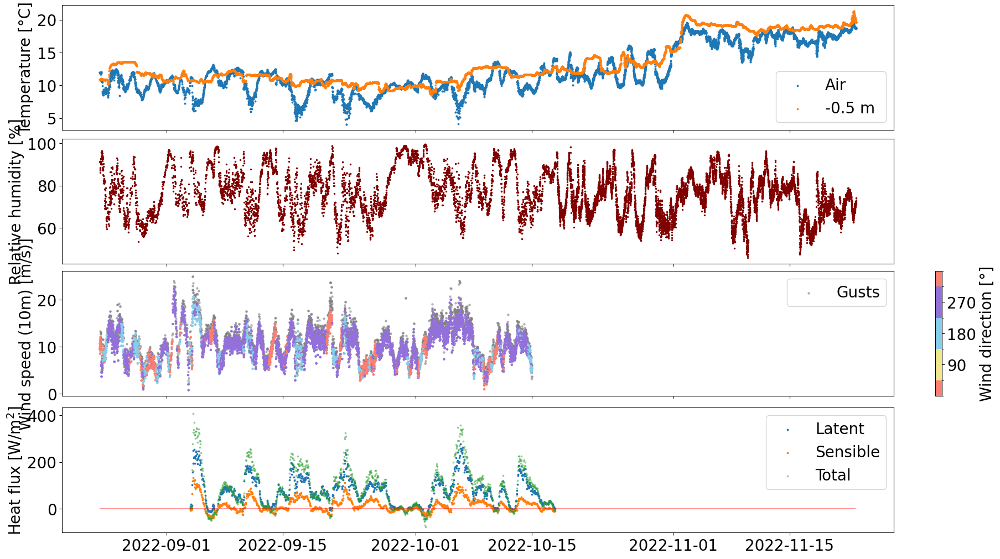

In [71]:
fig, ax= plt.subplots(4, 1,figsize=[18,10], constrained_layout=True, sharex=True)

ax[0].scatter(ds.time, ds.TEMP_AIR_MEAN, s=3, label='Air')
ax[0].scatter(ds.time, ds.TEMP_SBE37_MEAN, s=3, label='-0.5 m ')
#ax[0].scatter(ds.time, ds.TEMP_IR_SEA_WING_UNCOMP_MEAN, s=3, label='Skin ') no data

#ax[0].scatter(ds.time, ds.TEMP_DEPTH_HALFMETER_MEAN, s=5)
ax[0].legend()
ax[0].set_ylabel('Temperature [°C]')

ax[1].scatter(ds.time, ds.RH_MEAN, s=2, color='maroon')
ax[1].set_ylabel('Relative humidity [%]')

#ax[2].scatter(ds.time, ds.UWND_MEAN, s=2)
#v=ax[2].twinx()
cmap = matplotlib.colors.ListedColormap(['salmon', 'khaki', 'skyblue','mediumpurple', 'salmon']) #winddirection colors
#cmap = matplotlib.colormaps['Accent']
bounds = [0, 45, 135, 225, 315, 360] #limits for colors
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N) 

ax[2].scatter(ds.time, ds.GUST_WND_MEAN, c='grey', alpha=0.5, s=5, label='Gusts')
windspeed=ax[2].scatter(ds.time, wind_sp_to_10m(ds.WIND_SPEED_MEAN), s=5, c=dirFULL, cmap=cmap, norm=norm)
fig.colorbar(windspeed, ax=ax[2], label='Wind direction [°]', ticks=[90,180, 270], spacing='proportional')#, pad=-0.0001)
ax[2].set_ylabel('Wind speed (10m) [m/s)]')
ax[2].legend()

#wwind=ax[3].scatter(ds.time, ds.WIND_SPEED_MEAN, c=ds.WWND_MEAN, s=5)
#fig.colorbar(wwind, ax=ax[3], label='W wind [m/s]')
#ax[3].set_ylabel('W wind [m/s]')

ax[3].scatter(dsH2.time, otp.hlb,s=3, label='Latent')
ax[3].scatter(dsH2.time, otp.hsb,s=3, label='Sensible')
ax[3].hlines(0, dsH2.time.min(), dsH2.time.max(), alpha=0.4, colors='r')
ax[3].set_ylabel('Heat flux [W/m$^2$]')

ax[3].scatter(dsH2.time, otp.hlb+otp.hsb ,s=3, label='Total', alpha=0.4)
ax[3].legend()

plt.savefig('figures/firstdata.png')

Figures, thoughts and whats seen. 
Zoom in on certain features, fronts. mark where we have storm-like conditions, stronger winds according to criteria from report to be found.
Make wormplot to see location of SB and color by T. Is the different regions both dominated by T or is the S-O region more S-dominated, is this even what matters here? Clear now that the header is fixed for the COARE file that RH and temp differences affects the Q profiles.
I have w wind parameter, however its not inserted into the coare. This means it is not going to be visible in the flux data, how can I see the effects of the w-wind?

The COARE is going to have a lot of flaws since its just an algorithm tha follows what I input. The contributions are going to be responding to the equation. Does this mean ERA5 will be the dominant base for my investigation regarding atm or ocean processes is dominant? But that is also a model, or reanalysis. So these parameteras are measured at seasurface. Compare them to atmospheric conditions to se if there is any correlation to surface conditions. 

Transect fig with sst

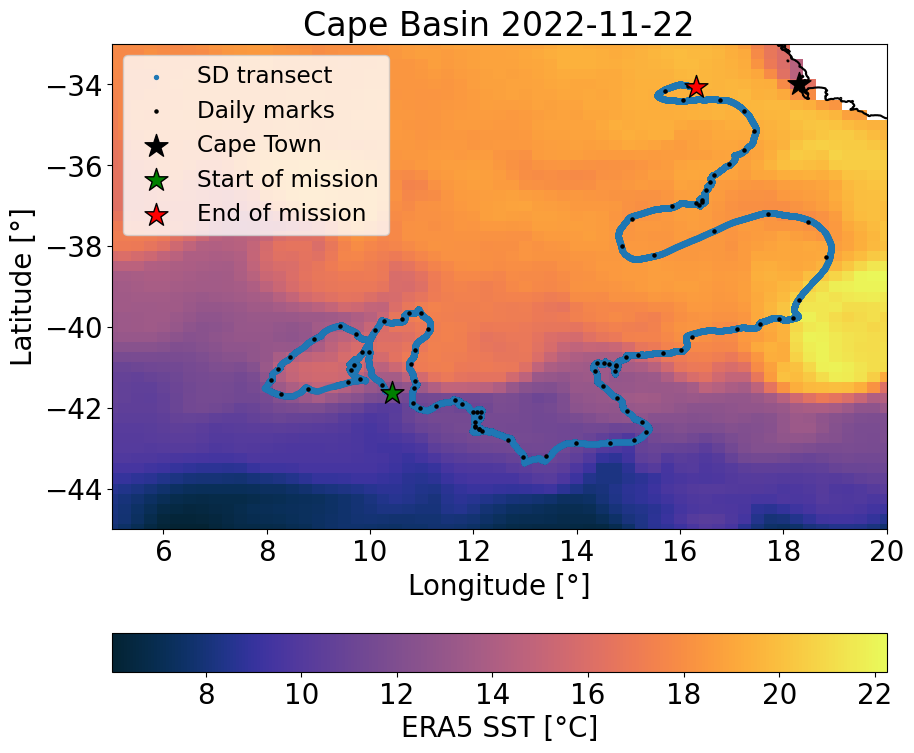

In [104]:
i=2730

plt.rcParams["figure.figsize"] = (10,9)

cbar=plt.pcolormesh(ERA5.longitude, ERA5.latitude, ERA5.sst.isel(time=i)-273.15, cmap=cmo.cm.thermal)
plt.colorbar(cbar, label='ERA5 SST [°C]', orientation='horizontal')

plt.scatter(ds.longitude, ds.latitude, s=8, label='SD transect')
plt.scatter(dsD.longitude, dsD.latitude, c='k', s=5, label='Daily marks')

plt.contour(gebco.lon, gebco.lat, gebco.elevation,levels=[0], colors='k')

plt.xlabel('Longitude [°]')
plt.ylabel('Latitude [°]')

plt.scatter(18.3, -34, c='k', marker='*', s=300, edgecolor='k', label='Cape Town')

plt.scatter(ds.longitude.isel(time=0), ds.latitude.isel(time=0), c='green', marker='*', s=300, edgecolor='k', label='Start of mission')
plt.scatter(ds.longitude.sel(time=ds.time.max()), ds.latitude.sel(time=ds.time.max()), c='r', marker='*', s=300, edgecolor='k', label='End of mission')

plt.xlim(ERA5.longitude.min(), ERA5.longitude.max())
plt.ylim(-45, -33)
plt.legend(fontsize='small')

plt.title('Cape Basin 2022-11-22')

plt.savefig('figures/area.png')

In [ ]:
msk=(ds.WAVE_DOMINANT_PERIOD<80)

dwp=ds.isel(time=msk)

fig, ax= plt.subplots(3, 1,figsize=[18,10], constrained_layout=True, sharex=True)

ax[0].scatter(ds.time, ds.WAVE_SIGNIFICANT_HEIGHT)
ax[0].set_ylabel('Significant wave height [m]')

ax[1].scatter(ds.time, ds.WAVE_DOMINANT_PERIOD)
ax[1].set_ylabel('Dominant wave period [s]')

ax[2].scatter(dwp.time, dwp.WAVE_DOMINANT_PERIOD)
ax[2].set_ylabel('DWP msk [s]')

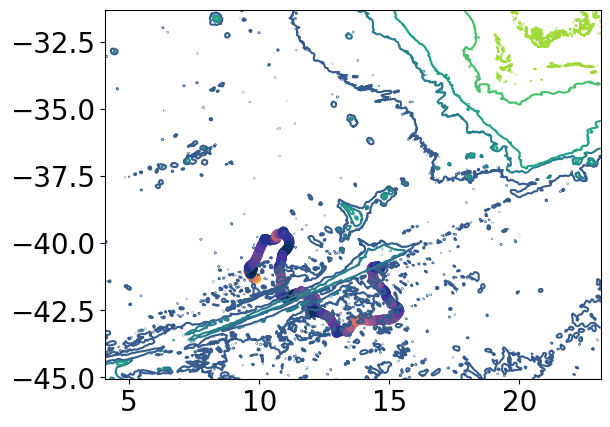

In [35]:
plt.contour(gebco.lon, gebco.lat, gebco.elevation)
plt.scatter(dsH.longitude, dsH.latitude, c=otp.hsb, cmap=cmo.cm.thermal)

Marcels code

In [8]:
#Marcels code
def read_sd(path):

    files = list(pathlib.Path(path).glob('saildrone*.nc'))
    files.sort()
    
    dat = ['WIND_FROM_MEAN',
           'WIND_FROM_STDDEV',
           'WIND_SPEED_MEAN',
           'WIND_SPEED_STDDEV',
           'UWND_MEAN',
           'UWND_STDDEV',
           'VWND_MEAN',
           'VWND_STDDEV',
           'WWND_MEAN',
           'WWND_STDDEV',
           'GUST_WND_MEAN',
           'GUST_WND_STDDEV',
           'WIND_MEASUREMENT_HEIGHT_MEAN',
           'WIND_MEASUREMENT_HEIGHT_STDDEV',
           'TEMP_AIR_MEAN',
           'TEMP_AIR_STDDEV',
           'RH_MEAN',
           'RH_STDDEV',
           'BARO_PRES_MEAN',
           'BARO_PRES_STDDEV',
           'PAR_AIR_MEAN',
           'PAR_AIR_STDDEV',
           'LW_IRRAD_MEAN',
           'LW_IRRAD_STDDEV',
           'SW_IRRAD_TOTAL_MEAN',
           'SW_IRRAD_TOTAL_STDDEV',
           'SW_IRRAD_DIFFUSE_MEAN',
           'SW_IRRAD_DIFFUSE_STDDEV',
           'TEMP_IR_SEA_WING_UNCOMP_MEAN',
           'TEMP_IR_SEA_WING_UNCOMP_STDDEV',
           'WAVE_DOMINANT_PERIOD',
           'WAVE_SIGNIFICANT_HEIGHT',
           'TEMP_DEPTH_HALFMETER_MEAN',
           'TEMP_DEPTH_HALFMETER_STDDEV',
           'TEMP_SBE37_MEAN',
           'TEMP_SBE37_STDDEV',
           'SAL_SBE37_MEAN',
           'SAL_SBE37_STDDEV',
           'COND_SBE37_MEAN',
           'COND_SBE37_STDDEV',
           'O2_CONC_SBE37_MEAN',
           'O2_CONC_SBE37_STDDEV',
           'O2_SAT_SBE37_MEAN',
           'O2_SAT_SBE37_STDDEV',
           'CHLOR_WETLABS_MEAN',
           'CHLOR_WETLABS_STDDEV',
           'XCO2_DRY_SW_MEAN_ASVCO2',
           'XCO2_DRY_AIR_MEAN_ASVCO2'
          ]
    
    # Loading the files
    
    tmp = []
    for i in range(len(files)):
        # [dat] chooses just the data variables. The files had a mismatch in the available variables.
        tmp.append(xr.open_dataset(files[i],engine='netcdf4').sel(trajectory=1067).swap_dims({'obs':'time'})[dat]) 
    ds = xr.concat(tmp,dim='time')
    
    return ds